# Numeric

# Hydra Mutants->
**A machine learning data driven approach for predicting cardio vascular disease **

# Library

In [492]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sc
import sklearn as sk
import seaborn as sns

# Dataset

In [493]:
df_fhs = pd.read_csv('/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/framingham.csv')

In [494]:
df_fhs.head()

,SEX,RANDID,TOTCHOL,AGE,SYSBP,DIABP,CURSMOKE,CIGPDAY,BMI,DIABETES,...,CVD,HYPERTEN,TIMEAP,TIMEMI,TIMEMIFC,TIMECHD,TIMESTRK,TIMECVD,TIMEDTH,TIMEHYP
0,1,2448,195,39,106,70.,0,0,26.97,0,...,1,0,8766,6438,6438,6438,8766,6438,8766,8766
1,1,2448,209,52,121,66.,0,0,.,0,...,1,0,8766,6438,6438,6438,8766,6438,8766,8766
2,2,6238,250,46,121,81.,0,0,28.73,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
3,2,6238,260,52,105,69.,0,0,29.43,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
4,2,6238,237,58,108,66.,0,0,28.5,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766


In [495]:
df_fhs.shape

(11627, 38)

In [496]:
df_fhs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11627 entries, 0 to 11626
Data columns (total 38 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEX       11627 non-null  int64  
 1   RANDID    11627 non-null  int64  
 2   TOTCHOL   11627 non-null  object 
 3   AGE       11627 non-null  int64  
 4   SYSBP     11627 non-null  float64
 5   DIABP     11627 non-null  float64
 6   CURSMOKE  11627 non-null  int64  
 7   CIGPDAY   11627 non-null  object 
 8   BMI       11627 non-null  object 
 9   DIABETES  11627 non-null  int64  
 10  BPMEDS    11627 non-null  object 
 11  HEARTRTE  11627 non-null  object 
 12  GLUCOSE   11627 non-null  object 
 13  PREVCHD   11627 non-null  int64  
 14  PREVAP    11627 non-null  int64  
 15  PREVMI    11627 non-null  int64  
 16  PREVSTRK  11627 non-null  int64  
 17  PREVHYP   11627 non-null  int64  
 18  TIME      11627 non-null  int64  
 19  PERIOD    11627 non-null  int64  
 20  HDLC      11627 non-null  ob

In [497]:
unique_values = df_fhs['TOTCHOL'].unique()
data_type = unique_values.dtype
print(data_type)

object


In [498]:
df_fhs['TOTCHOL'].value_counts(normalize=True)


TOTCHOL
.     0.0
240   0.0
250   0.0
232   0.0
226   0.0
       ..
379   8.6
406   8.6
460   8.6
122   8.6
119   8.6
Name: proportion, Length: 300, dtype: float64

In [499]:
#Basic Descriptive
pd.set_option('display.float_format',lambda x: '%.3r' % x)
df_fhs.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SEX,116,1.5,0.4,1.0,1.0,2.0,2.0,2.0
RANDID,116,500,290,244,247,500,747,999
AGE,116,54.,9.5,32.,48.,54.,62.,81.
SYSBP,116,136,22.,83.,120,132,149,295
DIABP,116,83.,11.,30.,75.,82.,90.,150
CURSMOKE,116,0.4,0.4,0.0,0.0,0.0,1.0,1.0
DIABETES,116,0.0,0.2,0.0,0.0,0.0,0.0,1.0
PREVCHD,116,0.0,0.2,0.0,0.0,0.0,0.0,1.0
PREVAP,116,0.0,0.2,0.0,0.0,0.0,0.0,1.0
PREVMI,116,0.0,0.1,0.0,0.0,0.0,0.0,1.0


# Droping Time data new Dataset

In [500]:
print(df_fhs.columns.tolist())

['SEX', 'RANDID', 'TOTCHOL', 'AGE', 'SYSBP', 'DIABP', 'CURSMOKE', 'CIGPDAY', 'BMI', 'DIABETES', 'BPMEDS', 'HEARTRTE', 'GLUCOSE', 'PREVCHD', 'PREVAP', 'PREVMI', 'PREVSTRK', 'PREVHYP', 'TIME', 'PERIOD', 'HDLC', 'LDLC', 'DEATH', 'ANGINA', 'HOSPMI', 'MI_FCHD', 'ANYCHD', 'STROKE', 'CVD', 'HYPERTEN', 'TIMEAP', 'TIMEMI', 'TIMEMIFC', 'TIMECHD', 'TIMESTRK', 'TIMECVD', 'TIMEDTH', 'TIMEHYP']


In [501]:
df_fhs2 = df_fhs.drop(['TIME','PERIOD','DEATH','TIMEAP', 'TIMEMI', 'TIMEMIFC', 'TIMECHD', 'TIMESTRK', 'TIMECVD', 'TIMEDTH', 'TIMEHYP'],axis = 1)

In [502]:
df_fhs2.head()

,SEX,RANDID,TOTCHOL,AGE,SYSBP,DIABP,CURSMOKE,CIGPDAY,BMI,DIABETES,...,PREVHYP,HDLC,LDLC,ANGINA,HOSPMI,MI_FCHD,ANYCHD,STROKE,CVD,HYPERTEN
0,1,2448,195,39,106,70.,0,0,26.97,0,...,0,.,.,0,1,1,1,0,1,0
1,1,2448,209,52,121,66.,0,0,.,0,...,0,31,178,0,1,1,1,0,1,0
2,2,6238,250,46,121,81.,0,0,28.73,0,...,0,.,.,0,0,0,0,0,0,0
3,2,6238,260,52,105,69.,0,0,29.43,0,...,0,.,.,0,0,0,0,0,0,0
4,2,6238,237,58,108,66.,0,0,28.5,0,...,0,54,141,0,0,0,0,0,0,0


In [503]:
#reshaping missing value
df_fhs2.replace('.',np.nan,inplace =True)

#Finding Missing Value

In [504]:
df_fhs2.isnull()

,SEX,RANDID,TOTCHOL,AGE,SYSBP,DIABP,CURSMOKE,CIGPDAY,BMI,DIABETES,...,PREVHYP,HDLC,LDLC,ANGINA,HOSPMI,MI_FCHD,ANYCHD,STROKE,CVD,HYPERTEN
0,False,False,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11622,False,False,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,False,False,False,False
11623,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
11624,False,False,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,False,False,False,False
11625,False,False,False,False,False,False,False,False,False,False,...,False,True,True,False,False,False,False,False,False,False


In [505]:
df_fhs2.isnull().sum()

SEX            0
RANDID         0
TOTCHOL      409
AGE            0
SYSBP          0
DIABP          0
CURSMOKE       0
CIGPDAY       79
BMI           52
DIABETES       0
BPMEDS       593
HEARTRTE       6
GLUCOSE     1440
PREVCHD        0
PREVAP         0
PREVMI         0
PREVSTRK       0
PREVHYP        0
HDLC        8600
LDLC        8601
ANGINA         0
HOSPMI         0
MI_FCHD        0
ANYCHD         0
STROKE         0
CVD            0
HYPERTEN       0
dtype: int64

In [506]:
#which colunms are missing values and what is the extent of the missingness?
df_fhs2.isnull().sum()/len(df_fhs2)*100

SEX        0.0
RANDID     0.0
TOTCHOL    3.5
AGE        0.0
SYSBP      0.0
DIABP      0.0
CURSMOKE   0.0
CIGPDAY    0.6
BMI        0.4
DIABETES   0.0
BPMEDS     5.1
HEARTRTE   0.0
GLUCOSE    12.
PREVCHD    0.0
PREVAP     0.0
PREVMI     0.0
PREVSTRK   0.0
PREVHYP    0.0
HDLC       73.
LDLC       73.
ANGINA     0.0
HOSPMI     0.0
MI_FCHD    0.0
ANYCHD     0.0
STROKE     0.0
CVD        0.0
HYPERTEN   0.0
dtype: float64

In [507]:
print(df_fhs2.columns.tolist())

['SEX', 'RANDID', 'TOTCHOL', 'AGE', 'SYSBP', 'DIABP', 'CURSMOKE', 'CIGPDAY', 'BMI', 'DIABETES', 'BPMEDS', 'HEARTRTE', 'GLUCOSE', 'PREVCHD', 'PREVAP', 'PREVMI', 'PREVSTRK', 'PREVHYP', 'HDLC', 'LDLC', 'ANGINA', 'HOSPMI', 'MI_FCHD', 'ANYCHD', 'STROKE', 'CVD', 'HYPERTEN']


In [508]:
#dropping High missing value featre and getting new data set
df_fhs3 = df_fhs2.drop(['HDLC', 'LDLC'],axis=1)
df_fhs3.isnull().sum()/len(df_fhs3)*100

SEX        0.0
RANDID     0.0
TOTCHOL    3.5
AGE        0.0
SYSBP      0.0
DIABP      0.0
CURSMOKE   0.0
CIGPDAY    0.6
BMI        0.4
DIABETES   0.0
BPMEDS     5.1
HEARTRTE   0.0
GLUCOSE    12.
PREVCHD    0.0
PREVAP     0.0
PREVMI     0.0
PREVSTRK   0.0
PREVHYP    0.0
ANGINA     0.0
HOSPMI     0.0
MI_FCHD    0.0
ANYCHD     0.0
STROKE     0.0
CVD        0.0
HYPERTEN   0.0
dtype: float64

In [509]:
df_fhs3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11627 entries, 0 to 11626
Data columns (total 25 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEX       11627 non-null  int64  
 1   RANDID    11627 non-null  int64  
 2   TOTCHOL   11218 non-null  object 
 3   AGE       11627 non-null  int64  
 4   SYSBP     11627 non-null  float64
 5   DIABP     11627 non-null  float64
 6   CURSMOKE  11627 non-null  int64  
 7   CIGPDAY   11548 non-null  object 
 8   BMI       11575 non-null  object 
 9   DIABETES  11627 non-null  int64  
 10  BPMEDS    11034 non-null  object 
 11  HEARTRTE  11621 non-null  object 
 12  GLUCOSE   10187 non-null  object 
 13  PREVCHD   11627 non-null  int64  
 14  PREVAP    11627 non-null  int64  
 15  PREVMI    11627 non-null  int64  
 16  PREVSTRK  11627 non-null  int64  
 17  PREVHYP   11627 non-null  int64  
 18  ANGINA    11627 non-null  int64  
 19  HOSPMI    11627 non-null  int64  
 20  MI_FCHD   11627 non-null  in

In [510]:
column_data = df_fhs3['CIGPDAY'].to_numpy()
string_count = np.sum([isinstance(x, str) for x in column_data])
print(f"Count of string values in 'your_column': {string_count}")


Count of string values in 'your_column': 11548


In [511]:
df_fhs3['TOTCHOL'] = pd.to_numeric(df_fhs3['TOTCHOL'], errors='coerce')
df_fhs3['CIGPDAY'] = pd.to_numeric(df_fhs3['CIGPDAY'], errors='coerce')
df_fhs3['BMI'] = pd.to_numeric(df_fhs3['BMI'], errors='coerce')
df_fhs3['BPMEDS'] = pd.to_numeric(df_fhs3['BPMEDS'], errors='coerce')
df_fhs3['HEARTRTE'] = pd.to_numeric(df_fhs3['HEARTRTE'], errors='coerce')
df_fhs3['GLUCOSE'] = pd.to_numeric(df_fhs3['GLUCOSE'], errors='coerce')
df_fhs3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11627 entries, 0 to 11626
Data columns (total 25 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEX       11627 non-null  int64  
 1   RANDID    11627 non-null  int64  
 2   TOTCHOL   11218 non-null  float64
 3   AGE       11627 non-null  int64  
 4   SYSBP     11627 non-null  float64
 5   DIABP     11627 non-null  float64
 6   CURSMOKE  11627 non-null  int64  
 7   CIGPDAY   11548 non-null  float64
 8   BMI       11575 non-null  float64
 9   DIABETES  11627 non-null  int64  
 10  BPMEDS    11034 non-null  float64
 11  HEARTRTE  11621 non-null  float64
 12  GLUCOSE   10187 non-null  float64
 13  PREVCHD   11627 non-null  int64  
 14  PREVAP    11627 non-null  int64  
 15  PREVMI    11627 non-null  int64  
 16  PREVSTRK  11627 non-null  int64  
 17  PREVHYP   11627 non-null  int64  
 18  ANGINA    11627 non-null  int64  
 19  HOSPMI    11627 non-null  int64  
 20  MI_FCHD   11627 non-null  in

In [512]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(missing_values=np.nan, strategy='median')
imputer.fit(df_fhs3[['TOTCHOL', 'GLUCOSE','BMI','CIGPDAY','BPMEDS']])

# Select columns 2 and 12 explicitly
df_fhs3[['TOTCHOL', 'GLUCOSE','BMI','CIGPDAY','BPMEDS']] = imputer.transform(df_fhs3[['TOTCHOL', 'GLUCOSE','BMI','CIGPDAY','BPMEDS']])

In [513]:
df_fhs3.isnull().sum()/len(df_fhs3)*100

SEX        0.0
RANDID     0.0
TOTCHOL    0.0
AGE        0.0
SYSBP      0.0
DIABP      0.0
CURSMOKE   0.0
CIGPDAY    0.0
BMI        0.0
DIABETES   0.0
BPMEDS     0.0
HEARTRTE   0.0
GLUCOSE    0.0
PREVCHD    0.0
PREVAP     0.0
PREVMI     0.0
PREVSTRK   0.0
PREVHYP    0.0
ANGINA     0.0
HOSPMI     0.0
MI_FCHD    0.0
ANYCHD     0.0
STROKE     0.0
CVD        0.0
HYPERTEN   0.0
dtype: float64

#CHECKING FOR DUPLICATES

In [514]:
df_fhs3.duplicated().sum()/len(df_fhs3)*100

0.0

#Target Variable

In [515]:
df_fhs3['CVD'].value_counts(normalize=True)

CVD
0   0.7
1   0.2
Name: proportion, dtype: float64

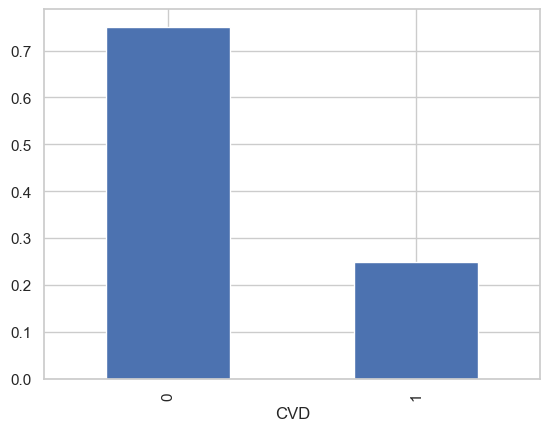

In [516]:
df_fhs3['CVD'].value_counts(normalize=True).plot(kind = 'bar')
plt.show()

In [517]:
df_fhs3.dtypes
df_fhs3.groupby('SEX')['CVD'].mean()


SEX
1   0.3
2   0.1
Name: CVD, dtype: float64

In [518]:
df_fhs3['CVD'].value_counts(normalize=True)


CVD
0   0.7
1   0.2
Name: proportion, dtype: float64

<Axes: xlabel='CVD'>

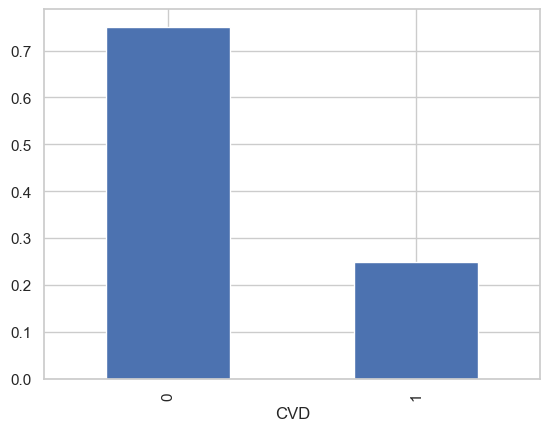

In [519]:
df_fhs3['CVD'].value_counts(normalize=True).plot(kind='bar')


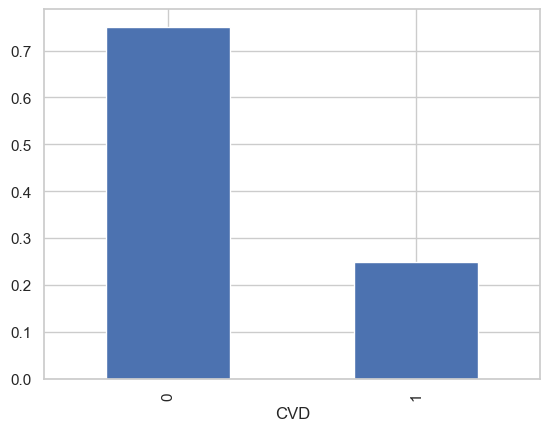

In [520]:
df_fhs3['CVD'].value_counts(normalize=True).plot(kind='bar')
plt.show()

In [521]:
df_fhs3.groupby('SEX')['CVD'].mean()


SEX
1   0.3
2   0.1
Name: CVD, dtype: float64

In [522]:
df_fhs3.nunique().sort_values()

SEX            2
STROKE         2
ANYCHD         2
MI_FCHD        2
HOSPMI         2
ANGINA         2
PREVHYP        2
PREVSTRK       2
PREVMI         2
PREVAP         2
PREVCHD        2
CVD            2
HYPERTEN       2
BPMEDS         2
DIABETES       2
CURSMOKE       2
CIGPDAY       45
AGE           50
HEARTRTE      83
DIABP        160
GLUCOSE      211
SYSBP        260
TOTCHOL      299
BMI         1818
RANDID      4434
dtype: int64

In [523]:
df_fhs3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11627 entries, 0 to 11626
Data columns (total 25 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEX       11627 non-null  int64  
 1   RANDID    11627 non-null  int64  
 2   TOTCHOL   11627 non-null  float64
 3   AGE       11627 non-null  int64  
 4   SYSBP     11627 non-null  float64
 5   DIABP     11627 non-null  float64
 6   CURSMOKE  11627 non-null  int64  
 7   CIGPDAY   11627 non-null  float64
 8   BMI       11627 non-null  float64
 9   DIABETES  11627 non-null  int64  
 10  BPMEDS    11627 non-null  float64
 11  HEARTRTE  11621 non-null  float64
 12  GLUCOSE   11627 non-null  float64
 13  PREVCHD   11627 non-null  int64  
 14  PREVAP    11627 non-null  int64  
 15  PREVMI    11627 non-null  int64  
 16  PREVSTRK  11627 non-null  int64  
 17  PREVHYP   11627 non-null  int64  
 18  ANGINA    11627 non-null  int64  
 19  HOSPMI    11627 non-null  int64  
 20  MI_FCHD   11627 non-null  in

#Exploratory Data Analysis

In [524]:
unique_data_types = df_fhs3['HEARTRTE'].apply(type).unique()
print(unique_data_types)

[<class 'float'>]


In [525]:
columns_with_few_uniques = df_fhs3.columns[df_fhs3.nunique() < 3]
fhs_cat = df_fhs3[columns_with_few_uniques]
fhs_cat

,SEX,CURSMOKE,DIABETES,BPMEDS,PREVCHD,PREVAP,PREVMI,PREVSTRK,PREVHYP,ANGINA,HOSPMI,MI_FCHD,ANYCHD,STROKE,CVD,HYPERTEN
0,1,0,0,0.0,0,0,0,0,0,0,1,1,1,0,1,0
1,1,0,0,0.0,0,0,0,0,0,0,1,1,1,0,1,0
2,2,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0
3,2,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0
4,2,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11622,1,0,0,0.0,0,0,0,0,1,0,0,0,0,0,0,1
11623,1,0,0,0.0,0,0,0,0,1,0,0,0,0,0,0,1
11624,2,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,1
11625,2,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,1


In [526]:
columns_with_few_uniques = df_fhs3.columns[df_fhs3.nunique() > 3]
fhs_cont = df_fhs3[columns_with_few_uniques]
fhs_cont

,RANDID,TOTCHOL,AGE,SYSBP,DIABP,CIGPDAY,BMI,HEARTRTE,GLUCOSE
0,2448,195,39,106,70.,0.0,26.,80.,77.
1,2448,209,52,121,66.,0.0,25.,69.,92.
2,6238,250,46,121,81.,0.0,28.,95.,76.
3,6238,260,52,105,69.,0.0,29.,80.,86.
4,6238,237,58,108,66.,0.0,28.,80.,71.
...,...,...,...,...,...,...,...,...,...
11622,9998212,173,46,126,82.,0.0,19.,70.,80.
11623,9998212,153,52,143,89.,0.0,25.,65.,72.
11624,9999312,196,39,133,86.,30.,20.,85.,80.
11625,9999312,240,46,138,79.,20.,26.,90.,83.


<Figure size 1200x700 with 0 Axes>

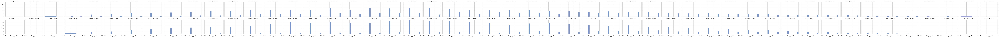

In [527]:
plt.figure(figsize=(12,7))
g = sns.FacetGrid(df_fhs3,row = 'SEX', col = 'AGE')
g.map(sns.histplot, "CVD")
plt.show()

<Figure size 1200x700 with 0 Axes>

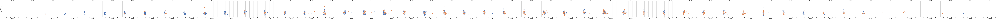

In [528]:
plt.figure(figsize=(12,7))
g = sns.FacetGrid(df_fhs3,hue = 'CVD',col = 'AGE', height = 5)
g.map(sns.scatterplot, "GLUCOSE","TOTCHOL")
plt.show()

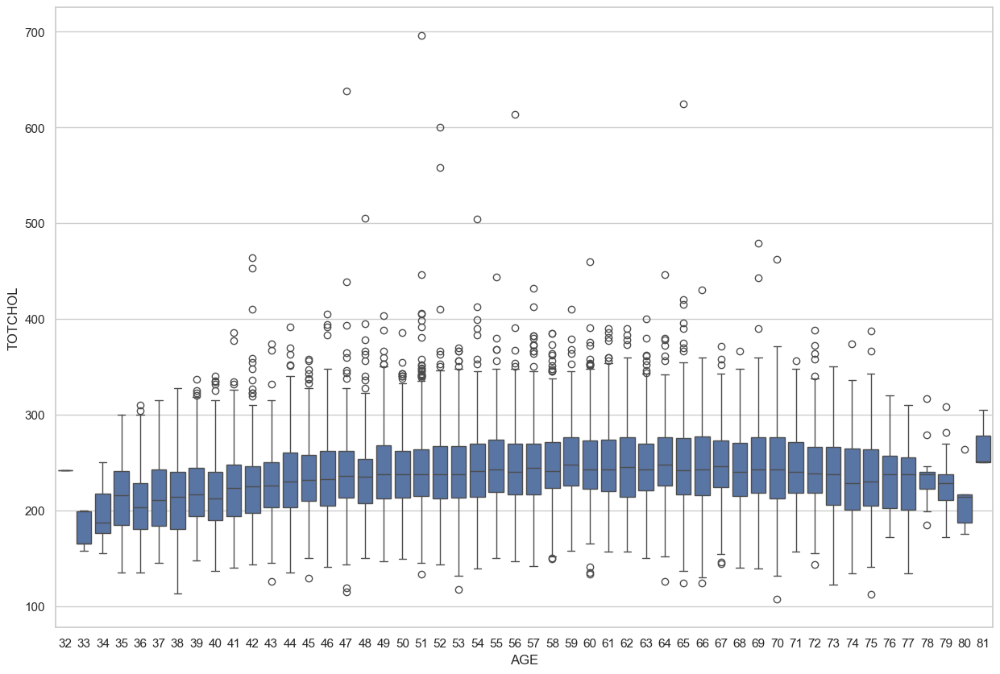

In [529]:
fig,ax = plt.subplots(figsize=(15,10))
sns.boxplot(data=df_fhs3,x="AGE",y="TOTCHOL",ax=ax)
plt.show()

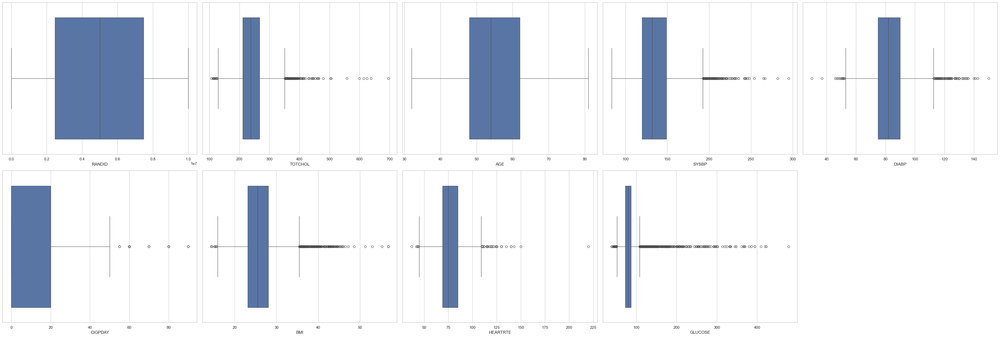

In [530]:
plt.figure(figsize = (40,40))
for i in enumerate(fhs_cont.columns):
  plt.subplot(6,5,i[0]+1)
  sns.boxplot(x=i[1],data=fhs_cont)
plt.tight_layout()

WE CAN SEE OUTLIER HEREE we will handle it later


#Generate Machine Learning Model

In [531]:
#Distribution In target Variable
df_fhs3['CVD'].value_counts()

CVD
0    8728
1    2899
Name: count, dtype: int64

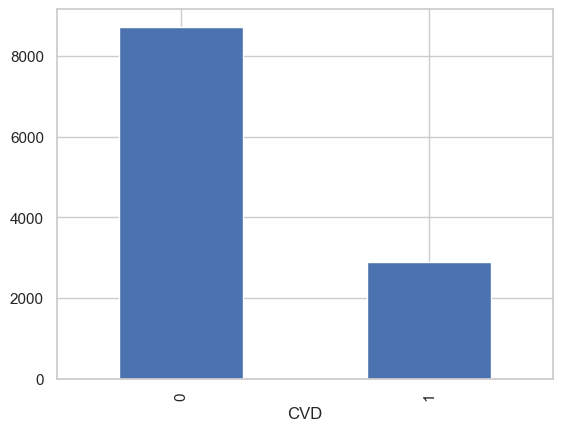

In [532]:
#Visualize the distribution in target variable barchart
df_fhs3['CVD'].value_counts().plot(kind='bar')
plt.show()

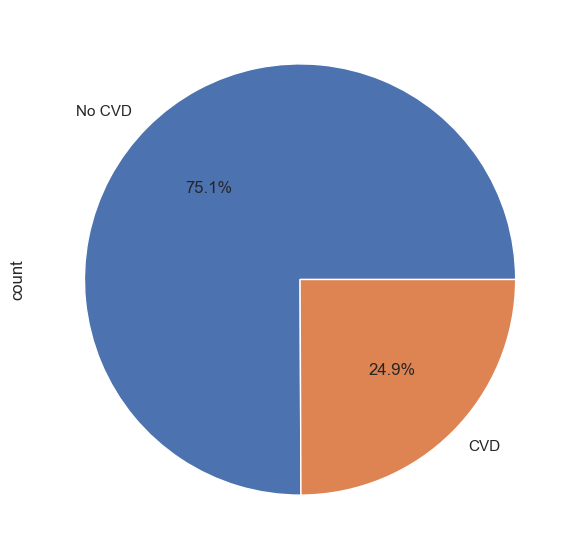

In [533]:
#visualize the distribution in target variable - piechart
plt.figure(figsize=(10,7))
df_fhs3['CVD'].value_counts().plot(kind='pie',autopct = '%1.1f%%',labels = ['No CVD','CVD'])
plt.show()

#Separating Data

In [534]:
print(df_fhs3.columns.tolist())

['SEX', 'RANDID', 'TOTCHOL', 'AGE', 'SYSBP', 'DIABP', 'CURSMOKE', 'CIGPDAY', 'BMI', 'DIABETES', 'BPMEDS', 'HEARTRTE', 'GLUCOSE', 'PREVCHD', 'PREVAP', 'PREVMI', 'PREVSTRK', 'PREVHYP', 'ANGINA', 'HOSPMI', 'MI_FCHD', 'ANYCHD', 'STROKE', 'CVD', 'HYPERTEN']


In [535]:
#separate array into input x and output y
X = df_fhs3.drop(columns=['CVD', 'RANDID'])
y = df_fhs3['CVD']
print(X.shape,y.shape)
X.info()

(11627, 23) (11627,)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11627 entries, 0 to 11626
Data columns (total 23 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEX       11627 non-null  int64  
 1   TOTCHOL   11627 non-null  float64
 2   AGE       11627 non-null  int64  
 3   SYSBP     11627 non-null  float64
 4   DIABP     11627 non-null  float64
 5   CURSMOKE  11627 non-null  int64  
 6   CIGPDAY   11627 non-null  float64
 7   BMI       11627 non-null  float64
 8   DIABETES  11627 non-null  int64  
 9   BPMEDS    11627 non-null  float64
 10  HEARTRTE  11621 non-null  float64
 11  GLUCOSE   11627 non-null  float64
 12  PREVCHD   11627 non-null  int64  
 13  PREVAP    11627 non-null  int64  
 14  PREVMI    11627 non-null  int64  
 15  PREVSTRK  11627 non-null  int64  
 16  PREVHYP   11627 non-null  int64  
 17  ANGINA    11627 non-null  int64  
 18  HOSPMI    11627 non-null  int64  
 19  MI_FCHD   11627 non-null  int64  
 20  ANYCHD 

#Nan value handling

In [536]:
#As we know SMOTE doesnt work on NAN value
rows_with_nans = df_fhs3[df_fhs3.isna().any(axis=1)]
print(rows_with_nans)

       SEX   RANDID  TOTCHOL  AGE  SYSBP  DIABP  CURSMOKE  CIGPDAY  BMI  \
1299     2  1080920      193   70    168    70.         0      0.0  25.   
1434     2  1186959      238   73    200    100         1      2.0  36.   
1847     1  1557925      219   64    172    75.         1      18.  29.   
2630     2  2235925      238   77    202    95.         0      0.0  25.   
3500     2  3029122      238   71    124    80.         1      0.0  25.   
10250    2  8878837      172   76    148    90.         1      0.0  25.   

       DIABETES  ...  PREVMI  PREVSTRK  PREVHYP  ANGINA  HOSPMI  MI_FCHD  \
1299          1  ...       1         1        1       0       0        1   
1434          0  ...       0         0        1       0       0        0   
1847          0  ...       0         0        1       0       1        1   
2630          0  ...       0         0        1       1       0        0   
3500          0  ...       0         0        0       0       0        0   
10250         1  .

In [537]:
df_fhs3.isnull().sum()

SEX         0
RANDID      0
TOTCHOL     0
AGE         0
SYSBP       0
DIABP       0
CURSMOKE    0
CIGPDAY     0
BMI         0
DIABETES    0
BPMEDS      0
HEARTRTE    6
GLUCOSE     0
PREVCHD     0
PREVAP      0
PREVMI      0
PREVSTRK    0
PREVHYP     0
ANGINA      0
HOSPMI      0
MI_FCHD     0
ANYCHD      0
STROKE      0
CVD         0
HYPERTEN    0
dtype: int64

In [538]:
print("NaN values in x:")
print(X.isna().sum())

# Check for NaNs in y
print("NaN values in y:")
print(y.isna().sum())

NaN values in x:
SEX         0
TOTCHOL     0
AGE         0
SYSBP       0
DIABP       0
CURSMOKE    0
CIGPDAY     0
BMI         0
DIABETES    0
BPMEDS      0
HEARTRTE    6
GLUCOSE     0
PREVCHD     0
PREVAP      0
PREVMI      0
PREVSTRK    0
PREVHYP     0
ANGINA      0
HOSPMI      0
MI_FCHD     0
ANYCHD      0
STROKE      0
HYPERTEN    0
dtype: int64
NaN values in y:
0


In [539]:
#Droping Nan colunm
X = X.dropna()
y = y[X.index]
print(X.shape,y.shape)
print(y[:5])

(11621, 23) (11621,)
0    1
1    1
2    0
3    0
4    0
Name: CVD, dtype: int64


# Outlier handling

In [540]:
from sklearn.ensemble import IsolationForest


# Initialize Isolation Forest model
iso_forest = IsolationForest(contamination=0.1, random_state=42)

# Fit the model and predict outliers
outliers = iso_forest.fit_predict(X)

# Filter outliers
x_filtered = X[outliers == 1]
y_filtered = y[outliers == 1]

# Display the shapes of x_filtered and y_filtered to confirm
print("Shape of x_filtered:", x_filtered.shape)
print("Shape of y_filtered:", y_filtered.shape)

Shape of x_filtered: (10459, 23)
Shape of y_filtered: (10459,)


# Dataset Distribution Check

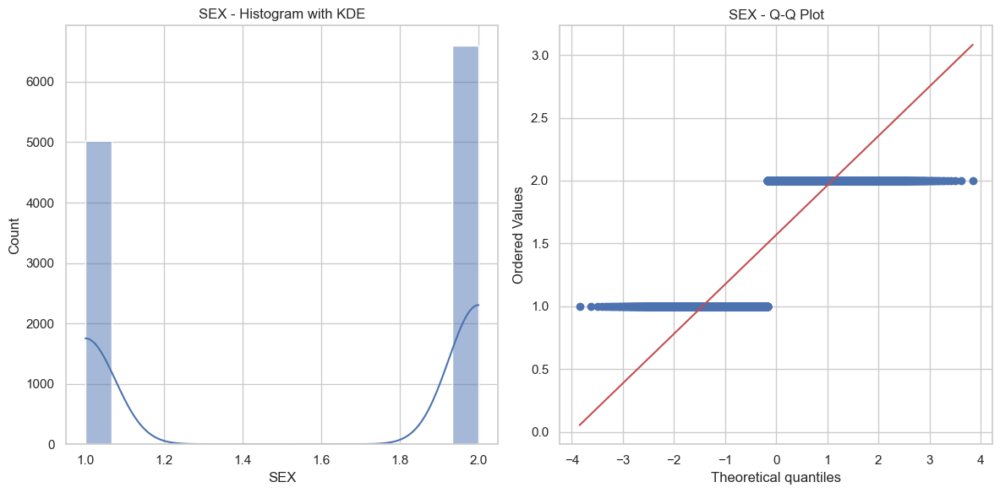


SEX is binary. Checking for Bernoulli distribution.
Proportion of 1's in SEX: 1.5679373547887445
Binomial test p-value: nan
The binary data for SEX is likely NOT following a Bernoulli distribution (reject H0).


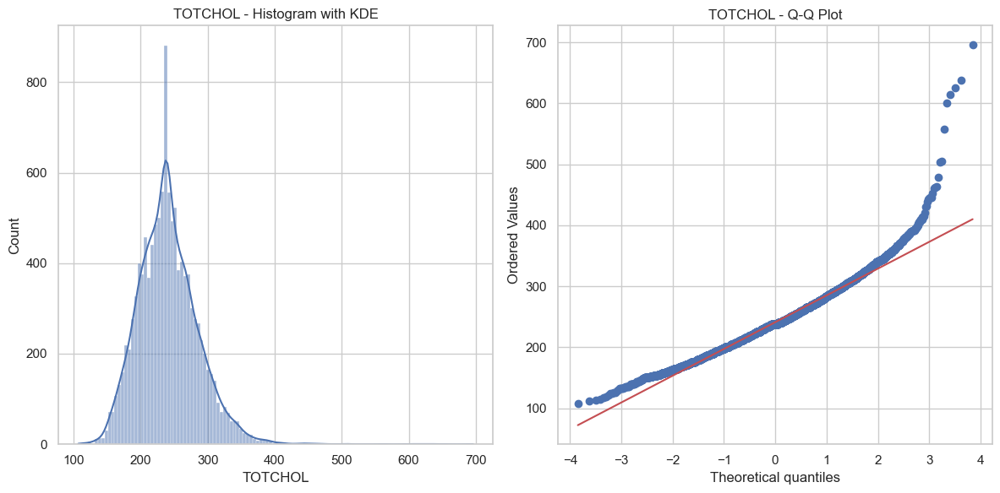


TOTCHOL is numeric. Checking for normality.
Shapiro-Wilk Test: p-value = 5.268854240247809e-44
The data for TOTCHOL is likely NOT normally distributed (reject H0).
D'Agostino and Pearson's Test: p-value = 0.0
The data for TOTCHOL is likely NOT normally distributed (reject H0).
Anderson-Darling Test: AndersonResult(statistic=37.605691444734475, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=241.0639359779709, scale=44.570850495636165)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
The data for TOTCHOL is likely NOT normally distributed (reject H0) at significance level 15.0%.
The data for TOTCHOL is likely NOT normally distributed (reject H0) at significance level 10.0%.
The data for TOTCHOL is likely NOT normally distributed (reject H0) at significance level 5.0%.
The data for TOTCHOL is likely NOT normally distributed (reject H0) at signific

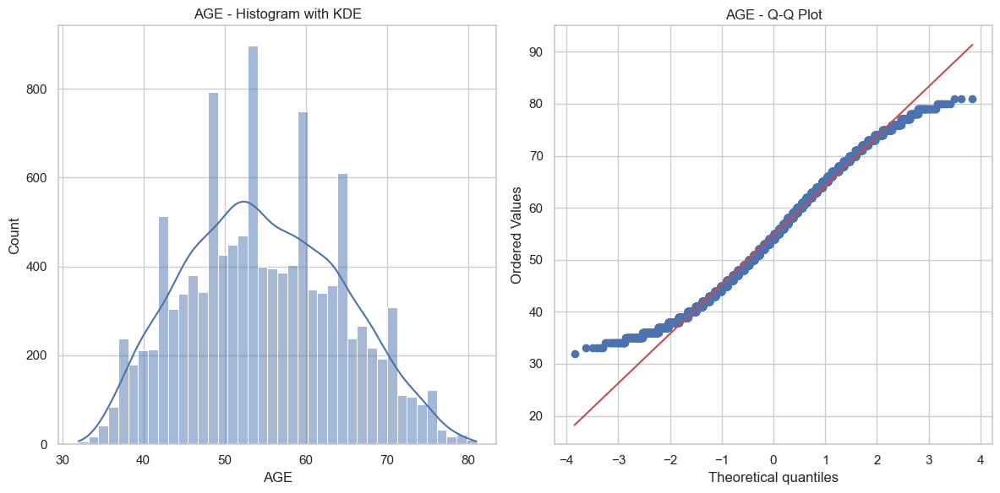


AGE is numeric. Checking for normality.
Shapiro-Wilk Test: p-value = 3.113538001166459e-29
The data for AGE is likely NOT normally distributed (reject H0).
D'Agostino and Pearson's Test: p-value = 4.990637717685018e-118
The data for AGE is likely NOT normally distributed (reject H0).
Anderson-Darling Test: AndersonResult(statistic=29.60932234368738, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=54.78401170295155, scale=9.558425599760781)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
The data for AGE is likely NOT normally distributed (reject H0) at significance level 15.0%.
The data for AGE is likely NOT normally distributed (reject H0) at significance level 10.0%.
The data for AGE is likely NOT normally distributed (reject H0) at significance level 5.0%.
The data for AGE is likely NOT normally distributed (reject H0) at significance level 

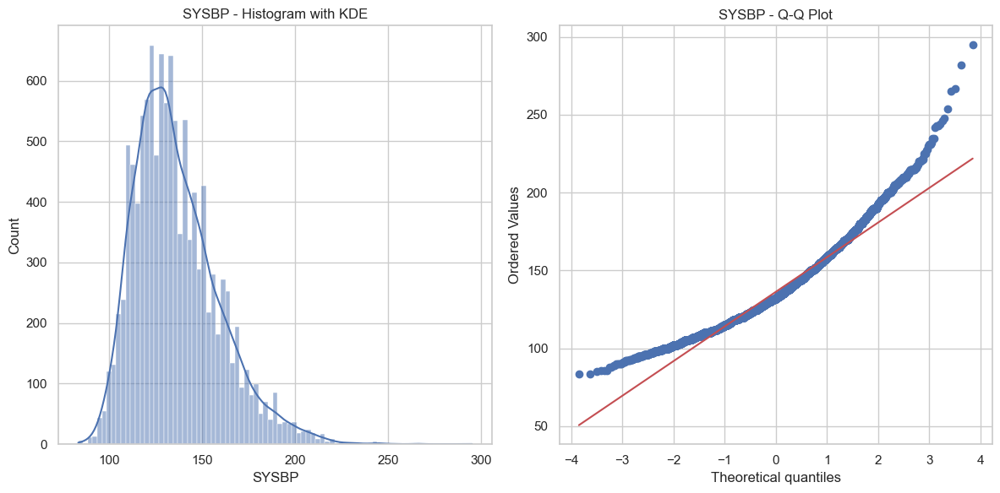


SYSBP is numeric. Checking for normality.
Shapiro-Wilk Test: p-value = 4.0982243336572187e-51
The data for SYSBP is likely NOT normally distributed (reject H0).
D'Agostino and Pearson's Test: p-value = 0.0
The data for SYSBP is likely NOT normally distributed (reject H0).
Anderson-Darling Test: AndersonResult(statistic=124.83073234384938, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=136.3071594527149, scale=22.78367425955178)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
The data for SYSBP is likely NOT normally distributed (reject H0) at significance level 15.0%.
The data for SYSBP is likely NOT normally distributed (reject H0) at significance level 10.0%.
The data for SYSBP is likely NOT normally distributed (reject H0) at significance level 5.0%.
The data for SYSBP is likely NOT normally distributed (reject H0) at significance level 2.5

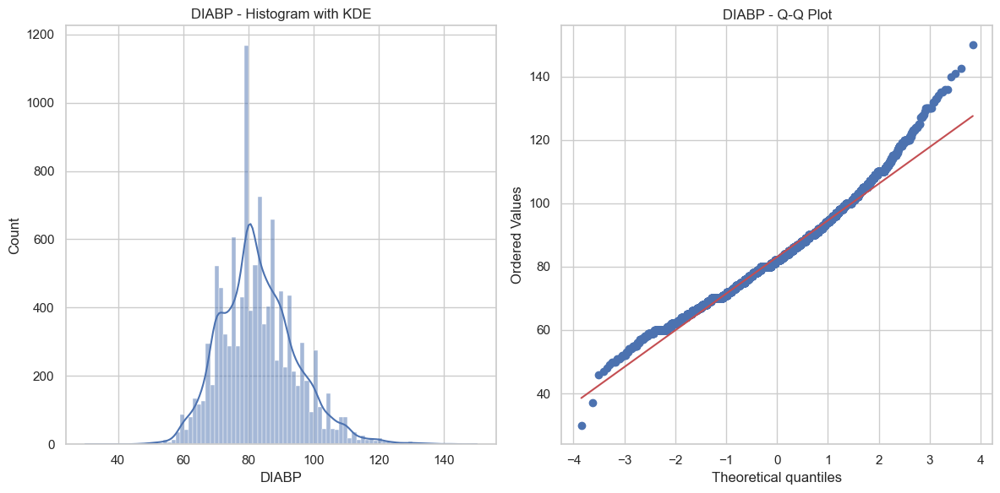


DIABP is numeric. Checking for normality.
Shapiro-Wilk Test: p-value = 2.1134433750801168e-35
The data for DIABP is likely NOT normally distributed (reject H0).
D'Agostino and Pearson's Test: p-value = 2.6125100425643467e-157
The data for DIABP is likely NOT normally distributed (reject H0).
Anderson-Darling Test: AndersonResult(statistic=42.90453857511966, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=83.03670080027537, scale=11.66044107887572)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
The data for DIABP is likely NOT normally distributed (reject H0) at significance level 15.0%.
The data for DIABP is likely NOT normally distributed (reject H0) at significance level 10.0%.
The data for DIABP is likely NOT normally distributed (reject H0) at significance level 5.0%.
The data for DIABP is likely NOT normally distributed (reject H0) at sig

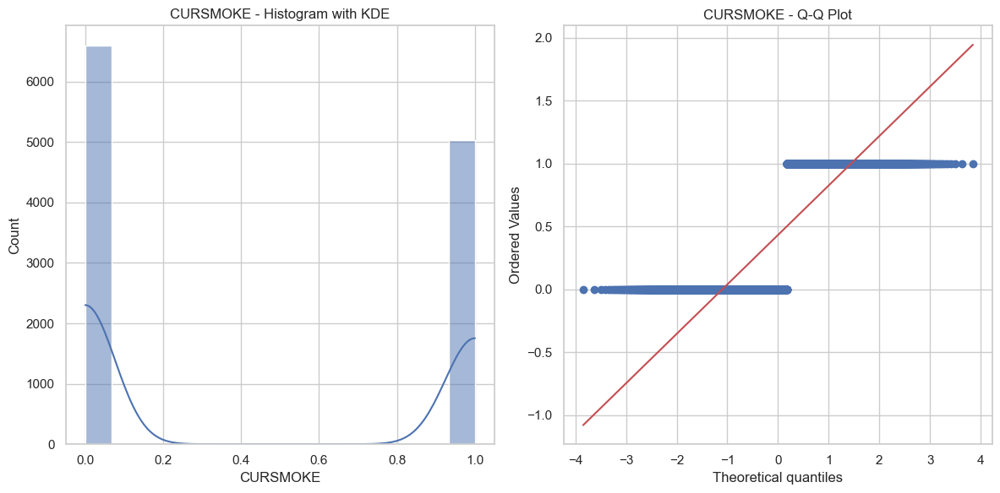


CURSMOKE is binary. Checking for Bernoulli distribution.
Proportion of 1's in CURSMOKE: 0.4324068496687032
Binomial test p-value: 1.007133299343916
The binary data for CURSMOKE is likely following a Bernoulli distribution (fail to reject H0).


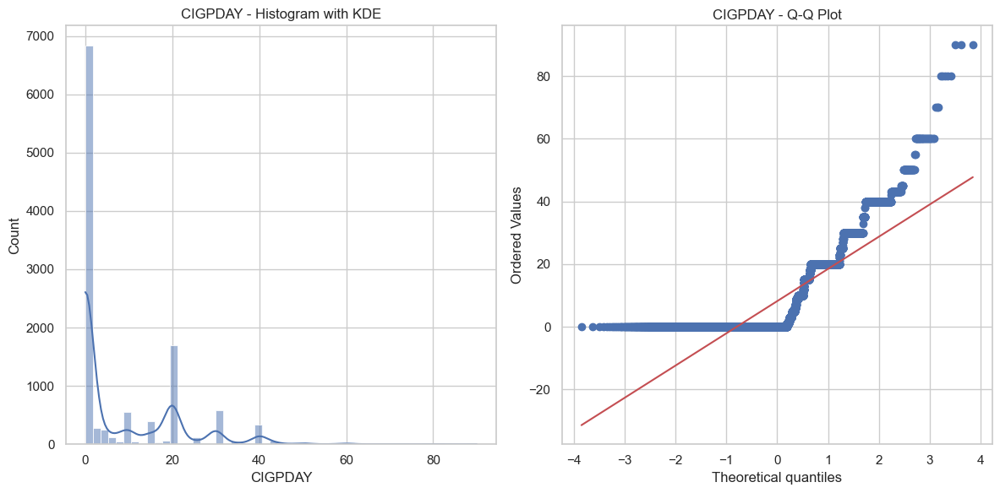


CIGPDAY is numeric. Checking for normality.
Shapiro-Wilk Test: p-value = 3.908705723811301e-88
The data for CIGPDAY is likely NOT normally distributed (reject H0).
D'Agostino and Pearson's Test: p-value = 0.0
The data for CIGPDAY is likely NOT normally distributed (reject H0).
Anderson-Darling Test: AndersonResult(statistic=1387.1099320920166, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=8.196798898545737, scale=12.16602348533334)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
The data for CIGPDAY is likely NOT normally distributed (reject H0) at significance level 15.0%.
The data for CIGPDAY is likely NOT normally distributed (reject H0) at significance level 10.0%.
The data for CIGPDAY is likely NOT normally distributed (reject H0) at significance level 5.0%.
The data for CIGPDAY is likely NOT normally distributed (reject H0) at significa

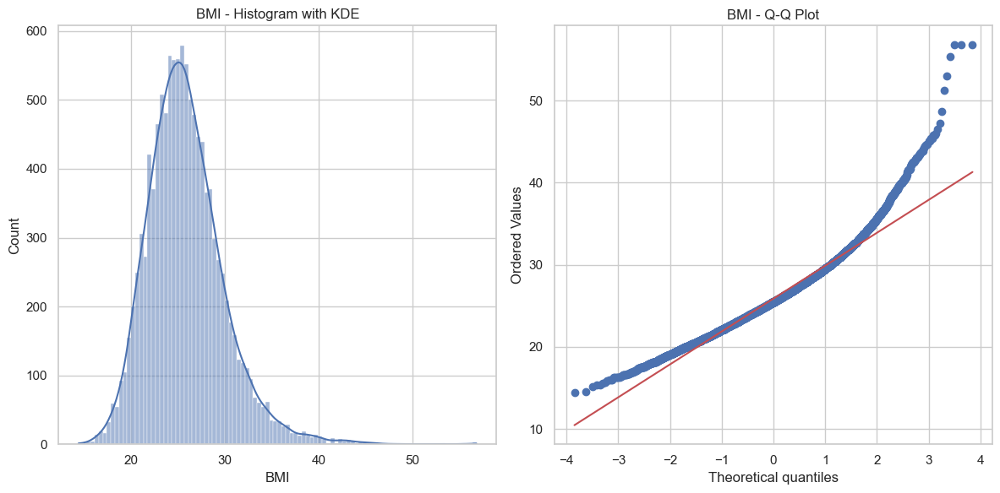


BMI is numeric. Checking for normality.
Shapiro-Wilk Test: p-value = 2.8650680711563685e-49
The data for BMI is likely NOT normally distributed (reject H0).
D'Agostino and Pearson's Test: p-value = 0.0
The data for BMI is likely NOT normally distributed (reject H0).
Anderson-Darling Test: AndersonResult(statistic=73.09468030386597, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=25.874497031236558, scale=4.093274875571327)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
The data for BMI is likely NOT normally distributed (reject H0) at significance level 15.0%.
The data for BMI is likely NOT normally distributed (reject H0) at significance level 10.0%.
The data for BMI is likely NOT normally distributed (reject H0) at significance level 5.0%.
The data for BMI is likely NOT normally distributed (reject H0) at significance level 2.5%.
The data fo

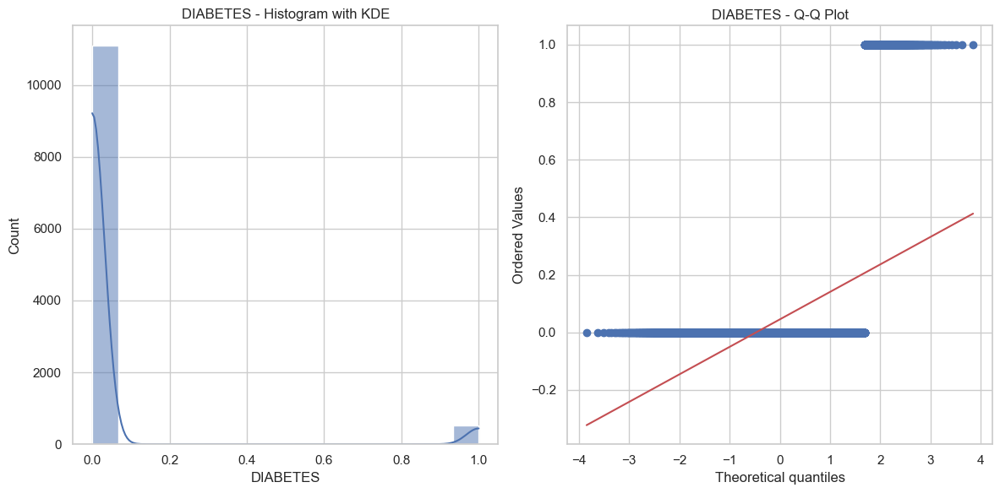


DIABETES is binary. Checking for Bernoulli distribution.
Proportion of 1's in DIABETES: 0.04543498838309956
Binomial test p-value: 1.0123849843538606
The binary data for DIABETES is likely following a Bernoulli distribution (fail to reject H0).


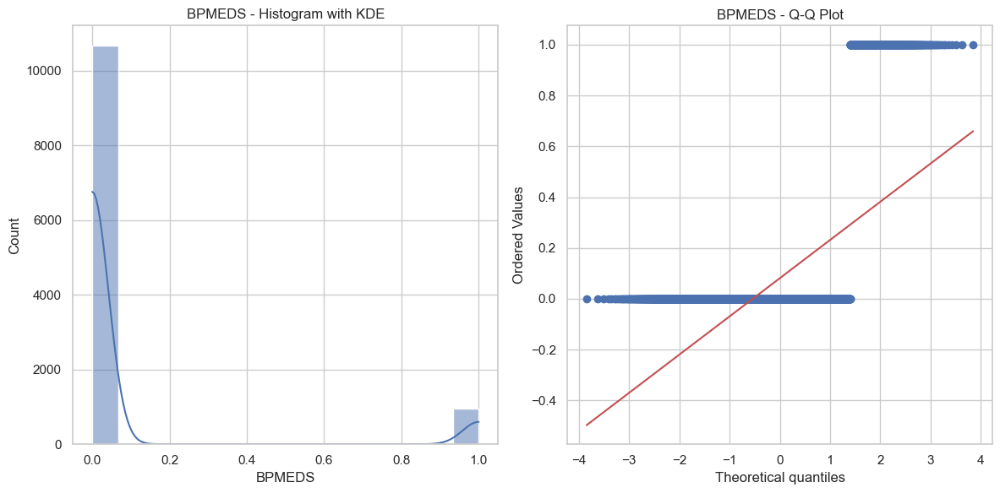


BPMEDS is binary. Checking for Bernoulli distribution.
Proportion of 1's in BPMEDS: 0.08114620084330092
Binomial test p-value: 1.0097683526128534
The binary data for BPMEDS is likely following a Bernoulli distribution (fail to reject H0).


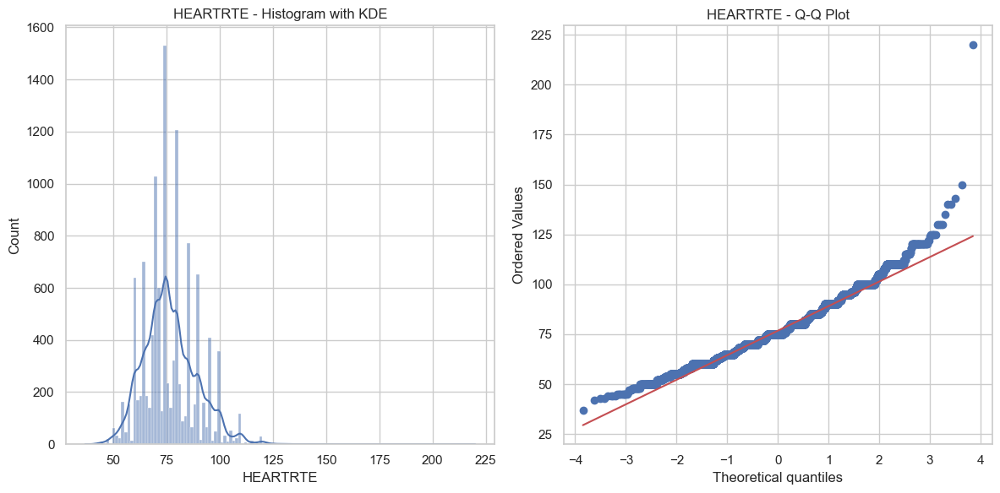


HEARTRTE is numeric. Checking for normality.
Shapiro-Wilk Test: p-value = 1.45194445787905e-41
The data for HEARTRTE is likely NOT normally distributed (reject H0).
D'Agostino and Pearson's Test: p-value = 2.214204721669439e-283
The data for HEARTRTE is likely NOT normally distributed (reject H0).
Anderson-Darling Test: AndersonResult(statistic=71.45268783992469, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=76.78151622063505, scale=12.463358584335802)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
The data for HEARTRTE is likely NOT normally distributed (reject H0) at significance level 15.0%.
The data for HEARTRTE is likely NOT normally distributed (reject H0) at significance level 10.0%.
The data for HEARTRTE is likely NOT normally distributed (reject H0) at significance level 5.0%.
The data for HEARTRTE is likely NOT normally distributed

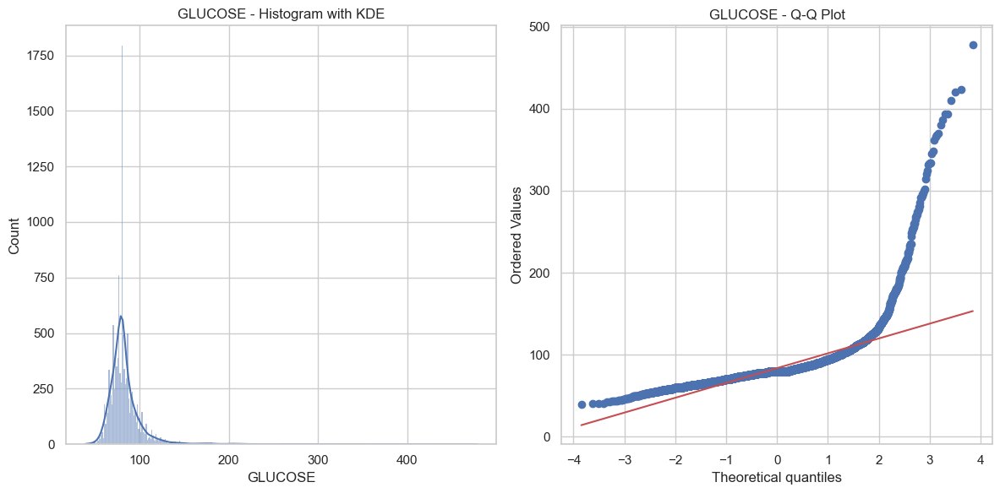


GLUCOSE is numeric. Checking for normality.
Shapiro-Wilk Test: p-value = 2.280876454989646e-96
The data for GLUCOSE is likely NOT normally distributed (reject H0).
D'Agostino and Pearson's Test: p-value = 0.0
The data for GLUCOSE is likely NOT normally distributed (reject H0).
Anderson-Darling Test: AndersonResult(statistic=905.4552782944484, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=83.61492126323036, scale=23.44002081824612)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
The data for GLUCOSE is likely NOT normally distributed (reject H0) at significance level 15.0%.
The data for GLUCOSE is likely NOT normally distributed (reject H0) at significance level 10.0%.
The data for GLUCOSE is likely NOT normally distributed (reject H0) at significance level 5.0%.
The data for GLUCOSE is likely NOT normally distributed (reject H0) at significan

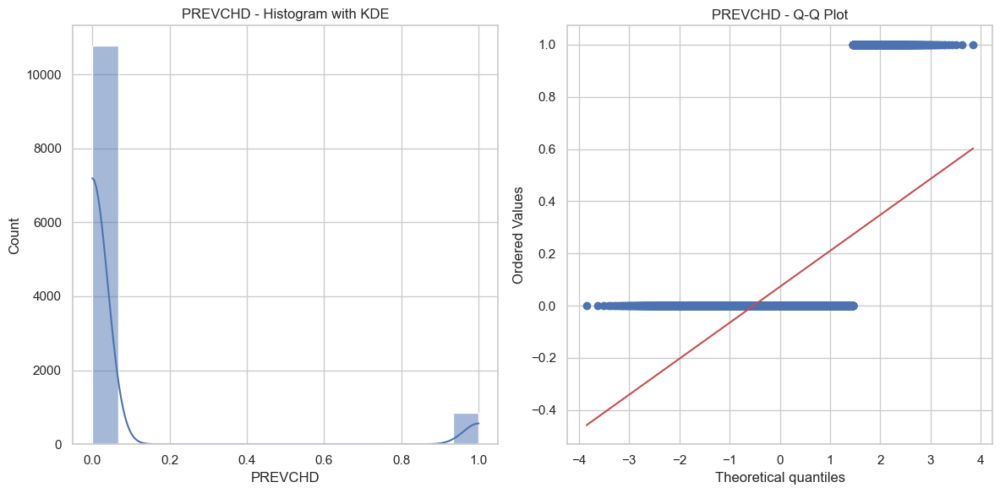


PREVCHD is binary. Checking for Bernoulli distribution.
Proportion of 1's in PREVCHD: 0.07236898717838396
Binomial test p-value: 1.0102111564833942
The binary data for PREVCHD is likely following a Bernoulli distribution (fail to reject H0).


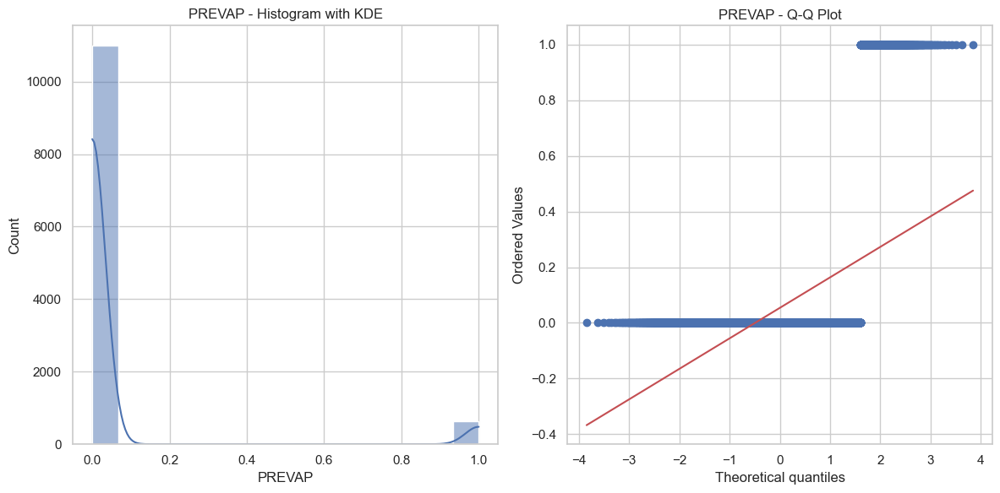


PREVAP is binary. Checking for Bernoulli distribution.
Proportion of 1's in PREVAP: 0.05395404870493073
Binomial test p-value: 1.0115093070822123
The binary data for PREVAP is likely following a Bernoulli distribution (fail to reject H0).


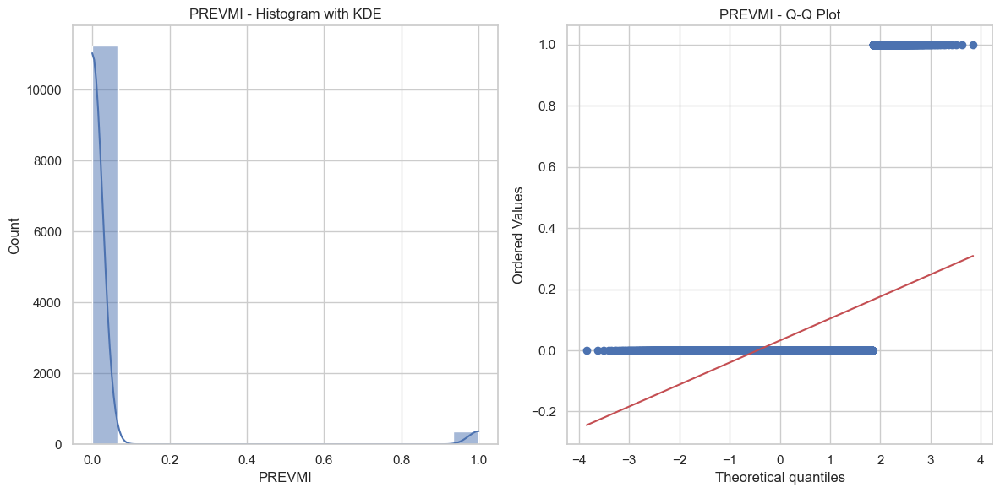


PREVMI is binary. Checking for Bernoulli distribution.
Proportion of 1's in PREVMI: 0.03209706565700026
Binomial test p-value: 1.014446755470066
The binary data for PREVMI is likely following a Bernoulli distribution (fail to reject H0).


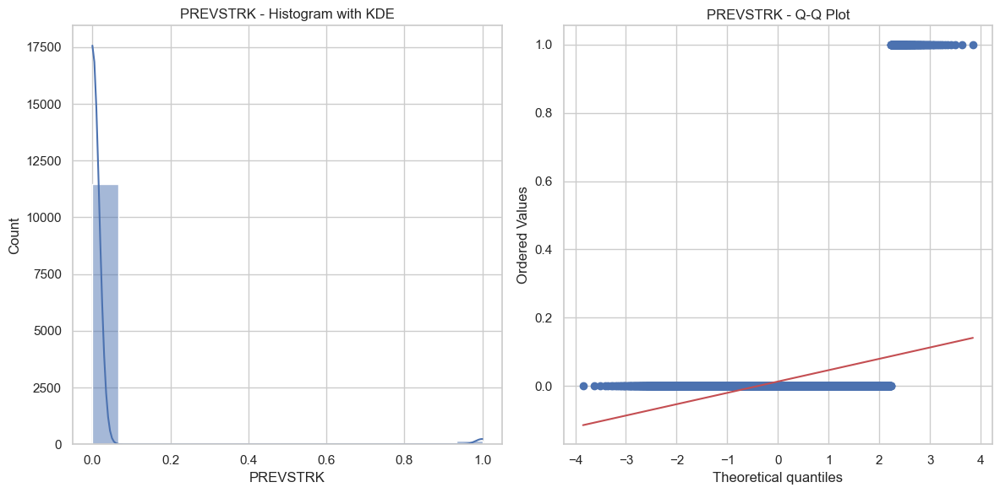


PREVSTRK is binary. Checking for Bernoulli distribution.
Proportion of 1's in PREVSTRK: 0.012907667154289648
Binomial test p-value: 1.0221398641809694
The binary data for PREVSTRK is likely following a Bernoulli distribution (fail to reject H0).


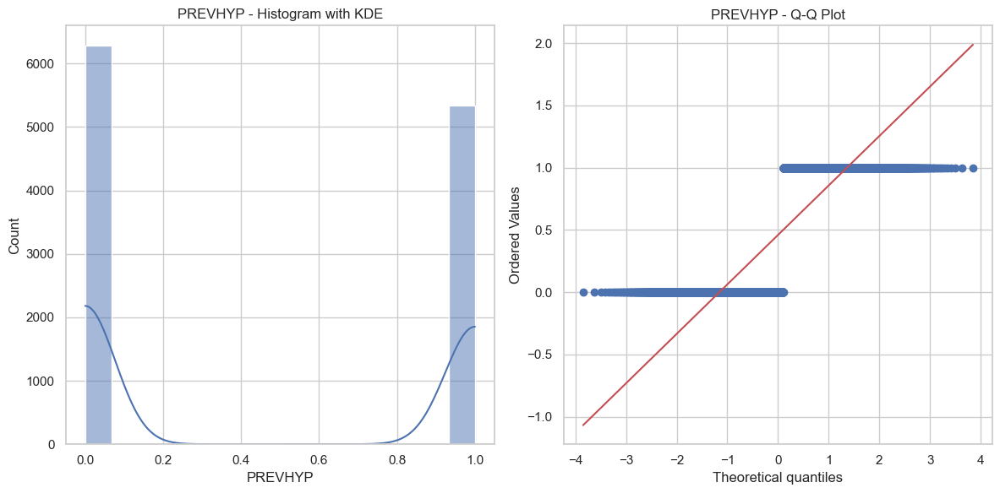


PREVHYP is binary. Checking for Bernoulli distribution.
Proportion of 1's in PREVHYP: 0.45942689957834953
Binomial test p-value: 1.00722495902185
The binary data for PREVHYP is likely following a Bernoulli distribution (fail to reject H0).


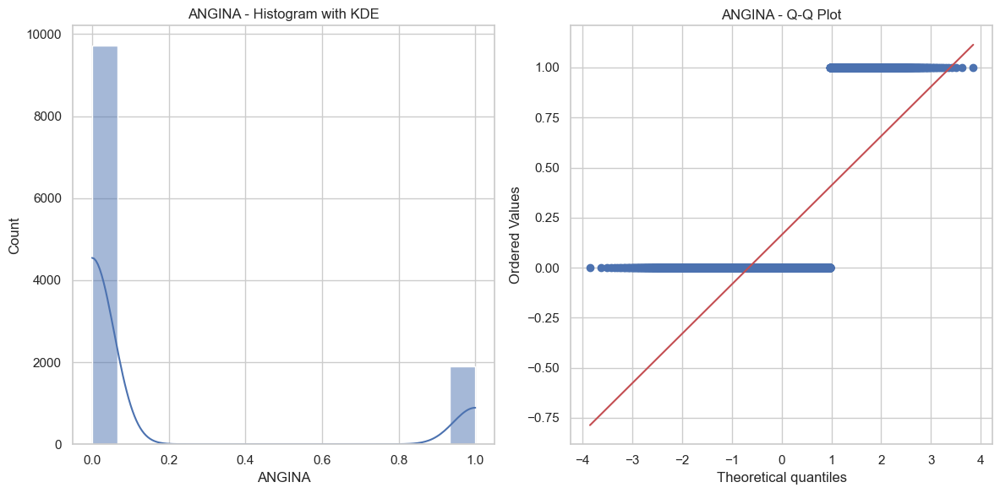


ANGINA is binary. Checking for Bernoulli distribution.
Proportion of 1's in ANGINA: 0.1635831684020308
Binomial test p-value: 1.0077608474745312
The binary data for ANGINA is likely following a Bernoulli distribution (fail to reject H0).


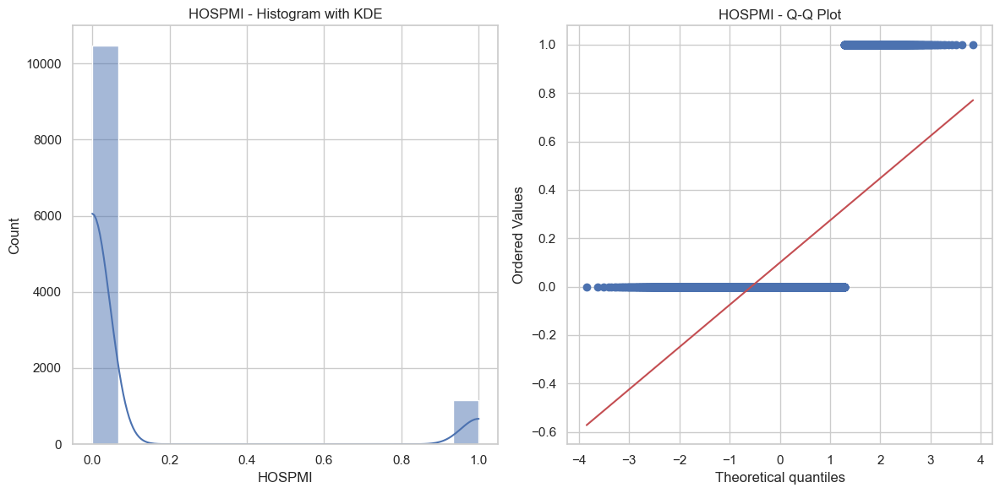


HOSPMI is binary. Checking for Bernoulli distribution.
Proportion of 1's in HOSPMI: 0.09921693485930642
Binomial test p-value: 1.0090713941596463
The binary data for HOSPMI is likely following a Bernoulli distribution (fail to reject H0).


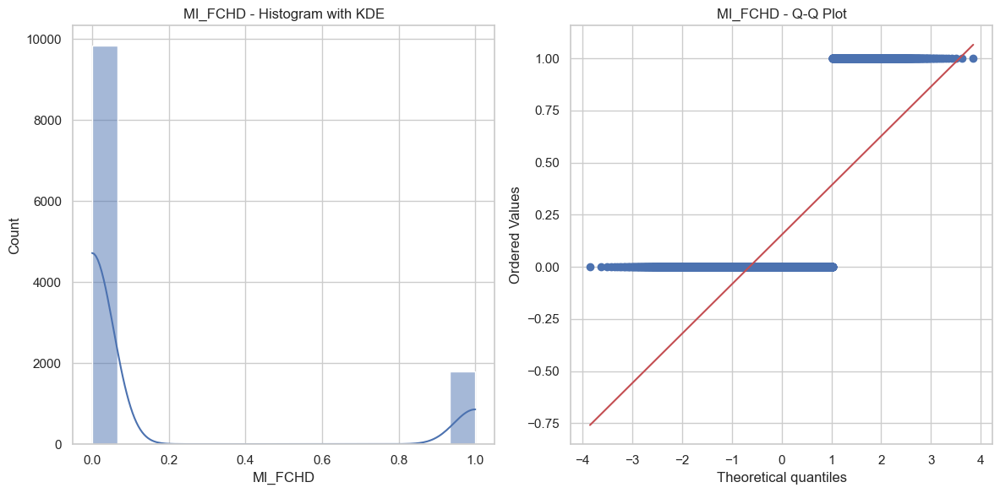


MI_FCHD is binary. Checking for Bernoulli distribution.
Proportion of 1's in MI_FCHD: 0.15368729025040875
Binomial test p-value: 1.0078921668070586
The binary data for MI_FCHD is likely following a Bernoulli distribution (fail to reject H0).


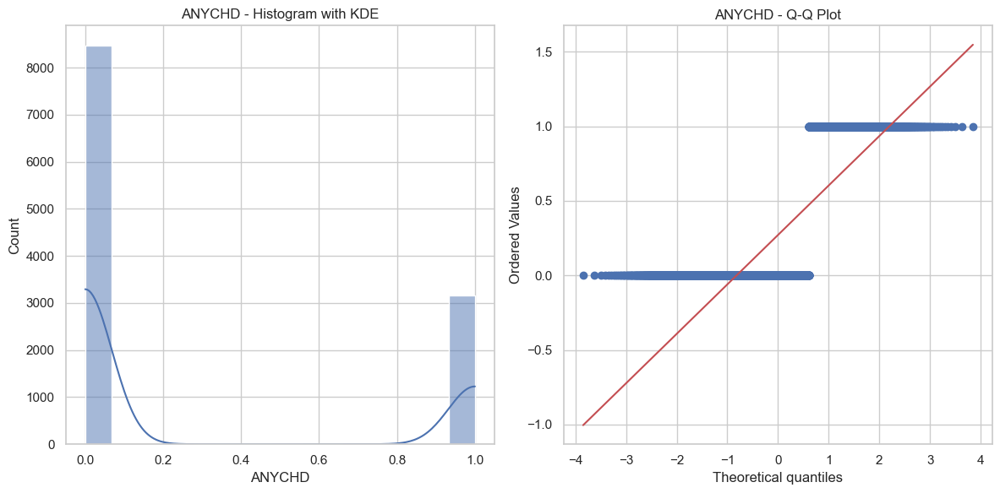


ANYCHD is binary. Checking for Bernoulli distribution.
Proportion of 1's in ANYCHD: 0.27149126581189226
Binomial test p-value: 1.0070535723727319
The binary data for ANYCHD is likely following a Bernoulli distribution (fail to reject H0).


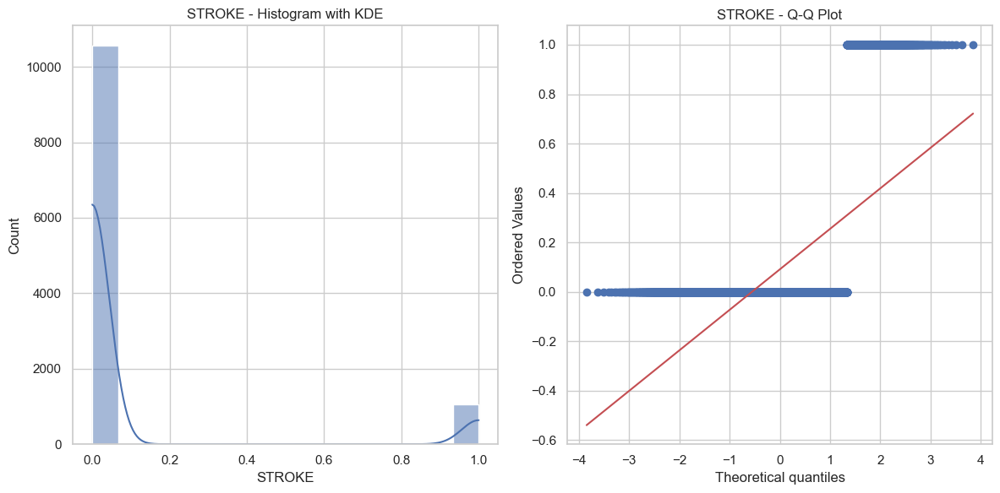


STROKE is binary. Checking for Bernoulli distribution.
Proportion of 1's in STROKE: 0.09104207899492299
Binomial test p-value: 1.009357124319983
The binary data for STROKE is likely following a Bernoulli distribution (fail to reject H0).


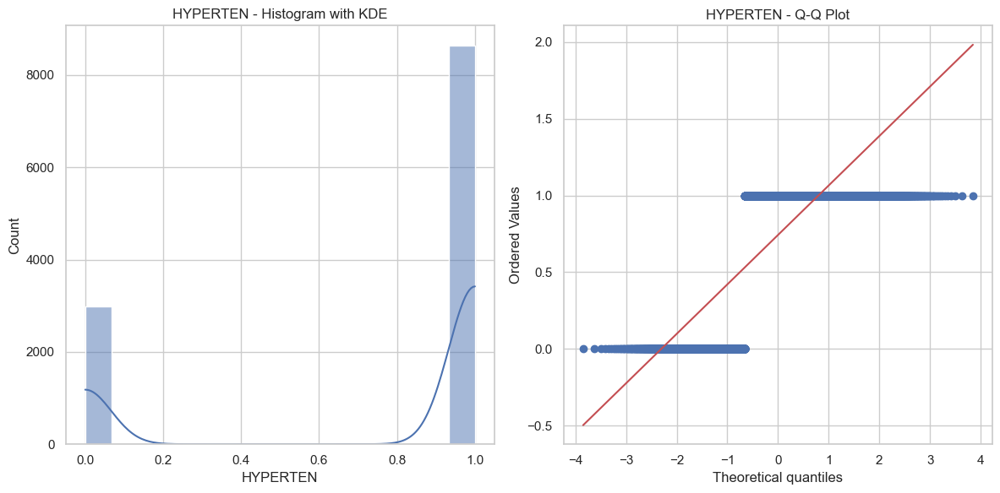


HYPERTEN is binary. Checking for Bernoulli distribution.
Proportion of 1's in HYPERTEN: 0.743223474743998
Binomial test p-value: 1.007097606597734
The binary data for HYPERTEN is likely following a Bernoulli distribution (fail to reject H0).


In [541]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro, normaltest, anderson, binom
from scipy import stats

# Step 1: Load the CSV file into a pandas DataFrame
data = X  # Replace with your dataset variable

# Step 2: Function to check normality and Bernoulli distribution
def check_distribution(column_name, column_data):
    # Step 3: Visualize the distribution using a histogram and Q-Q plot
    plt.figure(figsize=(12, 6))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(column_data, kde=True)
    plt.title(f'{column_name} - Histogram with KDE')

    # Q-Q plot
    plt.subplot(1, 2, 2)
    stats.probplot(column_data, dist="norm", plot=plt)
    plt.title(f'{column_name} - Q-Q Plot')

    plt.tight_layout()
    plt.show()

    # Step 4: Perform statistical tests for normality or Bernoulli distribution

    # For Binary Data (Bernoulli Distribution)
    if column_data.nunique() == 2:
        print(f"\n{column_name} is binary. Checking for Bernoulli distribution.")

        # Check for Bernoulli distribution using mean (probability of 1) and binomial test
        p = column_data.mean()  # Proportion of 1's
        print(f"Proportion of 1's in {column_name}: {p}")

        # Number of successes (1's) and total number of trials (samples)
        successes = column_data.sum()  # Sum gives the count of 1's
        trials = len(column_data)

        # Binomial test using scipy.stats.binom.cdf
        # The null hypothesis: the probability of success is equal to p
        binomial_p = 2 * min(
            binom.cdf(successes, trials, p),  # Left tail
            1 - binom.cdf(successes - 1, trials, p)  # Right tail
        )

        print(f"Binomial test p-value: {binomial_p}")

        if binomial_p > 0.05:
            print(f"The binary data for {column_name} is likely following a Bernoulli distribution (fail to reject H0).")
        else:
            print(f"The binary data for {column_name} is likely NOT following a Bernoulli distribution (reject H0).")

    # For Numeric Data (Normal Distribution)
    elif np.issubdtype(column_data.dtype, np.number):  # Numeric data
        print(f"\n{column_name} is numeric. Checking for normality.")

        # 4.1 Shapiro-Wilk test (good for small to medium sample sizes)
        shapiro_stat, shapiro_p = shapiro(column_data.dropna())  # dropna() to ignore missing values
        print(f"Shapiro-Wilk Test: p-value = {shapiro_p}")
        if shapiro_p > 0.05:
            print(f"The data for {column_name} is likely normally distributed (fail to reject H0).")
        else:
            print(f"The data for {column_name} is likely NOT normally distributed (reject H0).")

        # 4.2 D'Agostino and Pearson's Test (good for larger sample sizes)
        dagostino_stat, dagostino_p = normaltest(column_data.dropna())
        print(f"D'Agostino and Pearson's Test: p-value = {dagostino_p}")
        if dagostino_p > 0.05:
            print(f"The data for {column_name} is likely normally distributed (fail to reject H0).")
        else:
            print(f"The data for {column_name} is likely NOT normally distributed (reject H0).")

        # 4.3 Anderson-Darling test (provides more detailed output)
        anderson_result = anderson(column_data.dropna())
        print(f"Anderson-Darling Test: {anderson_result}")
        # Interpreting the result:
        for i in range(len(anderson_result.critical_values)):
            if anderson_result.statistic > anderson_result.critical_values[i]:
                print(f"The data for {column_name} is likely NOT normally distributed (reject H0) at significance level {anderson_result.significance_level[i]}%.")
            else:
                print(f"The data for {column_name} is likely normally distributed (fail to reject H0) at significance level {anderson_result.significance_level[i]}%.")

    else:
        print(f"{column_name} is neither binary nor numeric. Skipping.")

# Step 3: Loop through columns and check their distribution
for column_name in data.columns:
    column_data = data[column_name]

    # Check if the column is binary or numeric
    if column_data.nunique() == 2:  # Binary data
        check_distribution(column_name, column_data)
    elif np.issubdtype(column_data.dtype, np.number):  # Numeric data
        check_distribution(column_name, column_data)
    else:
        print(f"{column_name} is neither binary nor numeric. Skipping.")


# The Synthetic Minority Oversampling(SMOTE)

In [542]:
#load the SMOTE module
from imblearn.over_sampling import SMOTE
#create test and train and SMOTE the x matrices
os = SMOTE(random_state=0)
X_os,y_os=os.fit_resample(x_filtered,y_filtered)

In [543]:
X_os.shape,y_os.shape

((16958, 23), (16958,))

In [544]:
y_os.value_counts(normalize = True)

CVD
1   0.5
0   0.5
Name: proportion, dtype: float64

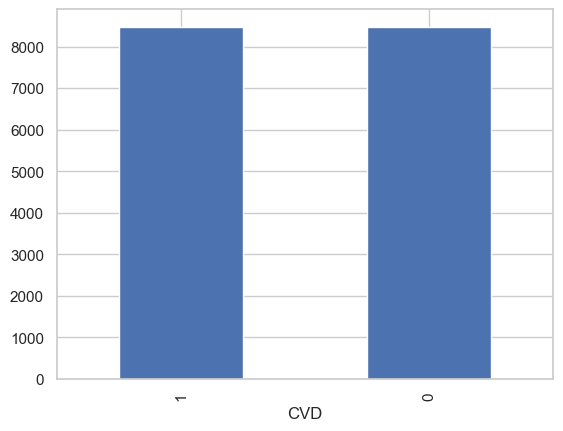

In [545]:
y_os.value_counts().plot(kind = 'bar')
plt.show()

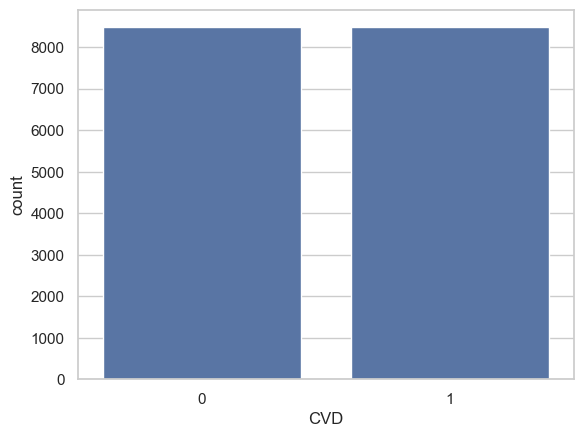

In [546]:
sns.countplot(x=y_os)
plt.show()

In [547]:
df_os = pd.DataFrame(X_os)
df_os['CVD']=y_os

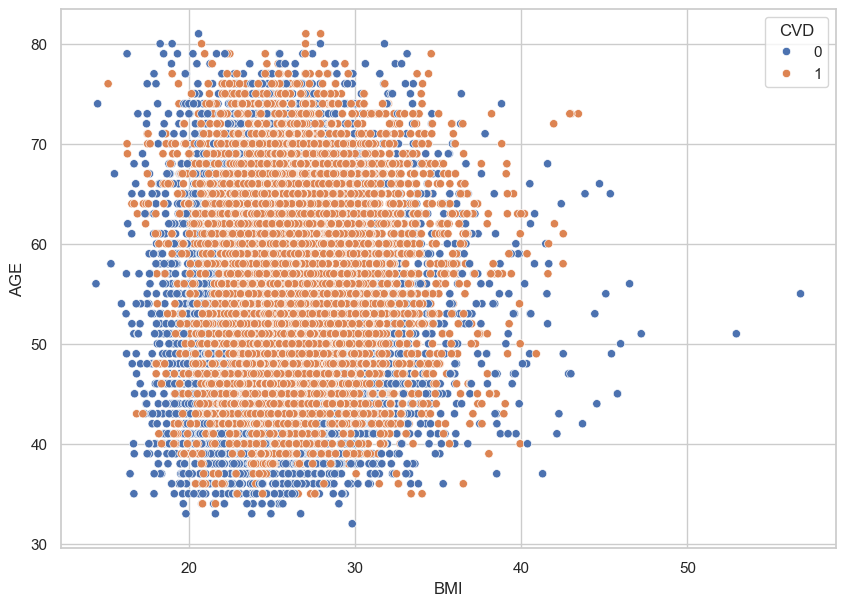

In [548]:
plt.figure(figsize=(10,7))
sns.scatterplot(data = df_os,x='BMI',y='AGE',hue = 'CVD')
plt.show()

# train test split

In [549]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(X_os,y_os, test_size = .3, random_state=42)


In [550]:
print(X_train.nunique()) #to see all the colunm unique value count

SEX            2
TOTCHOL     4567
AGE           50
SYSBP       4635
DIABP       4436
CURSMOKE       2
CIGPDAY     1768
BMI         6159
DIABETES       2
BPMEDS       723
HEARTRTE    4097
GLUCOSE     4351
PREVCHD        2
PREVAP         2
PREVMI         2
PREVSTRK       2
PREVHYP        2
ANGINA         2
HOSPMI         2
MI_FCHD        2
ANYCHD         2
STROKE         2
HYPERTEN       2
dtype: int64


# Feature Scaling

In [379]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# ML MODELS BY ALL FEATURES

Confusion Matrix:
[[2266  308]
 [ 261 2253]]
Accuracy: 0.8882
Log Loss: 4.0308
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.88      0.89      2574
           1       0.88      0.90      0.89      2514

    accuracy                           0.89      5088
   macro avg       0.89      0.89      0.89      5088
weighted avg       0.89      0.89      0.89      5088

Precision-Recall AUC: 0.9136
ROC AUC: 0.8883


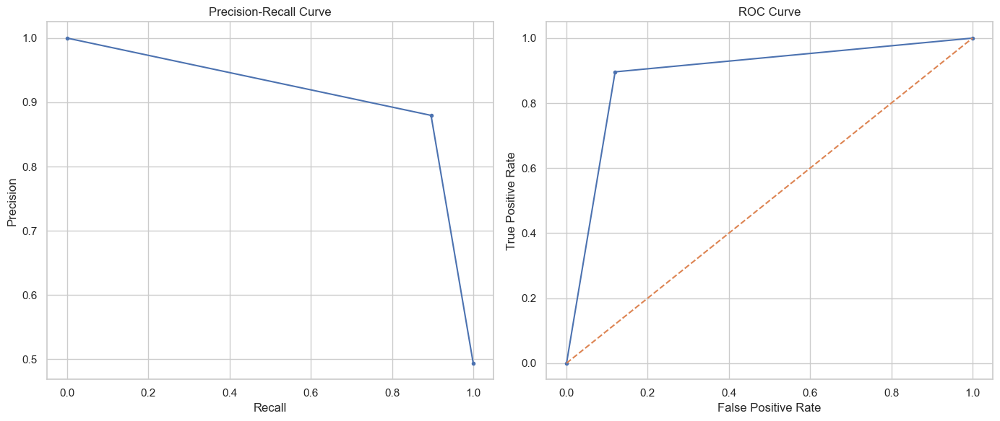

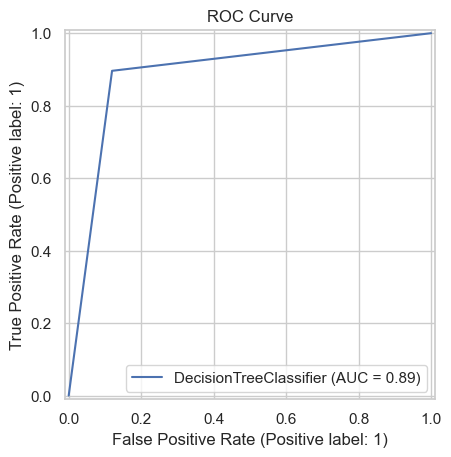

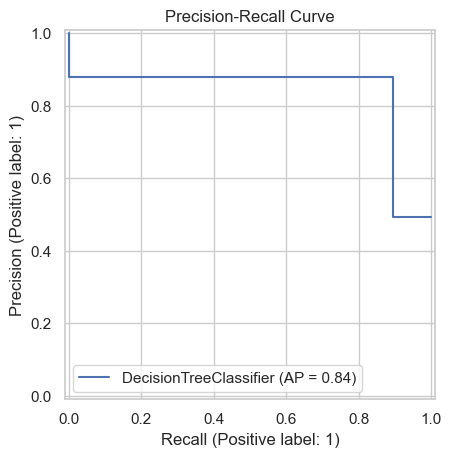

In [380]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import (confusion_matrix, accuracy_score,
                             log_loss, precision_recall_curve,
                             roc_curve, auc, classification_report,
                             RocCurveDisplay, PrecisionRecallDisplay)

# Training Decision Tree Classifier with entropy
DC = DecisionTreeClassifier(criterion='entropy', random_state=0)
DC.fit(X_train, y_train)

# Predict on test data
y_pred = DC.predict(X_test)

# Get prediction probabilities for log loss and curves
y_prob = DC.predict_proba(X_test)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Log Loss
logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob[:, 1])
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
roc_auc = auc(fpr, tpr)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot Precision-Recall Curve
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

# Plot ROC Curve
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, marker='.')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

plt.tight_layout()
plt.show()

# Display ROC and Precision-Recall curves using built-in functions
RocCurveDisplay.from_estimator(DC, X_test, y_test)
plt.title('ROC Curve')
plt.show()

PrecisionRecallDisplay.from_estimator(DC, X_test, y_test)
plt.title('Precision-Recall Curve')
plt.show()


Decision Tree using GINI:
Accuracy: 0.8813
Log Loss: 4.2788
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      2574
           1       0.87      0.89      0.88      2514

    accuracy                           0.88      5088
   macro avg       0.88      0.88      0.88      5088
weighted avg       0.88      0.88      0.88      5088

Precision-Recall AUC: 0.9078
ROC AUC: 0.8814


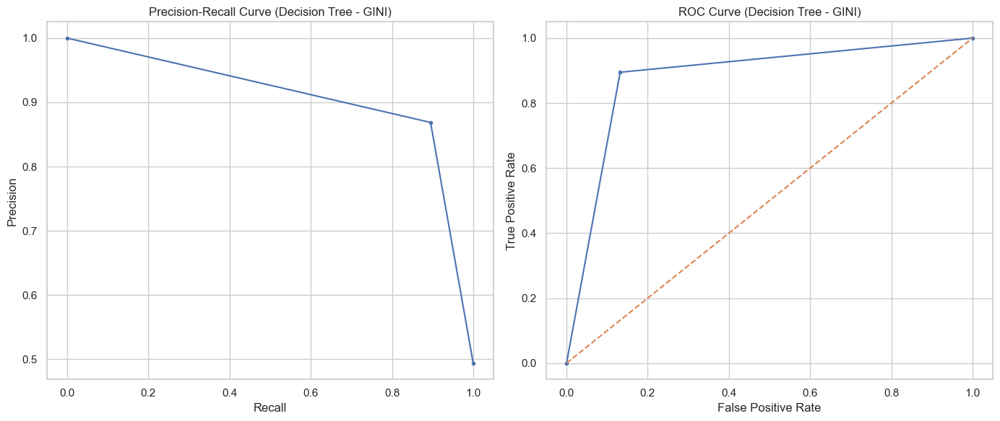

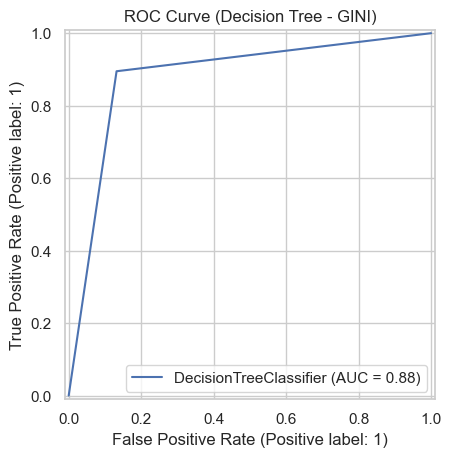

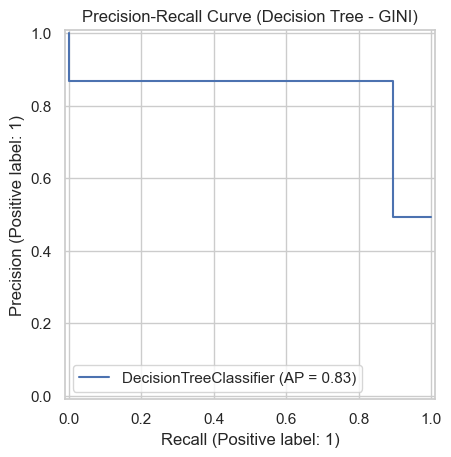

In [381]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score, log_loss, precision_recall_curve, roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay, PrecisionRecallDisplay

# Train the model
DC2 = DecisionTreeClassifier(criterion='gini', random_state=0)
DC2.fit(X_train, y_train)

# Predict on test set
y_pred_dt_gini = DC2.predict(X_test)
y_prob_dt_gini = DC2.predict_proba(X_test)

# Evaluate the model
print("Decision Tree using GINI:")
accuracy_dt_gini = accuracy_score(y_test, y_pred_dt_gini)
print(f"Accuracy: {accuracy_dt_gini:.4f}")

# Calculate Log Loss
logloss_dt_gini = log_loss(y_test, y_prob_dt_gini)
print(f"Log Loss: {logloss_dt_gini:.4f}")

print("Classification Report:")
print(classification_report(y_test, y_pred_dt_gini))

# Precision-Recall Curve
precision_dt_gini, recall_dt_gini, _ = precision_recall_curve(y_test, y_prob_dt_gini[:, 1])
pr_auc_dt_gini = auc(recall_dt_gini, precision_dt_gini)
print(f"Precision-Recall AUC: {pr_auc_dt_gini:.4f}")

# ROC Curve
fpr_dt_gini, tpr_dt_gini, _ = roc_curve(y_test, y_prob_dt_gini[:, 1])
roc_auc_dt_gini = auc(fpr_dt_gini, tpr_dt_gini)
print(f"ROC AUC: {roc_auc_dt_gini:.4f}")

# Plot Precision-Recall Curve
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(recall_dt_gini, precision_dt_gini, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (Decision Tree - GINI)')

# Plot ROC Curve
plt.subplot(1, 2, 2)
plt.plot(fpr_dt_gini, tpr_dt_gini, marker='.')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Decision Tree - GINI)')

plt.tight_layout()
plt.show()

# Display ROC and Precision-Recall curves using built-in functions
RocCurveDisplay.from_estimator(DC2, X_test, y_test)
plt.title('ROC Curve (Decision Tree - GINI)')
plt.show()

PrecisionRecallDisplay.from_estimator(DC2, X_test, y_test)
plt.title('Precision-Recall Curve (Decision Tree - GINI)')
plt.show()


Confusion Matrix:
[[2558   16]
 [1224 1290]]
Accuracy: 0.7563
Log Loss: 7.7862
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.99      0.80      2574
           1       0.99      0.51      0.68      2514

    accuracy                           0.76      5088
   macro avg       0.83      0.75      0.74      5088
weighted avg       0.83      0.76      0.74      5088

Precision-Recall AUC: 0.9180
ROC AUC: 0.9058


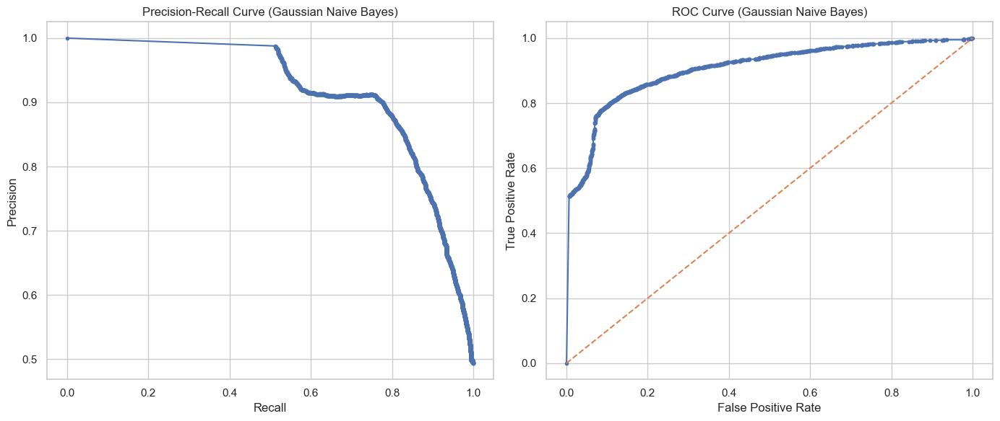

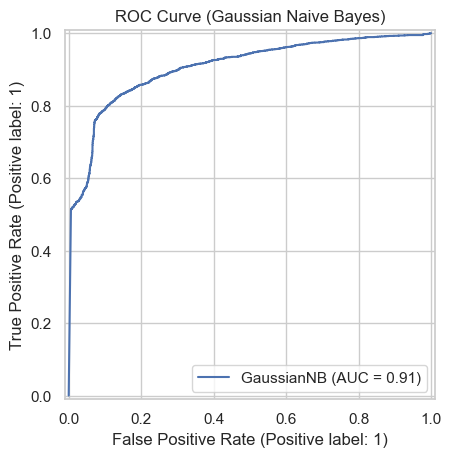

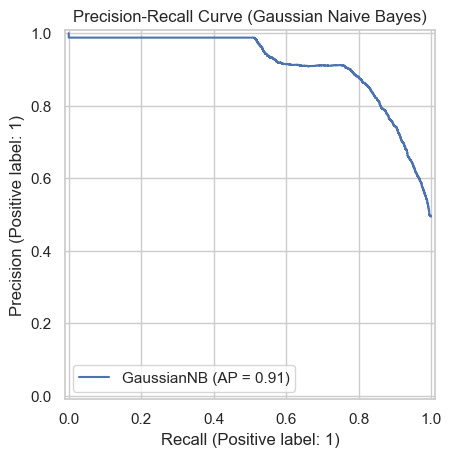

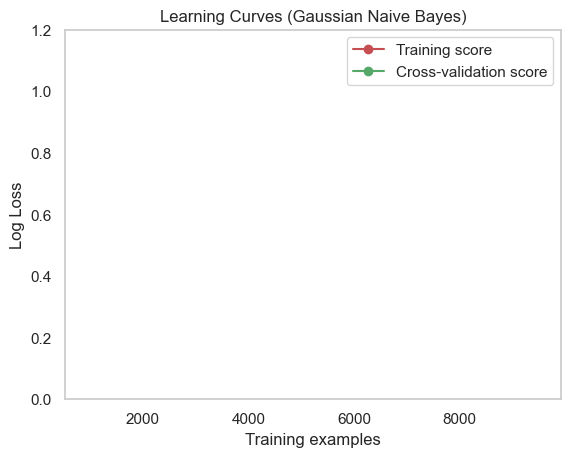

In [382]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (confusion_matrix, accuracy_score, log_loss,
                             classification_report, precision_recall_curve,
                             roc_curve, auc)
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

# Function to compute log loss for different sizes of training data
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Log Loss")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='neg_log_loss')
    train_scores_mean = -np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Train the model
GB = GaussianNB()
GB.fit(X_train, y_train)

# Predict on test set
y_pred = GB.predict(X_test)
y_prob = GB.predict_proba(X_test)

# Evaluate the model
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob[:, 1])
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
roc_auc = auc(fpr, tpr)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot Precision-Recall Curve and ROC Curve
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (Gaussian Naive Bayes)')

plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, marker='.')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Gaussian Naive Bayes)')

plt.tight_layout()
plt.show()

# Display ROC Curve using built-in function
RocCurveDisplay.from_estimator(GB, X_test, y_test)
plt.title('ROC Curve (Gaussian Naive Bayes)')
plt.show()

# Display Precision-Recall Curve using built-in function
PrecisionRecallDisplay.from_estimator(GB, X_test, y_test)
plt.title('Precision-Recall Curve (Gaussian Naive Bayes)')
plt.show()

# Plot learning curve
title = "Learning Curves (Gaussian Naive Bayes)"
plot_learning_curve(GB, title, X_train, y_train, ylim=(0, 1.2), cv=5, n_jobs=-1)

plt.show()


Confusion Matrix:
[[2466  108]
 [ 487 2027]]
Accuracy: 0.8831
Log Loss: 0.2883
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      2574
           1       0.95      0.81      0.87      2514

    accuracy                           0.88      5088
   macro avg       0.89      0.88      0.88      5088
weighted avg       0.89      0.88      0.88      5088

Precision-Recall AUC: 0.9577
ROC AUC: 0.9484


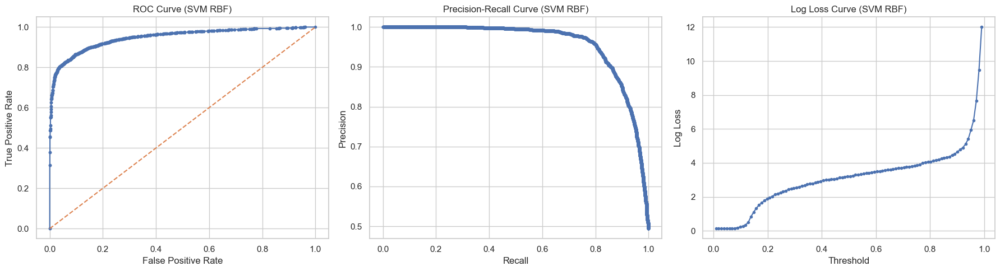

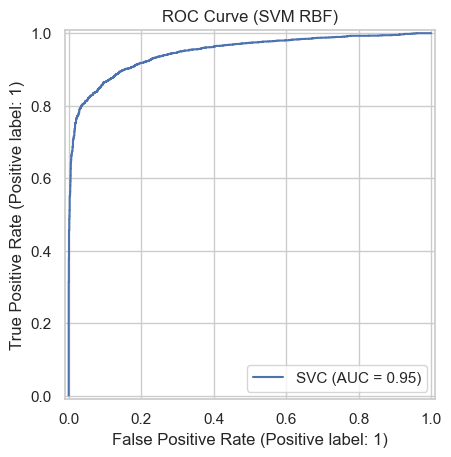

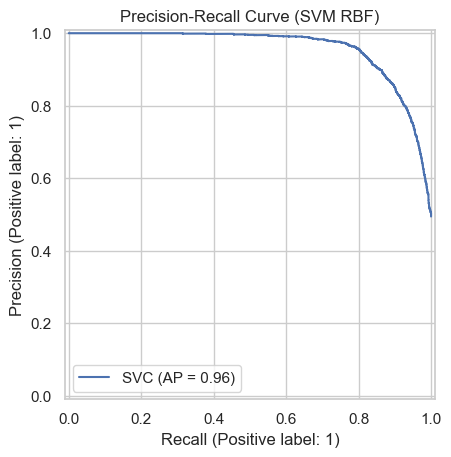

In [383]:
from sklearn.svm import SVC
from sklearn.metrics import (confusion_matrix, accuracy_score, log_loss,
                             classification_report, precision_recall_curve,
                             roc_curve, auc, RocCurveDisplay, PrecisionRecallDisplay)
import matplotlib.pyplot as plt
import numpy as np

# Train the SVM model with RBF kernel
SVC2 = SVC(kernel='rbf', random_state=0, probability=True)
SVC2.fit(X_train, y_train)

# Predict on test set
y_pred = SVC2.predict(X_test)
y_prob = SVC2.predict_proba(X_test)

# Confusion Matrix
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Log Loss
logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

# Classification Report
print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob[:, 1])
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
roc_auc = auc(fpr, tpr)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC Curve
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(fpr, tpr, marker='.')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (SVM RBF)')

# Plot Precision-Recall Curve
plt.subplot(1, 3, 2)
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (SVM RBF)')

# Log Loss Curve
thresholds = np.linspace(0.01, 0.99, 100)
log_losses = [log_loss(y_test, np.column_stack((1-y_prob[:, 1], y_prob[:, 1] > thresh))) for thresh in thresholds]

plt.subplot(1, 3, 3)
plt.plot(thresholds, log_losses, marker='.')
plt.xlabel('Threshold')
plt.ylabel('Log Loss')
plt.title('Log Loss Curve (SVM RBF)')

plt.tight_layout()
plt.show()

# Display ROC Curve using built-in function
RocCurveDisplay.from_estimator(SVC2, X_test, y_test)
plt.title('ROC Curve (SVM RBF)')
plt.show()

# Display Precision-Recall Curve using built-in function
PrecisionRecallDisplay.from_estimator(SVC2, X_test, y_test)
plt.title('Precision-Recall Curve (SVM RBF)')
plt.show()


Confusion Matrix:
[[2388  186]
 [ 597 1917]]
Accuracy: 0.8461
Log Loss: 0.4068
Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.93      0.86      2574
           1       0.91      0.76      0.83      2514

    accuracy                           0.85      5088
   macro avg       0.86      0.85      0.84      5088
weighted avg       0.86      0.85      0.84      5088

Precision-Recall AUC: 0.9445


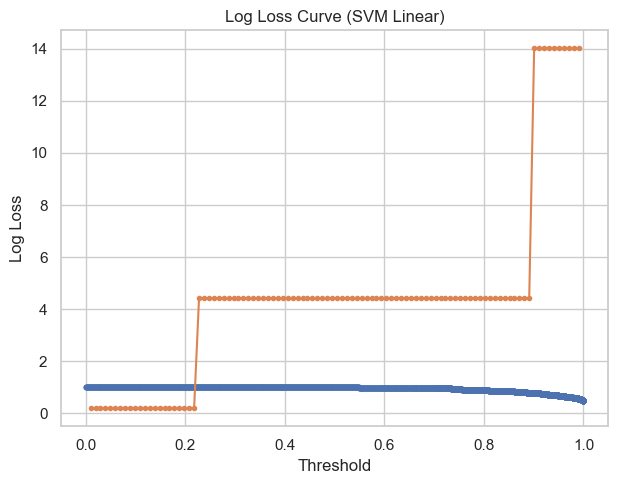

<Figure size 640x480 with 0 Axes>

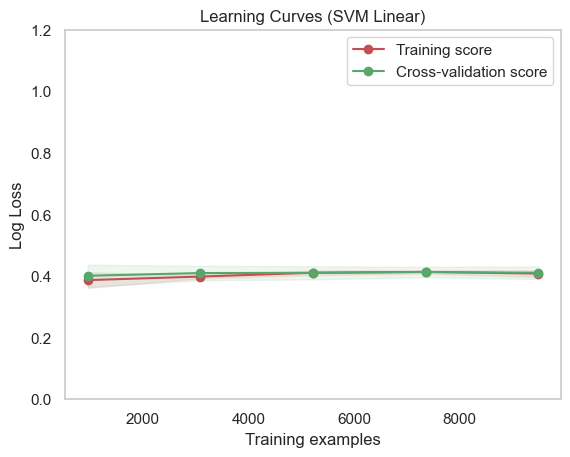

In [384]:
from sklearn.svm import SVC
from sklearn.metrics import (confusion_matrix, accuracy_score, log_loss,
                             classification_report, precision_recall_curve,
                             auc)
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

# Function to compute log loss for different thresholds
def plot_log_loss_curve(estimator, X, y, thresholds, X_test, y_test):
    log_losses = []
    for thresh in thresholds:
        y_prob = estimator.predict_proba(X_test)
        log_losses.append(log_loss(y_test, np.column_stack((1-y_prob[:, 1], y_prob[:, 1] > thresh))))

    plt.plot(thresholds, log_losses, marker='.')
    plt.xlabel('Threshold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss Curve (SVM Linear)')
    plt.tight_layout()
    plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Log Loss")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='neg_log_loss')
    train_scores_mean = -np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = -np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Train the SVM model with Linear kernel
SVC1 = SVC(kernel='linear', random_state=0, probability=True)
SVC1.fit(X_train, y_train)

# Predict on test set
y_pred = SVC1.predict(X_test)
y_prob = SVC1.predict_proba(X_test)

# Evaluate the model
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob[:, 1])
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")

# Plot Precision-Recall Curve and Log Loss Curve
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(recall, precision, marker='.')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (SVM Linear)')

thresholds = np.linspace(0.01, 0.99, 100)
plot_log_loss_curve(SVC1, X_train, y_train, thresholds, X_test, y_test)

plt.tight_layout()
plt.show()

# Plot learning curve
title = "Learning Curves (SVM Linear)"
plot_learning_curve(SVC1, title, X_train, y_train, ylim=(0, 1.2), cv=5, n_jobs=-1)

plt.show()


Confusion Matrix:
[[2236  338]
 [ 279 2235]]
Accuracy: 0.8787
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      2574
           1       0.87      0.89      0.88      2514

    accuracy                           0.88      5088
   macro avg       0.88      0.88      0.88      5088
weighted avg       0.88      0.88      0.88      5088

Log Loss: 0.7964
Precision-Recall AUC: 0.9062


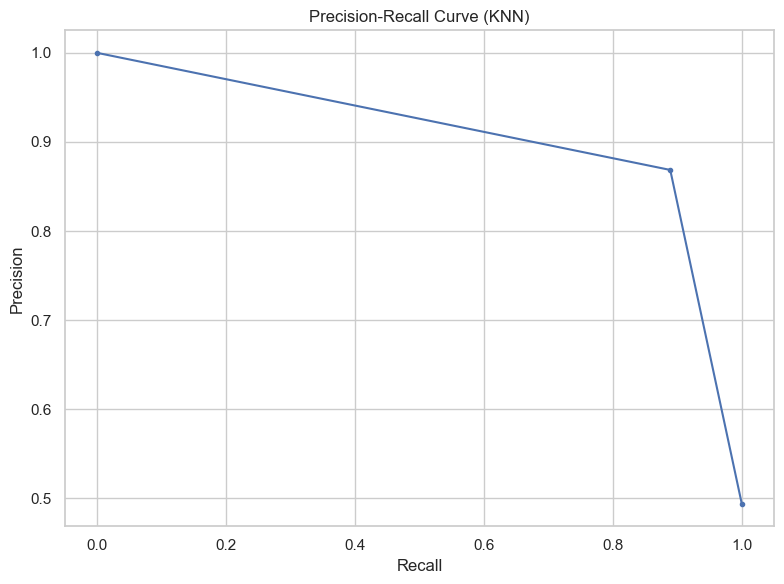

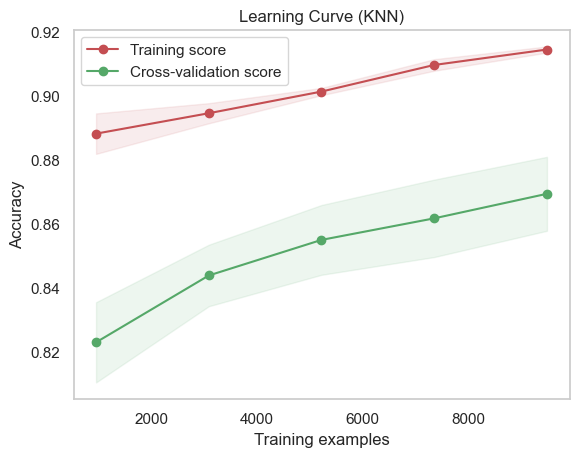

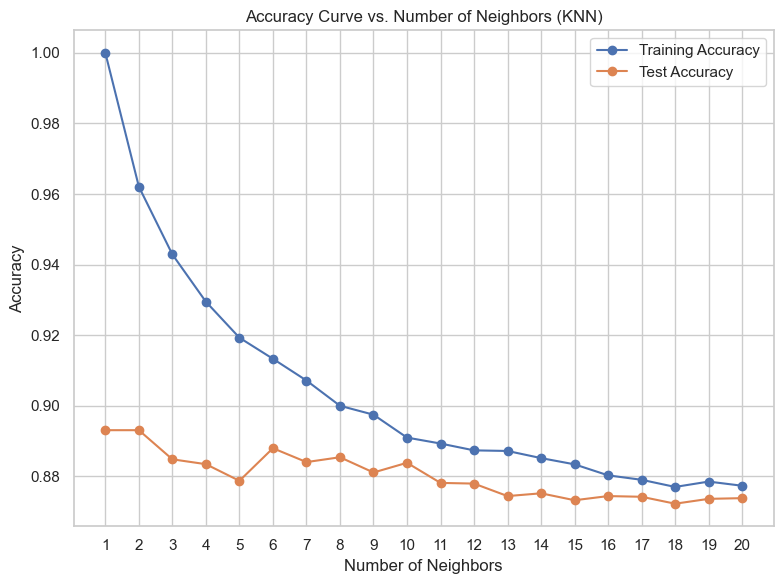

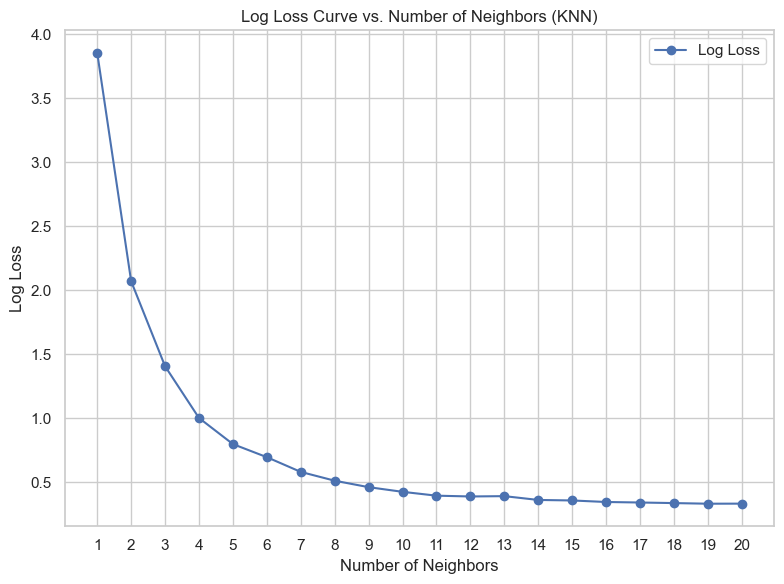

In [385]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_recall_curve, auc, log_loss
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

# Function to plot precision-recall curve
def plot_precision_recall_curve(precision, recall):
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve (KNN)')
    plt.tight_layout()
    plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Function to plot accuracy curve vs. number of neighbors
def plot_accuracy_curve(X_train, y_train, X_test, y_test, max_neighbors=20):
    neighbors = range(1, max_neighbors + 1)
    train_accuracy = []
    test_accuracy = []
    log_losses = []

    for n in neighbors:
        KNN = KNeighborsClassifier(n_neighbors=n, metric='minkowski', p=2)
        KNN.fit(X_train, y_train)
        train_accuracy.append(KNN.score(X_train, y_train))
        test_accuracy.append(KNN.score(X_test, y_test))

        y_pred_prob = KNN.predict_proba(X_test)
        log_losses.append(log_loss(y_test, y_pred_prob))

    plt.figure(figsize=(8, 6))
    plt.plot(neighbors, train_accuracy, marker='o', label='Training Accuracy')
    plt.plot(neighbors, test_accuracy, marker='o', label='Test Accuracy')
    plt.xlabel('Number of Neighbors')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Curve vs. Number of Neighbors (KNN)')
    plt.xticks(neighbors)
    plt.legend()
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 6))
    plt.plot(neighbors, log_losses, marker='o', color='b', label='Log Loss')
    plt.xlabel('Number of Neighbors')
    plt.ylabel('Log Loss')
    plt.title('Log Loss Curve vs. Number of Neighbors (KNN)')
    plt.xticks(neighbors)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Train the KNN model
KNN = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2)
KNN.fit(X_train, y_train)

# Predict on test set
y_pred = KNN.predict(X_test)

# Predict probabilities on test set
y_pred_prob = KNN.predict_proba(X_test)

# Evaluate the model
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

logloss = log_loss(y_test, y_pred_prob)
print(f"Log Loss: {logloss:.4f}")

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_pred)
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")
plot_precision_recall_curve(precision, recall)

# Learning Curve
title = "Learning Curve (KNN)"
plot_learning_curve(KNN, title, X_train, y_train, cv=5, n_jobs=-1)

# Accuracy Curve vs. Number of Neighbors and Log Loss
plot_accuracy_curve(X_train, y_train, X_test, y_test, max_neighbors=20)


Confusion Matrix:
[[2403  171]
 [ 520 1994]]
Accuracy: 0.8642
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.93      0.87      2574
           1       0.92      0.79      0.85      2514

    accuracy                           0.86      5088
   macro avg       0.87      0.86      0.86      5088
weighted avg       0.87      0.86      0.86      5088

Precision-Recall AUC: 0.9476


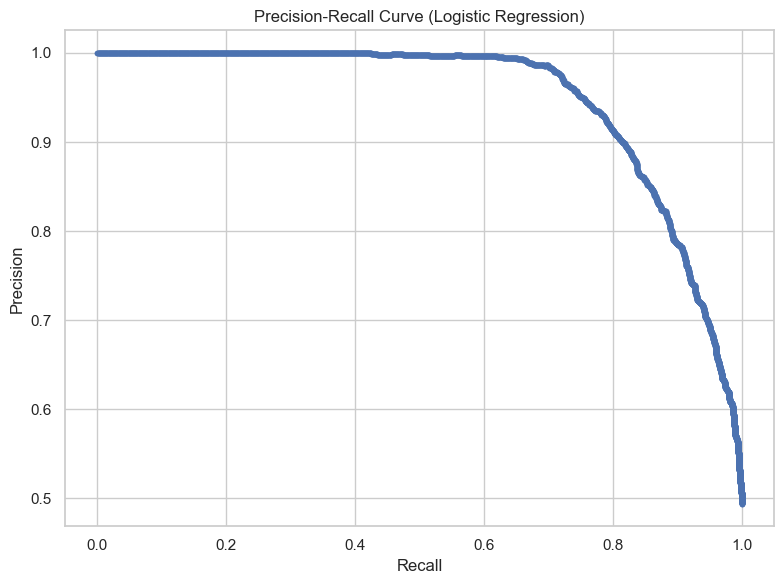

ROC AUC: 0.9355


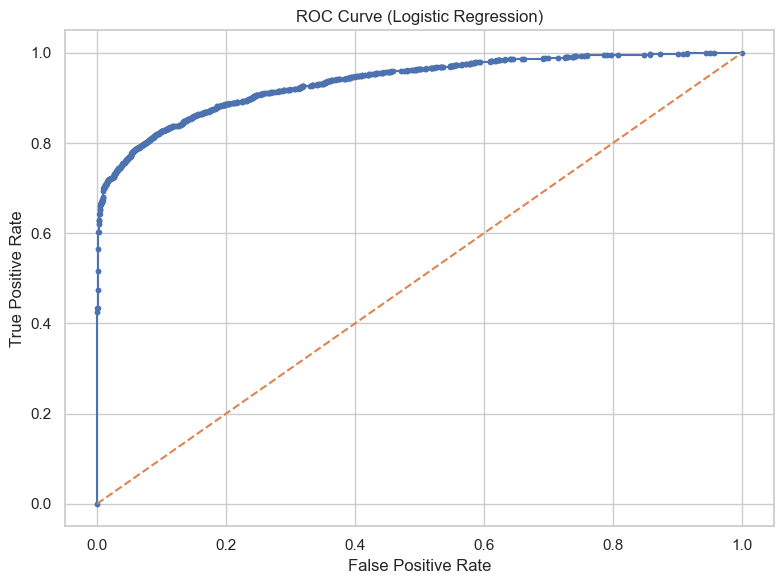

Log Loss: 0.3039


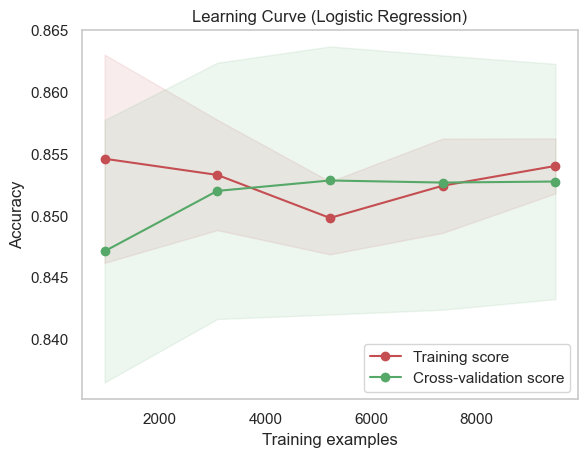

In [386]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_recall_curve, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

# Function to plot precision-recall curve
def plot_precision_recall_curve(precision, recall):
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve (Logistic Regression)')
    plt.tight_layout()
    plt.show()

# Function to plot ROC curve
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (Logistic Regression)')
    plt.tight_layout()
    plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Train the Logistic Regression model
LR = LogisticRegression(random_state=0)
LR.fit(X_train, y_train)

# Predict on test set
y_pred = LR.predict(X_test)
y_prob = LR.predict_proba(X_test)

# Evaluate the model
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob[:, 1])
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")
plot_precision_recall_curve(precision, recall)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
roc_auc = auc(fpr, tpr)
print(f"ROC AUC: {roc_auc:.4f}")
plot_roc_curve(fpr, tpr)

# Log Loss
logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

# Learning Curve
title = "Learning Curve (Logistic Regression)"
plot_learning_curve(LR, title, X_train, y_train, cv=5, n_jobs=-1)

plt.show()


Confusion Matrix:
[[2461  113]
 [ 232 2282]]
Accuracy: 0.9322
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.96      0.93      2574
           1       0.95      0.91      0.93      2514

    accuracy                           0.93      5088
   macro avg       0.93      0.93      0.93      5088
weighted avg       0.93      0.93      0.93      5088

Precision-Recall AUC: 0.9818


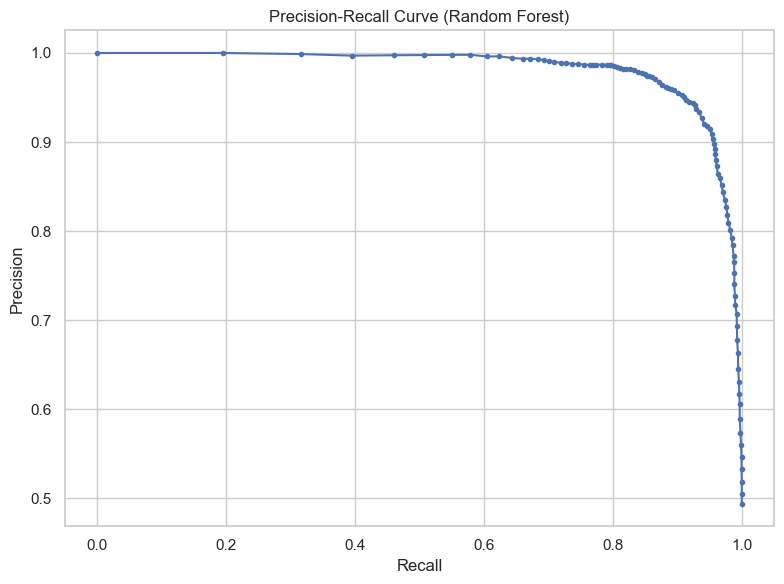

ROC AUC: 0.9802


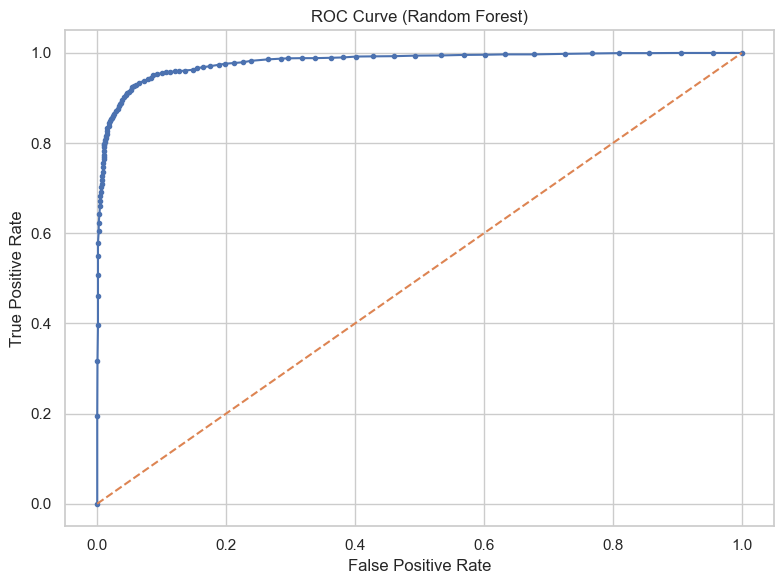

Log Loss: 0.2081


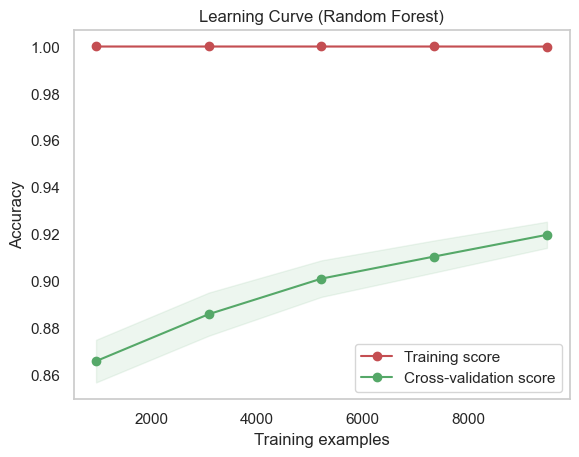

In [387]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_recall_curve, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

# Function to plot precision-recall curve
def plot_precision_recall_curve(precision, recall):
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve (Random Forest)')
    plt.tight_layout()
    plt.show()

# Function to plot ROC curve
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (Random Forest)')
    plt.tight_layout()
    plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on test set
y_pred = rf_model.predict(X_test)
y_prob = rf_model.predict_proba(X_test)

# Evaluate the model
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob[:, 1])
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")
plot_precision_recall_curve(precision, recall)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
roc_auc = auc(fpr, tpr)
print(f"ROC AUC: {roc_auc:.4f}")
plot_roc_curve(fpr, tpr)

# Log Loss
logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

# Learning Curve
title = "Learning Curve (Random Forest)"
plot_learning_curve(rf_model, title, X_train, y_train, cv=5, n_jobs=-1)

plt.show()


## XGBoost Classifier

In [388]:
!pip install xgboost


[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip


Confusion Matrix:
[[2505   69]
 [ 134 2380]]
Accuracy: 0.9601
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      2574
           1       0.97      0.95      0.96      2514

    accuracy                           0.96      5088
   macro avg       0.96      0.96      0.96      5088
weighted avg       0.96      0.96      0.96      5088

Precision-Recall AUC: 0.9930


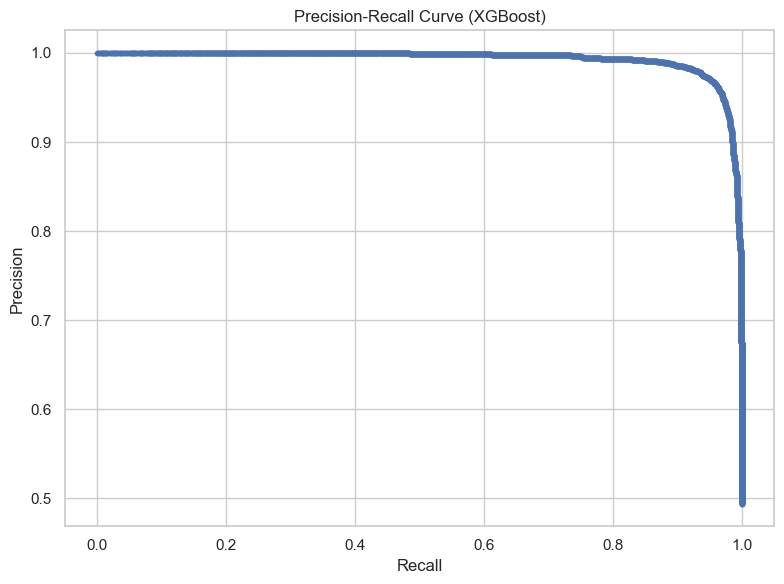

ROC AUC: 0.9930


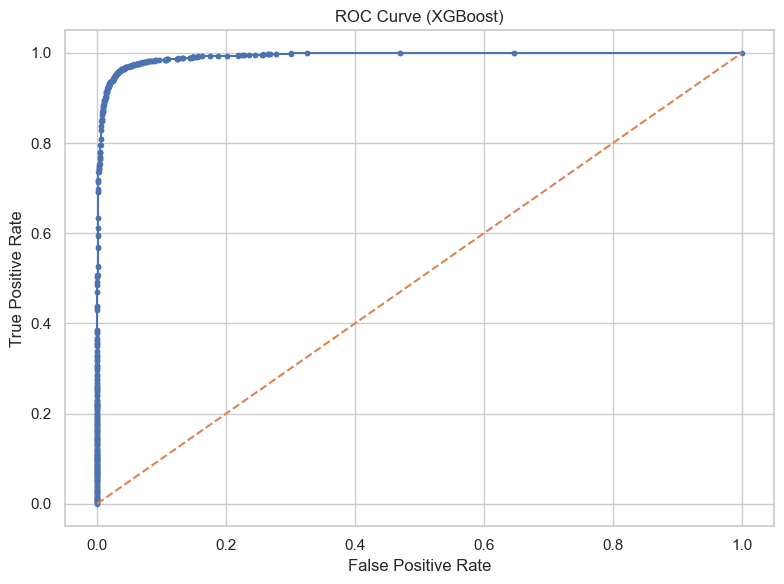

Log Loss: 0.1115


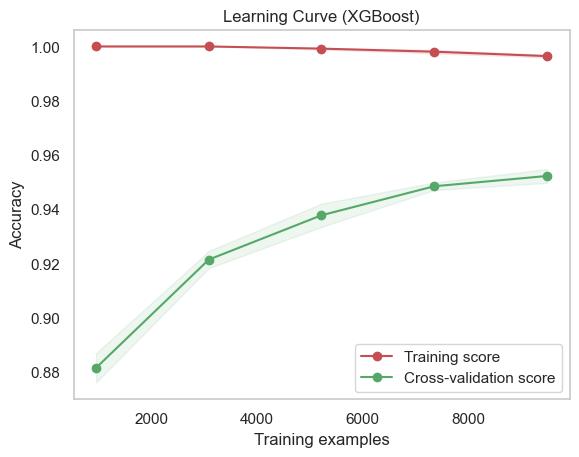

In [389]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_recall_curve, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

# Function to plot precision-recall curve
def plot_precision_recall_curve(precision, recall):
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve (XGBoost)')
    plt.tight_layout()
    plt.show()

# Function to plot ROC curve
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (XGBoost)')
    plt.tight_layout()
    plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Train the XGBoost Classifier model
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)

# Predict on test set
y_pred = xgb_model.predict(X_test)
y_prob = xgb_model.predict_proba(X_test)

# Evaluate the model
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob[:, 1])
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")
plot_precision_recall_curve(precision, recall)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
roc_auc = auc(fpr, tpr)
print(f"ROC AUC: {roc_auc:.4f}")
plot_roc_curve(fpr, tpr)

# Log Loss
logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

# Learning Curve
title = "Learning Curve (XGBoost)"
plot_learning_curve(xgb_model, title, X_train, y_train, cv=5, n_jobs=-1)

plt.show()


In [390]:
# Predict probabilities
from sklearn.metrics import log_loss

y_pred_proba = xgb_model.predict_proba(X_test)

# Calculate log loss
logloss = log_loss(y_test, y_pred_proba)

print(f'Log Loss: {logloss}')


Log Loss: 0.11145414679639533


[0]	validation_0-logloss:0.53432	validation_1-logloss:0.53312
[1]	validation_0-logloss:0.44615	validation_1-logloss:0.44399
[2]	validation_0-logloss:0.39039	validation_1-logloss:0.38788
[3]	validation_0-logloss:0.35254	validation_1-logloss:0.35027
[4]	validation_0-logloss:0.32624	validation_1-logloss:0.32530
[5]	validation_0-logloss:0.30628	validation_1-logloss:0.30594
[6]	validation_0-logloss:0.29155	validation_1-logloss:0.29225
[7]	validation_0-logloss:0.28085	validation_1-logloss:0.28221
[8]	validation_0-logloss:0.27102	validation_1-logloss:0.27350
[9]	validation_0-logloss:0.26134	validation_1-logloss:0.26592
[10]	validation_0-logloss:0.25200	validation_1-logloss:0.25846
[11]	validation_0-logloss:0.23892	validation_1-logloss:0.24656
[12]	validation_0-logloss:0.23380	validation_1-logloss:0.24401
[13]	validation_0-logloss:0.22486	validation_1-logloss:0.23613
[14]	validation_0-logloss:0.21489	validation_1-logloss:0.22825
[15]	validation_0-logloss:0.20755	validation_1-logloss:0.22461
[1

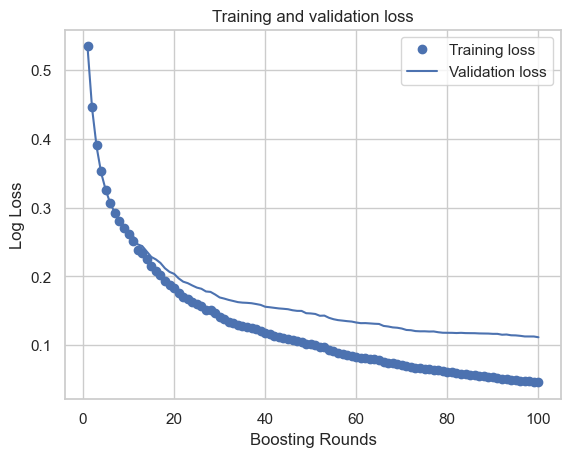

Accuracy: 0.9601022012578616


In [391]:
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Assuming you have already defined and compiled your XGBoost model
# and have your training and test data X_train, X_test, y_train, y_test

# Define your XGBoost model
xgb = XGBClassifier( eval_metric='logloss')

# Train the XGBoost model
history = xgb.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=True)

# Get training history
train_loss = history.evals_result()['validation_0']['logloss']
val_loss = history.evals_result()['validation_1']['logloss']
epochs = range(1, len(train_loss) + 1)

# Plot loss
plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Boosting Rounds')
plt.ylabel('Log Loss')
plt.legend()
plt.show()

# Predict on the test set
y_pred = xgb.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


[0]	validation_0-logloss:0.53432	validation_1-logloss:0.53312
[1]	validation_0-logloss:0.44615	validation_1-logloss:0.44399
[2]	validation_0-logloss:0.39039	validation_1-logloss:0.38788
[3]	validation_0-logloss:0.35254	validation_1-logloss:0.35027
[4]	validation_0-logloss:0.32624	validation_1-logloss:0.32530
[5]	validation_0-logloss:0.30628	validation_1-logloss:0.30594
[6]	validation_0-logloss:0.29155	validation_1-logloss:0.29225
[7]	validation_0-logloss:0.28085	validation_1-logloss:0.28221
[8]	validation_0-logloss:0.27102	validation_1-logloss:0.27350
[9]	validation_0-logloss:0.26134	validation_1-logloss:0.26592
[10]	validation_0-logloss:0.25200	validation_1-logloss:0.25846
[11]	validation_0-logloss:0.23892	validation_1-logloss:0.24656
[12]	validation_0-logloss:0.23380	validation_1-logloss:0.24401
[13]	validation_0-logloss:0.22486	validation_1-logloss:0.23613
[14]	validation_0-logloss:0.21489	validation_1-logloss:0.22825
[15]	validation_0-logloss:0.20755	validation_1-logloss:0.22461
[1

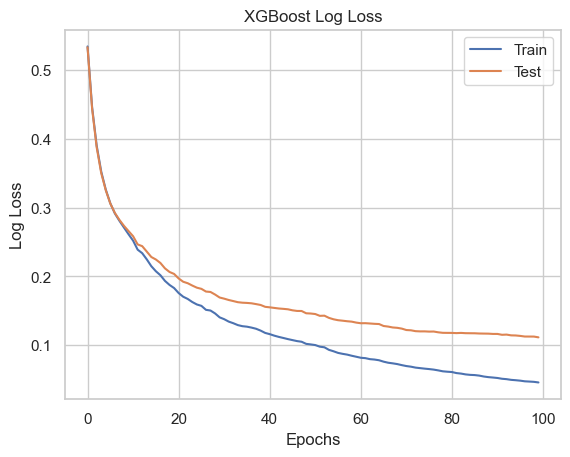

In [392]:
eval_set = [(X_train, y_train), (X_test, y_test)]
xgb_model = XGBClassifier(eval_metric="logloss")
xgb_model.fit(X_train, y_train, eval_set=eval_set, verbose=True)

# Retrieve log loss history
results = xgb_model.evals_result()

# Plot log loss
epochs = len(results['validation_0']['logloss'])
x_axis = range(0, epochs)

plt.figure()
plt.plot(x_axis, results['validation_0']['logloss'], label='Train')
plt.plot(x_axis, results['validation_1']['logloss'], label='Test')
plt.xlabel('Epochs')
plt.ylabel('Log Loss')
plt.title('XGBoost Log Loss')
plt.legend()
plt.show()


##Pickle file of XgB

In [393]:
#printing pickle file for xgbost
import pickle
with open('xgb_model.pkl', 'wb') as file:
    pickle.dump(xgb, file)
with open('xgb_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)
print(loaded_model)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)


##Grid Search On XGB

In [394]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, log_loss
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split

# Generate a random dataset for illustration
X, y = make_classification(n_samples=1000, n_features=20, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize XGBoost Classifier
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# Define parameter grid for Grid Search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
    'gamma': [0, 0.1, 0.2, 0.3],
    'alpha': [0, 0.1, 0.5, 1],
    'lambda': [1, 1.5, 2, 3]
}

# Initialize Grid Search
xgb_grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')

# Fit Grid Search
xgb_grid_search.fit(X_train, y_train)

# Predict class labels
y_pred_xgb_gs = xgb_grid_search.predict(X_test)

# Predict probabilities
y_pred_proba_xgb_gs = xgb_grid_search.predict_proba(X_test)

# Print performance metrics
print("\nXGBoost Grid Search Performance with Regularization:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_gs))
print("Log Loss:", log_loss(y_test, y_pred_proba_xgb_gs))
print("Classification Report:")
print(classification_report(y_test, y_pred_xgb_gs))


/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [21:55:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [21:55:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [21:55:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [21:55:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(sms

KeyboardInterrupt: 

## GB classifier

Confusion Matrix:
[[83 10]
 [16 91]]
Accuracy: 0.8700
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.89      0.86        93
           1       0.90      0.85      0.88       107

    accuracy                           0.87       200
   macro avg       0.87      0.87      0.87       200
weighted avg       0.87      0.87      0.87       200

Precision-Recall AUC: 0.9448


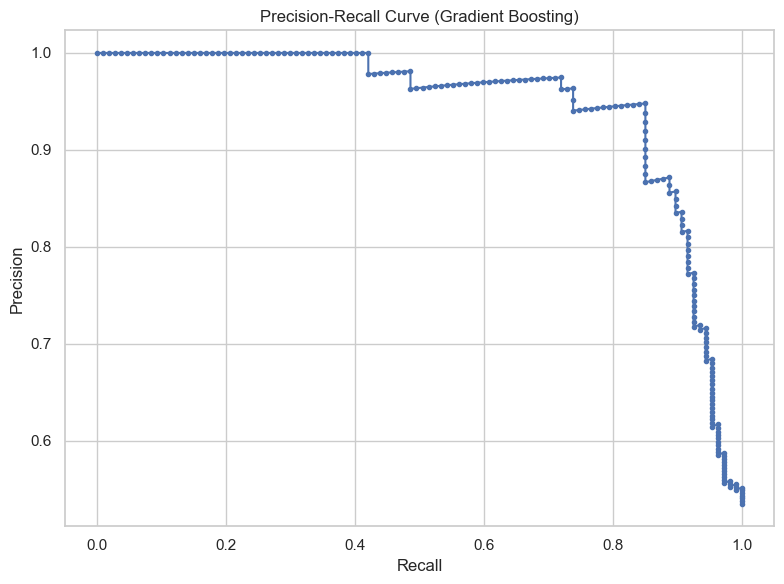

ROC AUC: 0.9213


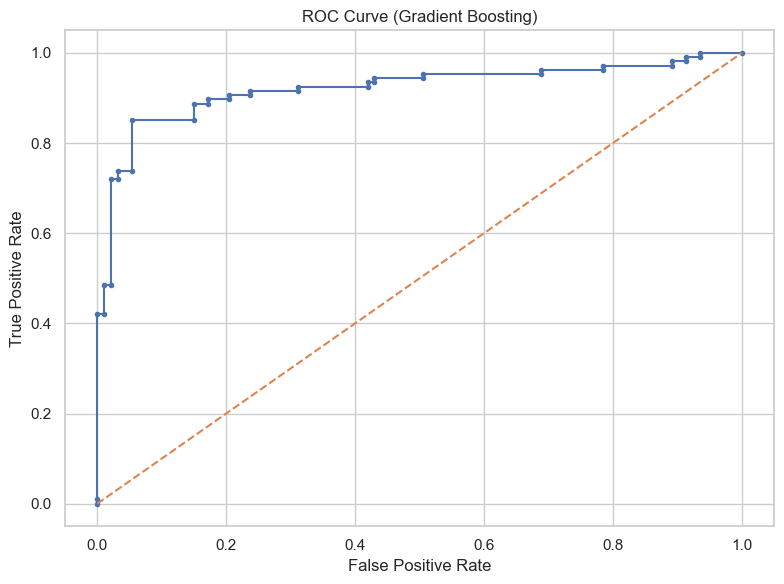

Log Loss: 0.3585


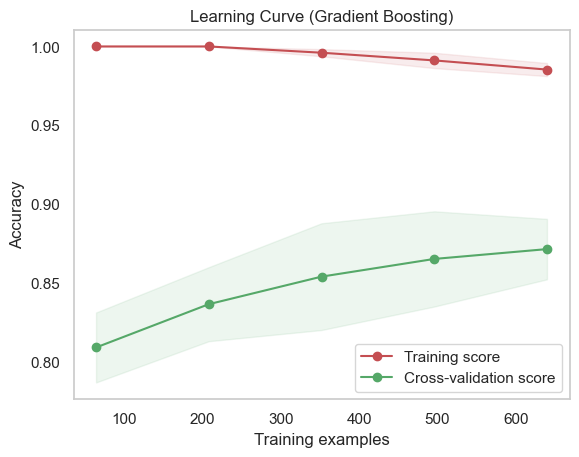

In [444]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_recall_curve, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

# Function to plot precision-recall curve
def plot_precision_recall_curve(precision, recall):
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve (Gradient Boosting)')
    plt.tight_layout()
    plt.show()

# Function to plot ROC curve
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (Gradient Boosting)')
    plt.tight_layout()
    plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Assuming X_train, X_test, y_train, y_test are already defined

# Train the Gradient Boosting Classifier model
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)

# Predict on test set
y_pred = gb_model.predict(X_test)
y_prob = gb_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob)
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")
plot_precision_recall_curve(precision, recall)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print(f"ROC AUC: {roc_auc:.4f}")
plot_roc_curve(fpr, tpr)

# Log Loss
logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

# Learning Curve
title = "Learning Curve (Gradient Boosting)"
plot_learning_curve(gb_model, title, X_train, y_train, cv=5, n_jobs=-1)

plt.show()


## ADA BoST

Confusion Matrix:
[[79 14]
 [17 90]]
Accuracy: 0.8450
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.85      0.84        93
           1       0.87      0.84      0.85       107

    accuracy                           0.84       200
   macro avg       0.84      0.85      0.84       200
weighted avg       0.85      0.84      0.85       200

Precision-Recall AUC: 0.9206


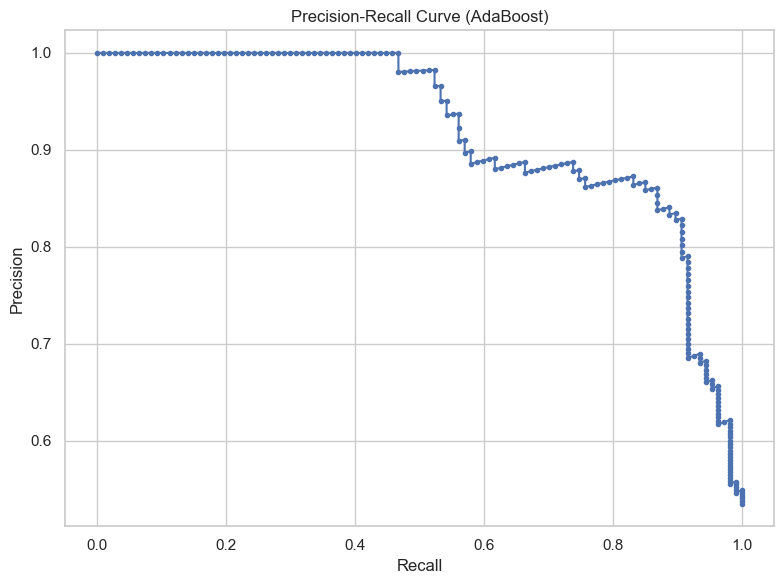

ROC AUC: 0.8977


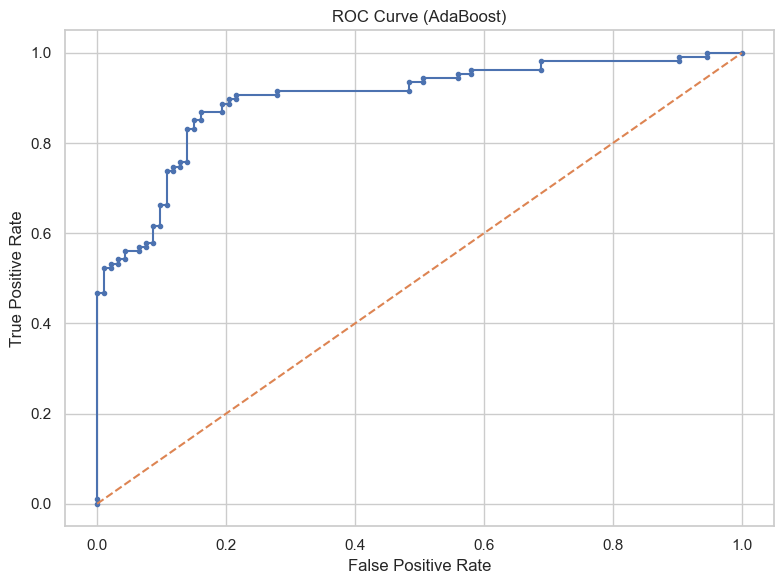

Log Loss: 0.6493


/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorit

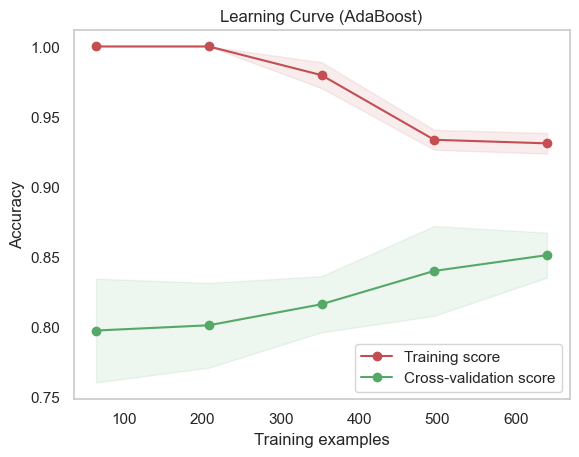

In [445]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_recall_curve, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve

# Function to plot precision-recall curve
def plot_precision_recall_curve(precision, recall):
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve (AdaBoost)')
    plt.tight_layout()
    plt.show()

# Function to plot ROC curve
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve (AdaBoost)')
    plt.tight_layout()
    plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Assuming X_train, X_test, y_train, y_test are already defined

# Train the AdaBoost Classifier model
adaboost_model = AdaBoostClassifier()
adaboost_model.fit(X_train, y_train)

# Predict on test set
y_pred = adaboost_model.predict(X_test)
y_prob = adaboost_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

print("Classification Report:")
report = classification_report(y_test, y_pred)
print(report)

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob)
pr_auc = auc(recall, precision)
print(f"Precision-Recall AUC: {pr_auc:.4f}")
plot_precision_recall_curve(precision, recall)

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
print(f"ROC AUC: {roc_auc:.4f}")
plot_roc_curve(fpr, tpr)

# Log Loss
logloss = log_loss(y_test, y_prob)
print(f"Log Loss: {logloss:.4f}")

# Learning Curve
title = "Learning Curve (AdaBoost)"
plot_learning_curve(adaboost_model, title, X_train, y_train, cv=5, n_jobs=-1)

plt.show()


## Overall all data set basic and hybrid model

In [446]:
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import confusion_matrix, log_loss, classification_report, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
import numpy as np



# Traditional classifiers
classifiers = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'AdaBoost': AdaBoostClassifier()
}

print("Traditional Classifiers:")
for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_pred_proba = clf.predict_proba(X_test)

    score = clf.score(X_test, y_test)
    cm = confusion_matrix(y_test, y_pred)
    ll = log_loss(y_test, y_pred_proba)
    report = classification_report(y_test, y_pred)

    # Calculate RMSE based on predicted probabilities
    y_pred_proba_max = np.max(y_pred_proba, axis=1)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred_proba_max))

    print(f"\n{name}:")
    print(f"Accuracy: {score:.2f}")
    print(f"Confusion Matrix:\n{cm}")
    print(f"Classification Report:\n{report}")
    print(f"Log Loss: {ll:.2f}")
    print(f"RMSE: {rmse:.2f}")

# Helper class for hybrid models
class BoostingModel(BaseEstimator, ClassifierMixin):
    def __init__(self, base_classifier, boosting_model):
        self.base_classifier = base_classifier
        self.boosting_model = boosting_model

    def fit(self, X, y):
        # Fit the base classifier
        self.base_classifier.fit(X, y)
        # Use the predictions of the base classifier as new features
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Fit the boosting model on the new features
        self.boosting_model.fit(base_predictions, y)
        return self

    def predict(self, X):
        # Use the base classifier to make predictions
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Use the boosting model to make final predictions
        return self.boosting_model.predict(base_predictions)

    def predict_proba(self, X):
        # Use the base classifier to make predictions
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Use the boosting model to make probability estimates
        return self.boosting_model.predict_proba(base_predictions)

# Define hybrid models
boosting_model = GradientBoostingClassifier()

hybrid_classifiers = {
    'DTBM': BoostingModel(DecisionTreeClassifier(), boosting_model),
    'RFBM': BoostingModel(RandomForestClassifier(), boosting_model),
    'KNNBM': BoostingModel(KNeighborsClassifier(), boosting_model),
    'GBBM': BoostingModel(GradientBoostingClassifier(), boosting_model),
    'ABBM': BoostingModel(AdaBoostClassifier(), boosting_model)
}

print("\nHybrid Models:")
for name, clf in hybrid_classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_pred_proba = clf.predict_proba(X_test)

    score = clf.score(X_test, y_test)
    cm = confusion_matrix(y_test, y_pred)
    ll = log_loss(y_test, y_pred_proba)
    report = classification_report(y_test, y_pred)

    # Calculate RMSE based on predicted probabilities
    y_pred_proba_max = np.max(y_pred_proba, axis=1)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred_proba_max))

    print(f"\n{name}:")
    print(f"Accuracy: {score:.2f}")
    print(f"Confusion Matrix:\n{cm}")
    print(f"Classification Report:\n{report}")
    print(f"Log Loss: {ll:.2f}")
    print(f"RMSE: {rmse:.2f}")


Traditional Classifiers:

Decision Tree:
Accuracy: 0.82
Confusion Matrix:
[[79 14]
 [21 86]]
Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.85      0.82        93
           1       0.86      0.80      0.83       107

    accuracy                           0.82       200
   macro avg       0.82      0.83      0.82       200
weighted avg       0.83      0.82      0.83       200

Log Loss: 6.31
RMSE: 0.68

Random Forest:
Accuracy: 0.88
Confusion Matrix:
[[86  7]
 [18 89]]
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.92      0.87        93
           1       0.93      0.83      0.88       107

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.87       200
weighted avg       0.88      0.88      0.88       200

Log Loss: 0.35
RMSE: 0.60

K-Nearest Neighbors:
Accuracy: 0.81
Confusion Matrix:
[[80 13]
 [25 82]]
Classificatio

## Rnadom forest with L1,L2 optimization


Random Forest L1 Model Evaluation:
Confusion Matrix:
[[85  8]
 [16 91]]
Accuracy: 0.8800
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.91      0.88        93
           1       0.92      0.85      0.88       107

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.88       200
weighted avg       0.88      0.88      0.88       200

Precision-Recall AUC: 0.9444


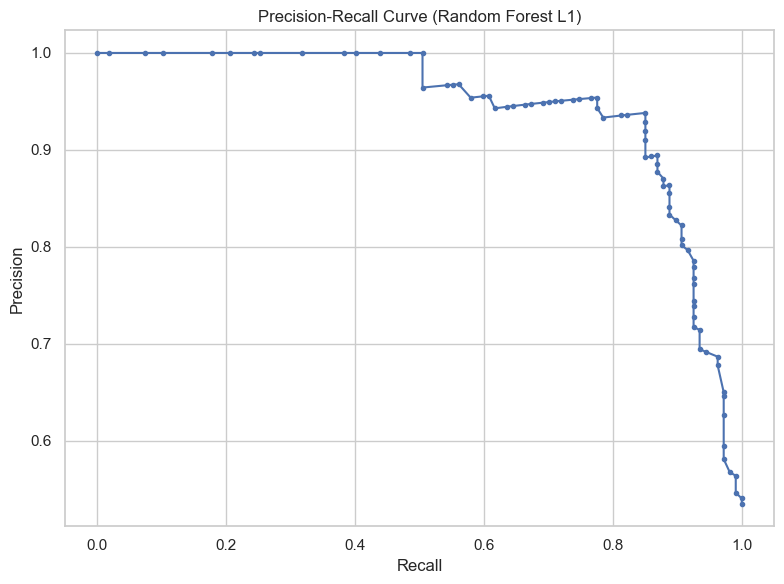

ROC AUC: 0.9234


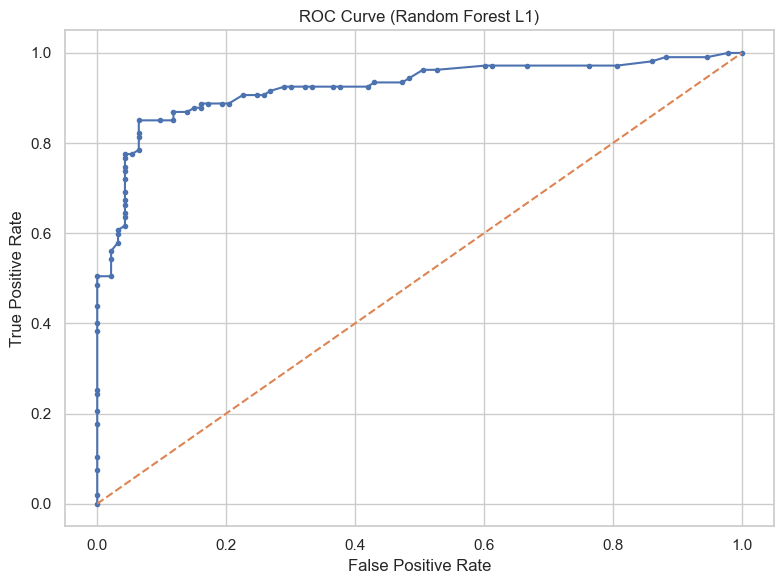

Log Loss: 0.3569

Random Forest L2 Model Evaluation:
Confusion Matrix:
[[85  8]
 [16 91]]
Accuracy: 0.8800
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.91      0.88        93
           1       0.92      0.85      0.88       107

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.88       200
weighted avg       0.88      0.88      0.88       200

Precision-Recall AUC: 0.9444


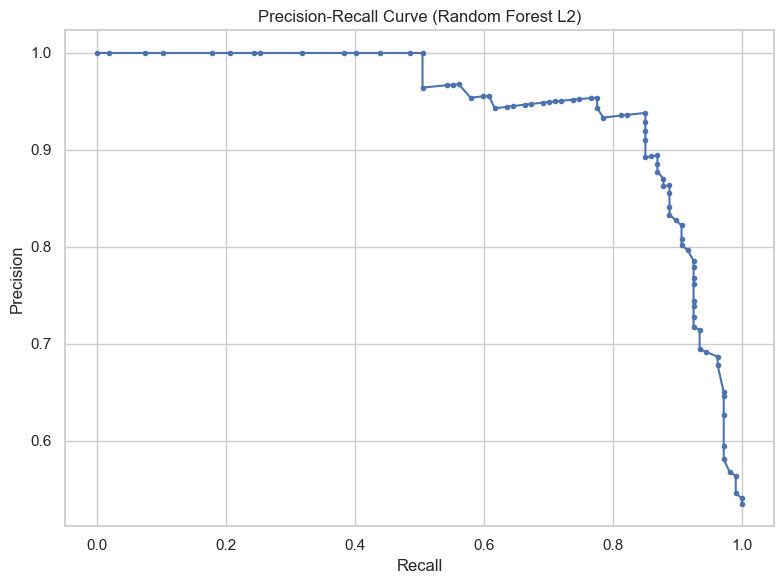

ROC AUC: 0.9234


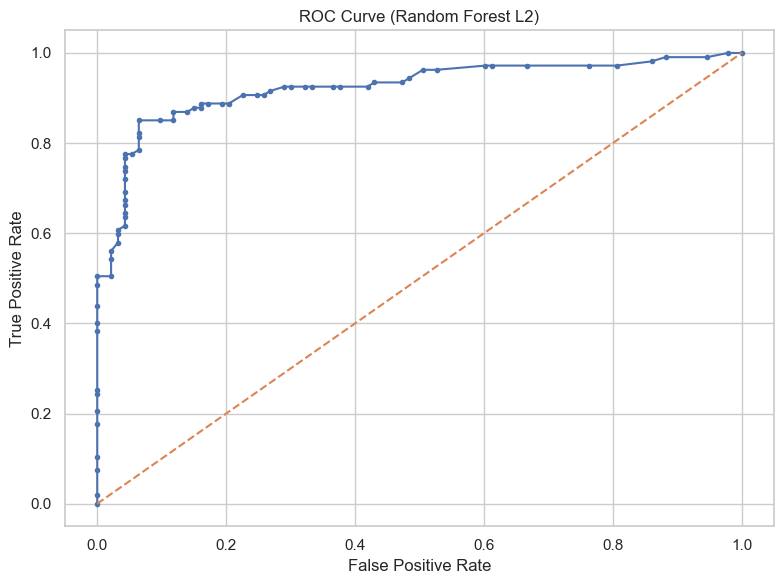

Log Loss: 0.3569


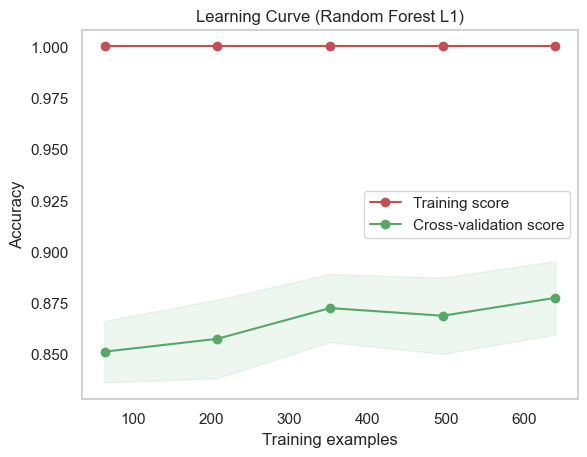

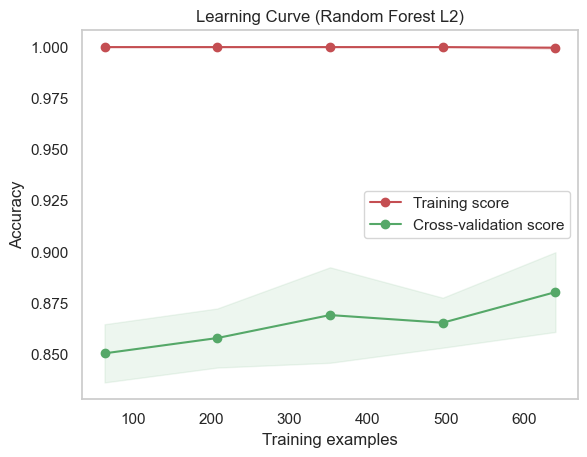

In [447]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_recall_curve, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve
from sklearn.utils.class_weight import compute_class_weight

# Function to plot precision-recall curve
def plot_precision_recall_curve(precision, recall, model_name):
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({model_name})')
    plt.tight_layout()
    plt.show()

# Function to plot ROC curve
def plot_roc_curve(fpr, tpr, model_name):
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, marker='.')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve ({model_name})')
    plt.tight_layout()
    plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Determine class weights
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Train Random Forest models
rf_model_l1 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_model_l2 = RandomForestClassifier(n_estimators=100, random_state=42, class_weight=class_weights_dict)

rf_model_l1.fit(X_train, y_train)
rf_model_l2.fit(X_train, y_train)

# Predict on test set
y_pred_l1 = rf_model_l1.predict(X_test)
y_prob_l1 = rf_model_l1.predict_proba(X_test)

y_pred_l2 = rf_model_l2.predict(X_test)
y_prob_l2 = rf_model_l2.predict_proba(X_test)

# Evaluate the models
for model_name, y_pred, y_prob in zip(['Random Forest L1', 'Random Forest L2'], [y_pred_l1, y_pred_l2], [y_prob_l1, y_prob_l2]):
    print(f"\n{model_name} Model Evaluation:")
    print("Confusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    print(cm)

    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {accuracy:.4f}")

    print("Classification Report:")
    report = classification_report(y_test, y_pred)
    print(report)

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_test, y_prob[:, 1])
    pr_auc = auc(recall, precision)
    print(f"Precision-Recall AUC: {pr_auc:.4f}")
    plot_precision_recall_curve(precision, recall, model_name)

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
    roc_auc = auc(fpr, tpr)
    print(f"ROC AUC: {roc_auc:.4f}")
    plot_roc_curve(fpr, tpr, model_name)

    # Log Loss
    logloss = log_loss(y_test, y_prob)
    print(f"Log Loss: {logloss:.4f}")

# Learning Curve
title = "Learning Curve (Random Forest L1)"
plot_learning_curve(rf_model_l1, title, X_train, y_train, cv=5, n_jobs=-1)

title = "Learning Curve (Random Forest L2)"
plot_learning_curve(rf_model_l2, title, X_train, y_train, cv=5, n_jobs=-1)

plt.show()


In [448]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import log_loss

# Define the parameter grid for L1 regularization model (no direct L1 regularization, using other hyperparameters instead)
param_grid_l1 = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'criterion': ['entropy']
}

# Define the parameter grid for L2 regularization model
param_grid_l2 = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5, 10],
    'criterion': ['entropy']
}

# Create and fit the GridSearchCV for L1 model
grid_search_l1 = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_l1, cv=5, scoring='accuracy', n_jobs=-1)
grid_search_l1.fit(X_train, y_train)
best_rf_l1 = grid_search_l1.best_estimator_

# Create and fit the GridSearchCV for L2 model
grid_search_l2 = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_l2, cv=5, scoring='accuracy', n_jobs=-1)
grid_search_l2.fit(X_train, y_train)
best_rf_l2 = grid_search_l2.best_estimator_

# Evaluate the best models
y_pred_rf_l1 = best_rf_l1.predict(X_test)
y_pred_rf_l2 = best_rf_l2.predict(X_test)
y_pred_proba_l1 = best_rf_l1.predict_proba(X_test)
y_pred_proba_l2 = best_rf_l2.predict_proba(X_test)

# Print accuracy
print("Best L1 model accuracy:", best_rf_l1.score(X_test, y_test))
print("Best L2 model accuracy:", best_rf_l2.score(X_test, y_test))

# Calculate log loss
logloss_l1 = log_loss(y_test, y_pred_proba_l1)
logloss_l2 = log_loss(y_test, y_pred_proba_l2)
print(f'Log Loss L1: {logloss_l1}')
print(f'Log Loss L2: {logloss_l2}')


KeyboardInterrupt: 

## Gtadient Bosting with L1,L2 optimization

Model performance:
L1 Score: 0.89
L2 Score: 0.865
Log Loss L1: 0.44958685561489775
Log Loss L2: 0.4530902551327415
Precision L1: 0.9381443298969072
Recall L1: 0.8504672897196262
F1 Score L1: 0.8921568627450981
Precision L2: 0.9081632653061225
Recall L2: 0.8317757009345794
F1 Score L2: 0.8682926829268293


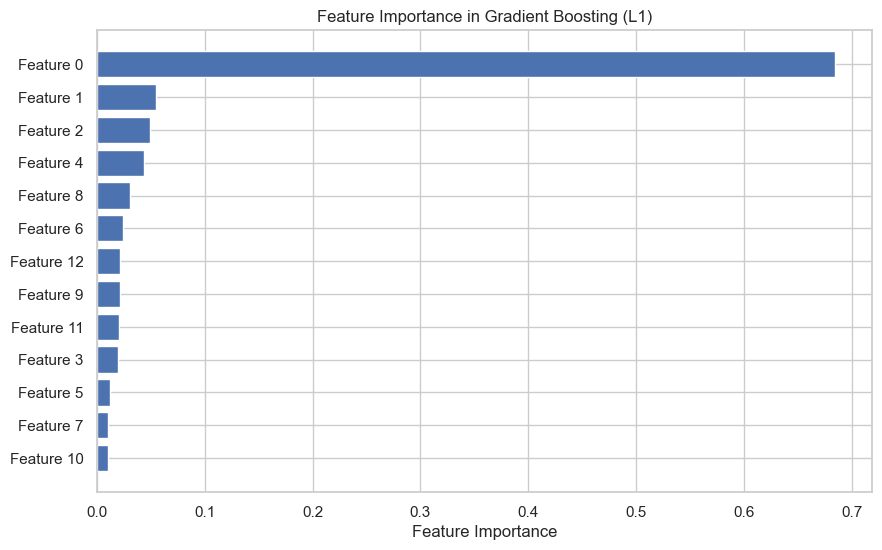

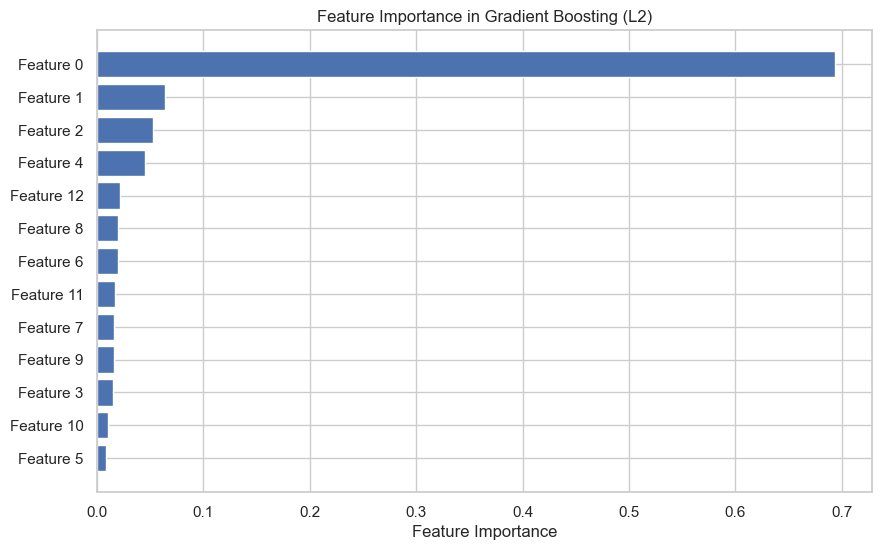

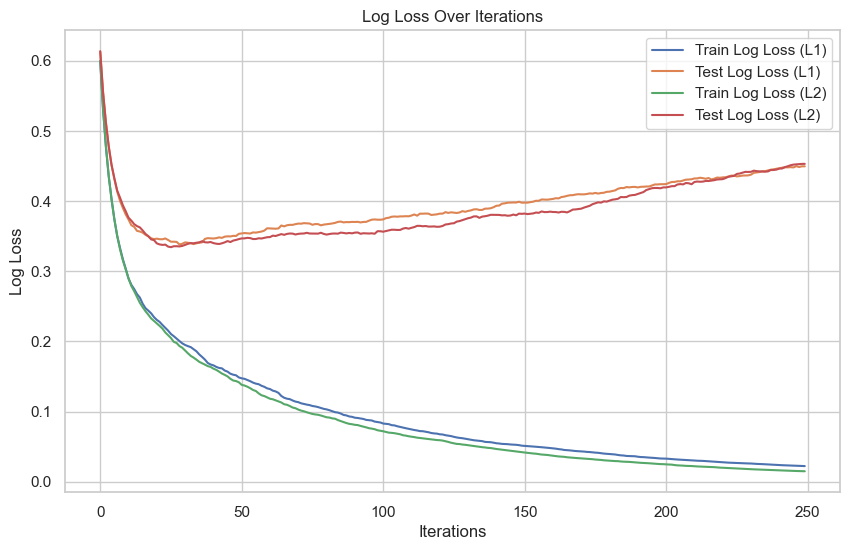

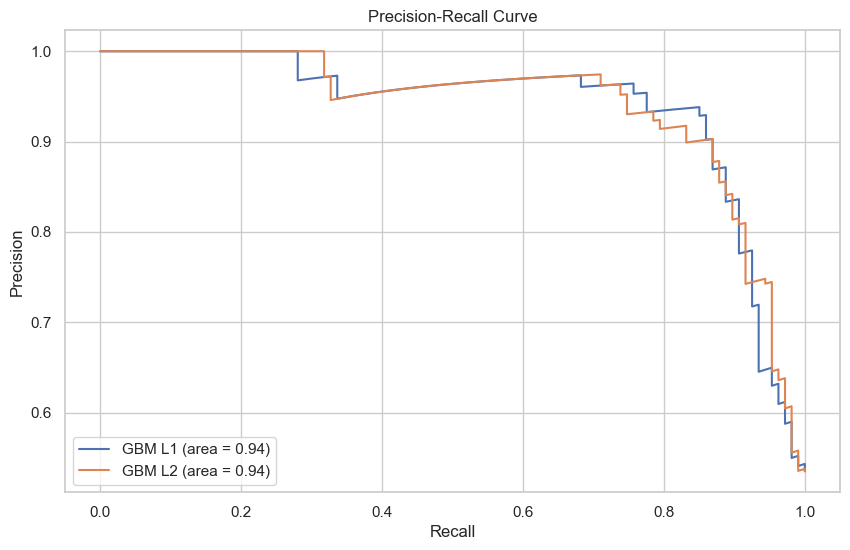

In [449]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import export_graphviz
import graphviz
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve, auc, log_loss
from matplotlib.colors import ListedColormap

# Fit the models
gbm_l1 = GradientBoostingClassifier(n_estimators=250, learning_rate=0.15, max_depth=3, random_state=42, loss='log_loss', min_samples_split=10)
gbm_l1.fit(X_train, y_train)
y_pred_gbm_l1 = gbm_l1.predict(X_test)
y_pred_proba_l1 = gbm_l1.predict_proba(X_test)

gbm_l2 = GradientBoostingClassifier(n_estimators=250, learning_rate=0.15, max_depth=3, random_state=42, loss='log_loss', min_samples_split=10, min_samples_leaf=5)
gbm_l2.fit(X_train, y_train)
y_pred_gbm_l2 = gbm_l2.predict(X_test)
y_pred_proba_l2 = gbm_l2.predict_proba(X_test)

# Print model performance
print('Model performance:')
print(f'L1 Score: {gbm_l1.score(X_test, y_test)}')
print(f'L2 Score: {gbm_l2.score(X_test, y_test)}')

# Log Loss
logloss_l1 = log_loss(y_test, y_pred_proba_l1)
logloss_l2 = log_loss(y_test, y_pred_proba_l2)
print(f'Log Loss L1: {logloss_l1}')
print(f'Log Loss L2: {logloss_l2}')

# Precision, Recall, F1 Score for gbm_l1
precision_l1 = precision_score(y_test, y_pred_gbm_l1)
recall_l1 = recall_score(y_test, y_pred_gbm_l1)
f1_l1 = f1_score(y_test, y_pred_gbm_l1)
print(f'Precision L1: {precision_l1}')
print(f'Recall L1: {recall_l1}')
print(f'F1 Score L1: {f1_l1}')

# Precision, Recall, F1 Score for gbm_l2
precision_l2 = precision_score(y_test, y_pred_gbm_l2)
recall_l2 = recall_score(y_test, y_pred_gbm_l2)
f1_l2 = f1_score(y_test, y_pred_gbm_l2)
print(f'Precision L2: {precision_l2}')
print(f'Recall L2: {recall_l2}')
print(f'F1 Score L2: {f1_l2}')

# Visualize the first decision tree from gbm_l1
dot_data = export_graphviz(gbm_l1.estimators_[0, 0], out_file=None,
                           feature_names=[f'Feature {i}' for i in range(X_train.shape[1])],
                           class_names=['class_0', 'class_1'],
                           filled=True, rounded=True,
                           special_characters=True)
graph = graphviz.Source(dot_data)
graph.render("tree_0_l1")
graph

# Visualize the first decision tree from gbm_l2
dot_data = export_graphviz(gbm_l2.estimators_[0, 0], out_file=None,
                           feature_names=[f'Feature {i}' for i in range(X_train.shape[1])],
                           class_names=['class_0', 'class_1'],
                           filled=True, rounded=True,
                           special_characters=True)
graph = graphviz.Source(dot_data)
graph.render("tree_0_l2")
graph

# Feature importance for gbm_l1
feature_importance_l1 = gbm_l1.feature_importances_
sorted_idx_l1 = np.argsort(feature_importance_l1)

# Plot feature importance for gbm_l1
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx_l1)), feature_importance_l1[sorted_idx_l1], align='center')
plt.yticks(range(len(sorted_idx_l1)), [f'Feature {i}' for i in sorted_idx_l1])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Gradient Boosting (L1)')
plt.show()

# Feature importance for gbm_l2
feature_importance_l2 = gbm_l2.feature_importances_
sorted_idx_l2 = np.argsort(feature_importance_l2)

# Plot feature importance for gbm_l2
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx_l2)), feature_importance_l2[sorted_idx_l2], align='center')
plt.yticks(range(len(sorted_idx_l2)), [f'Feature {i}' for i in sorted_idx_l2])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Gradient Boosting (L2)')
plt.show()

# Visualize the boosting process with log loss
train_log_loss_l1 = []
test_log_loss_l1 = []
train_log_loss_l2 = []
test_log_loss_l2 = []

for y_pred in gbm_l1.staged_predict_proba(X_train):
    train_log_loss_l1.append(log_loss(y_train, y_pred))
for y_pred in gbm_l1.staged_predict_proba(X_test):
    test_log_loss_l1.append(log_loss(y_test, y_pred))

for y_pred in gbm_l2.staged_predict_proba(X_train):
    train_log_loss_l2.append(log_loss(y_train, y_pred))
for y_pred in gbm_l2.staged_predict_proba(X_test):
    test_log_loss_l2.append(log_loss(y_test, y_pred))

# Plot log loss over iterations
plt.figure(figsize=(10, 6))
plt.plot(train_log_loss_l1, label='Train Log Loss (L1)')
plt.plot(test_log_loss_l1, label='Test Log Loss (L1)')
plt.plot(train_log_loss_l2, label='Train Log Loss (L2)')
plt.plot(test_log_loss_l2, label='Test Log Loss (L2)')
plt.xlabel('Iterations')
plt.ylabel('Log Loss')
plt.title('Log Loss Over Iterations')
plt.legend()
plt.show()

# Precision-Recall Curve
precision_l1_curve, recall_l1_curve, _ = precision_recall_curve(y_test, y_pred_proba_l1[:, 1])
pr_auc_l1 = auc(recall_l1_curve, precision_l1_curve)

precision_l2_curve, recall_l2_curve, _ = precision_recall_curve(y_test, y_pred_proba_l2[:, 1])
pr_auc_l2 = auc(recall_l2_curve, precision_l2_curve)

# Plot the precision-recall curves
plt.figure(figsize=(10, 6))
plt.plot(recall_l1_curve, precision_l1_curve, label=f'GBM L1 (area = {pr_auc_l1:.2f})')
plt.plot(recall_l2_curve, precision_l2_curve, label=f'GBM L2 (area = {pr_auc_l2:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

# Visualize decision boundary (only if the dataset has 2 features for simplicity)
if X_train.shape[1] == 2:
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    Z_l1 = gbm_l1.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_l1 = Z_l1.reshape(xx.shape)

    Z_l2 = gbm_l2.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_l2 = Z_l2.reshape(xx.shape)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.contourf(xx, yy, Z_l1, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Decision Boundary of Gradient Boosting (L1)')

    plt.subplot(1, 2, 2)
    plt.contourf(xx, yy, Z_l2, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Decision Boundary of Gradient Boosting (L2)')
    plt.show()


Model performance:
L1 Score: 0.89
L2 Score: 0.865
Log Loss L1: 0.44958685561489775
Log Loss L2: 0.4530902551327415
Precision L1: 0.9381443298969072
Recall L1: 0.8504672897196262
F1 Score L1: 0.8921568627450981
Precision L2: 0.9081632653061225
Recall L2: 0.8317757009345794
F1 Score L2: 0.8682926829268293


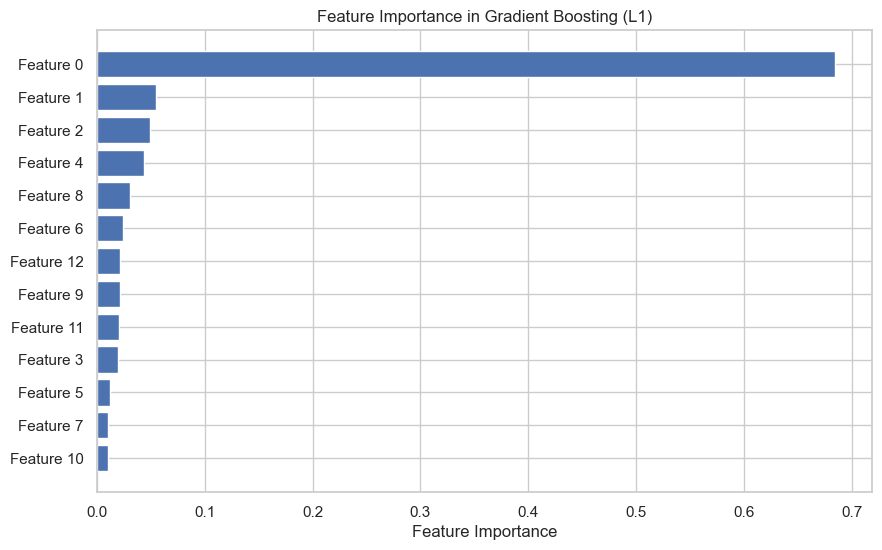

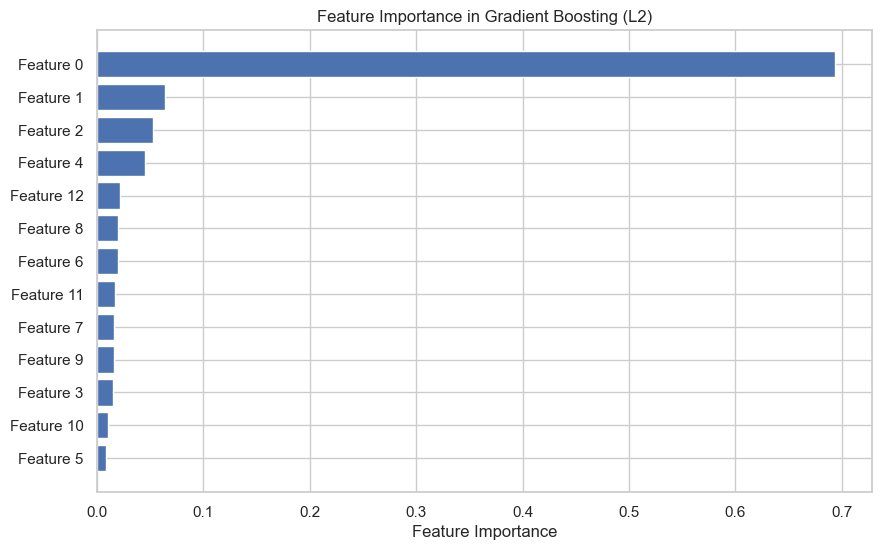

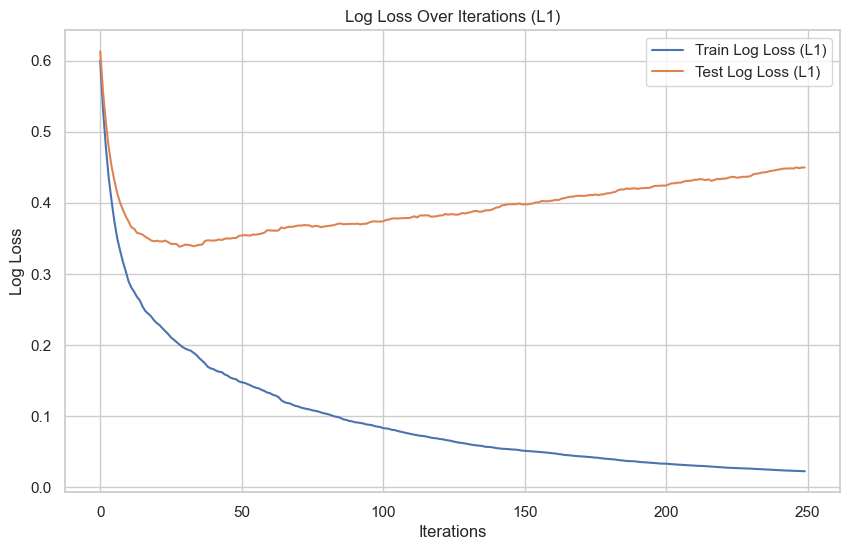

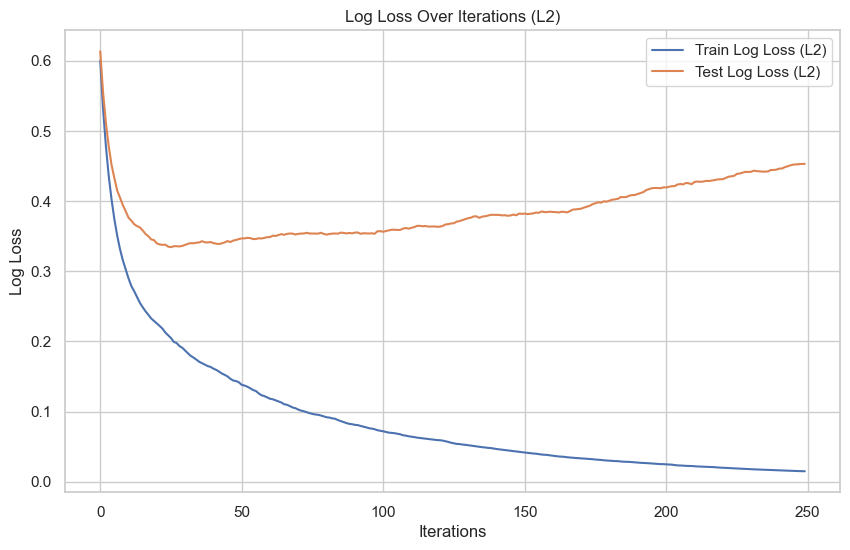

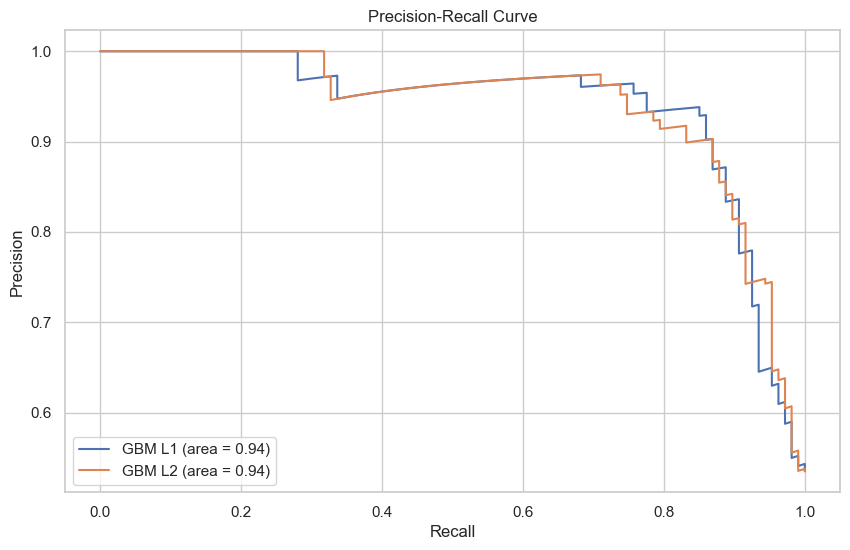

In [450]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import export_graphviz
import graphviz
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve, auc, log_loss
from matplotlib.colors import ListedColormap

# Fit the models
gbm_l1 = GradientBoostingClassifier(n_estimators=250, learning_rate=0.15, max_depth=3, random_state=42, loss='log_loss', min_samples_split=10)
gbm_l1.fit(X_train, y_train)
y_pred_gbm_l1 = gbm_l1.predict(X_test)
y_pred_proba_l1 = gbm_l1.predict_proba(X_test)

gbm_l2 = GradientBoostingClassifier(n_estimators=250, learning_rate=0.15, max_depth=3, random_state=42, loss='log_loss', min_samples_split=10, min_samples_leaf=5)
gbm_l2.fit(X_train, y_train)
y_pred_gbm_l2 = gbm_l2.predict(X_test)
y_pred_proba_l2 = gbm_l2.predict_proba(X_test)

# Print model performance
print('Model performance:')
print(f'L1 Score: {gbm_l1.score(X_test, y_test)}')
print(f'L2 Score: {gbm_l2.score(X_test, y_test)}')

# Log Loss
logloss_l1 = log_loss(y_test, y_pred_proba_l1)
logloss_l2 = log_loss(y_test, y_pred_proba_l2)
print(f'Log Loss L1: {logloss_l1}')
print(f'Log Loss L2: {logloss_l2}')

# Precision, Recall, F1 Score for gbm_l1
precision_l1 = precision_score(y_test, y_pred_gbm_l1)
recall_l1 = recall_score(y_test, y_pred_gbm_l1)
f1_l1 = f1_score(y_test, y_pred_gbm_l1)
print(f'Precision L1: {precision_l1}')
print(f'Recall L1: {recall_l1}')
print(f'F1 Score L1: {f1_l1}')

# Precision, Recall, F1 Score for gbm_l2
precision_l2 = precision_score(y_test, y_pred_gbm_l2)
recall_l2 = recall_score(y_test, y_pred_gbm_l2)
f1_l2 = f1_score(y_test, y_pred_gbm_l2)
print(f'Precision L2: {precision_l2}')
print(f'Recall L2: {recall_l2}')
print(f'F1 Score L2: {f1_l2}')

# Visualize the first decision tree from gbm_l1
dot_data = export_graphviz(gbm_l1.estimators_[0, 0], out_file=None,
                           feature_names=[f'Feature {i}' for i in range(X_train.shape[1])],
                           class_names=['class_0', 'class_1'],
                           filled=True, rounded=True,
                           special_characters=True)
graph = graphviz.Source(dot_data)
graph.render("tree_0_l1")
graph

# Visualize the first decision tree from gbm_l2
dot_data = export_graphviz(gbm_l2.estimators_[0, 0], out_file=None,
                           feature_names=[f'Feature {i}' for i in range(X_train.shape[1])],
                           class_names=['class_0', 'class_1'],
                           filled=True, rounded=True,
                           special_characters=True)
graph = graphviz.Source(dot_data)
graph.render("tree_0_l2")
graph

# Feature importance for gbm_l1
feature_importance_l1 = gbm_l1.feature_importances_
sorted_idx_l1 = np.argsort(feature_importance_l1)

# Plot feature importance for gbm_l1
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx_l1)), feature_importance_l1[sorted_idx_l1], align='center')
plt.yticks(range(len(sorted_idx_l1)), [f'Feature {i}' for i in sorted_idx_l1])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Gradient Boosting (L1)')
plt.show()

# Feature importance for gbm_l2
feature_importance_l2 = gbm_l2.feature_importances_
sorted_idx_l2 = np.argsort(feature_importance_l2)

# Plot feature importance for gbm_l2
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx_l2)), feature_importance_l2[sorted_idx_l2], align='center')
plt.yticks(range(len(sorted_idx_l2)), [f'Feature {i}' for i in sorted_idx_l2])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Gradient Boosting (L2)')
plt.show()

# Visualize the boosting process with log loss
train_log_loss_l1 = []
test_log_loss_l1 = []
train_log_loss_l2 = []
test_log_loss_l2 = []

for y_pred in gbm_l1.staged_predict_proba(X_train):
    train_log_loss_l1.append(log_loss(y_train, y_pred))
for y_pred in gbm_l1.staged_predict_proba(X_test):
    test_log_loss_l1.append(log_loss(y_test, y_pred))

for y_pred in gbm_l2.staged_predict_proba(X_train):
    train_log_loss_l2.append(log_loss(y_train, y_pred))
for y_pred in gbm_l2.staged_predict_proba(X_test):
    test_log_loss_l2.append(log_loss(y_test, y_pred))

# Plot log loss over iterations for L1
plt.figure(figsize=(10, 6))
plt.plot(train_log_loss_l1, label='Train Log Loss (L1)')
plt.plot(test_log_loss_l1, label='Test Log Loss (L1)')
plt.xlabel('Iterations')
plt.ylabel('Log Loss')
plt.title('Log Loss Over Iterations (L1)')
plt.legend()
plt.show()

# Plot log loss over iterations for L2
plt.figure(figsize=(10, 6))
plt.plot(train_log_loss_l2, label='Train Log Loss (L2)')
plt.plot(test_log_loss_l2, label='Test Log Loss (L2)')
plt.xlabel('Iterations')
plt.ylabel('Log Loss')
plt.title('Log Loss Over Iterations (L2)')
plt.legend()
plt.show()

# Precision-Recall Curve
precision_l1_curve, recall_l1_curve, _ = precision_recall_curve(y_test, y_pred_proba_l1[:, 1])
pr_auc_l1 = auc(recall_l1_curve, precision_l1_curve)

precision_l2_curve, recall_l2_curve, _ = precision_recall_curve(y_test, y_pred_proba_l2[:, 1])
pr_auc_l2 = auc(recall_l2_curve, precision_l2_curve)

# Plot the precision-recall curves
plt.figure(figsize=(10, 6))
plt.plot(recall_l1_curve, precision_l1_curve, label=f'GBM L1 (area = {pr_auc_l1:.2f})')
plt.plot(recall_l2_curve, precision_l2_curve, label=f'GBM L2 (area = {pr_auc_l2:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

# Visualize decision boundary (only if the dataset has 2 features for simplicity)
if X_train.shape[1] == 2:
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    Z_l1 = gbm_l1.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_l1 = Z_l1.reshape(xx.shape)

    Z_l2 = gbm_l2.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_l2 = Z_l2.reshape(xx.shape)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.contourf(xx, yy, Z_l1, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Decision Boundary of Gradient Boosting (L1)')

    plt.subplot(1, 2, 2)
    plt.contourf(xx, yy, Z_l2, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')


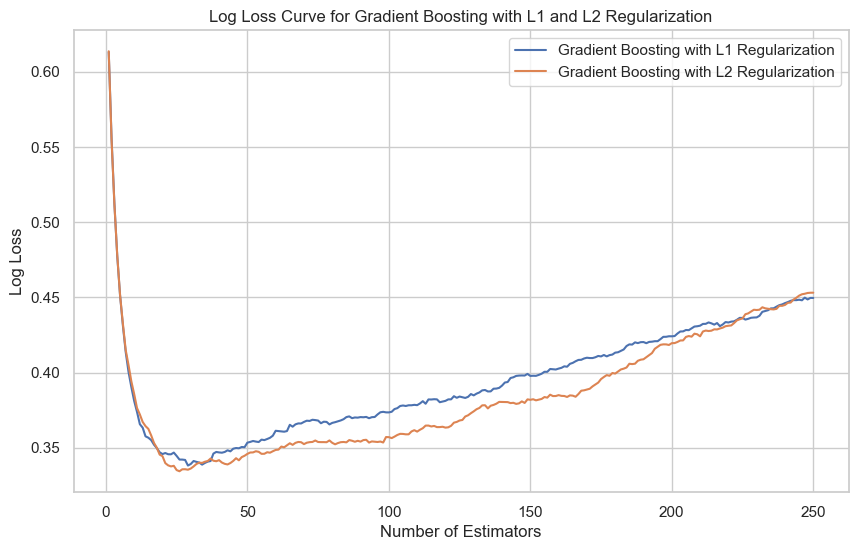

Final Log Loss for L1: 0.44958685561489775
Final Log Loss for L2: 0.4530902551327415
Accuracy for L1: 0.89
Accuracy for L2: 0.865


In [451]:
# Initialize lists to store log loss values
log_loss_l1 = []
log_loss_l2 = []

# Calculate staged log loss for gbm_l1
for y_pred_proba in gbm_l1.staged_predict_proba(X_test):
    log_loss_l1.append(log_loss(y_test, y_pred_proba))

# Calculate staged log loss for gbm_l2
for y_pred_proba in gbm_l2.staged_predict_proba(X_test):
    log_loss_l2.append(log_loss(y_test, y_pred_proba))

# Plot log loss curves
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, 251), log_loss_l1, label='Gradient Boosting with L1 Regularization')
plt.plot(np.arange(1, 251), log_loss_l2, label='Gradient Boosting with L2 Regularization')
plt.xlabel('Number of Estimators')
plt.ylabel('Log Loss')
plt.title('Log Loss Curve for Gradient Boosting with L1 and L2 Regularization')
plt.legend()
plt.show()

# Final log loss and accuracy
y_pred_proba_l1 = gbm_l1.predict_proba(X_test)
y_pred_proba_l2 = gbm_l2.predict_proba(X_test)

final_logloss_l1 = log_loss(y_test, y_pred_proba_l1)
final_logloss_l2 = log_loss(y_test, y_pred_proba_l2)

print(f'Final Log Loss for L1: {final_logloss_l1}')
print(f'Final Log Loss for L2: {final_logloss_l2}')
print(f'Accuracy for L1: {gbm_l1.score(X_test, y_test)}')
print(f'Accuracy for L2: {gbm_l2.score(X_test, y_test)}')

## Gradient bosting with L1, L2 optimization with exponential loss

In [452]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, log_loss # Import accuracy_score and log_loss

# Define GradientBoostingClassifier with L1 regularization
gbm_l1 = GradientBoostingClassifier(n_estimators=250, learning_rate=0.15, max_depth=3, random_state=42, loss='exponential', min_samples_split=10)
gbm_l1.fit(X_train, y_train)
y_pred_gbm_l1 = gbm_l1.predict(X_test)

# Define GradientBoostingClassifier with L2 regularization
gbm_l2 = GradientBoostingClassifier(n_estimators=250, learning_rate=0.15, max_depth=3, random_state=42, loss='exponential', min_samples_split=10, min_samples_leaf=5)
gbm_l2.fit(X_train, y_train)
y_pred_gbm_l2 = gbm_l2.predict(X_test)

print(gbm_l1.score(X_test,y_test))
print(gbm_l2.score(X_test,y_test))
#print test and train accuracy for L1
y_train_pred = gbm_l1.predict(X_train)
y_test_pred = gbm_l1.predict(X_test)
train_accuracy_l1 = accuracy_score(y_train, y_train_pred)
test_accuracy_l1 = accuracy_score(y_test, y_test_pred)
print(f'Accuracy Score on training data : {train_accuracy_l1:.4f}')
print(f'Accuracy Score on test data : {test_accuracy_l1:.4f}')
#print test and train accuracy for L2
y_train_pred = gbm_l2.predict(X_train)
y_test_pred = gbm_l2.predict(X_test)
train_accuracy_l2 = accuracy_score(y_train, y_train_pred)
test_accuracy_l2 = accuracy_score(y_test, y_test_pred)
print(f'Accuracy Score on training data : {train_accuracy_l2:.4f}')
print(f'Accuracy Score on test data : {test_accuracy_l2:.4f}')

#if we reduce learning rate we need to increase estimators otherwise model will underfit
y_pred_proba_l1 = gbm_l1.predict_proba(X_test)
y_pred_proba_l2 = gbm_l2.predict_proba(X_test)


# Calculate log loss of random_forest
logloss_l1 = log_loss(y_test, y_pred_proba_l1)
logloss_l2 = log_loss(y_test, y_pred_proba_l2)
print(f'Log Loss: {logloss_l1,logloss_l2}')

0.86
0.865
Accuracy Score on training data : 1.0000
Accuracy Score on test data : 0.8600
Accuracy Score on training data : 1.0000
Accuracy Score on test data : 0.8650
Log Loss: (0.6062773095107916, 0.6247884470528384)


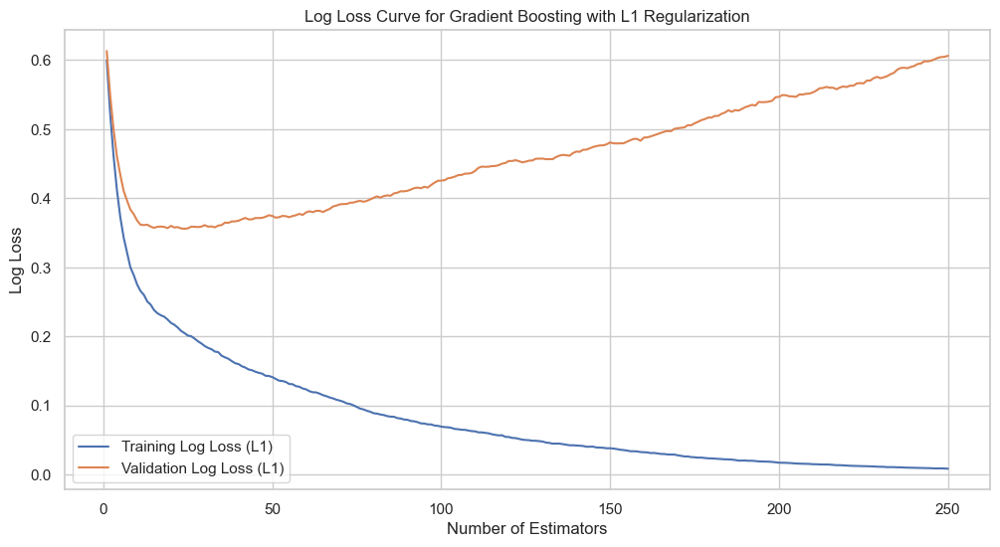

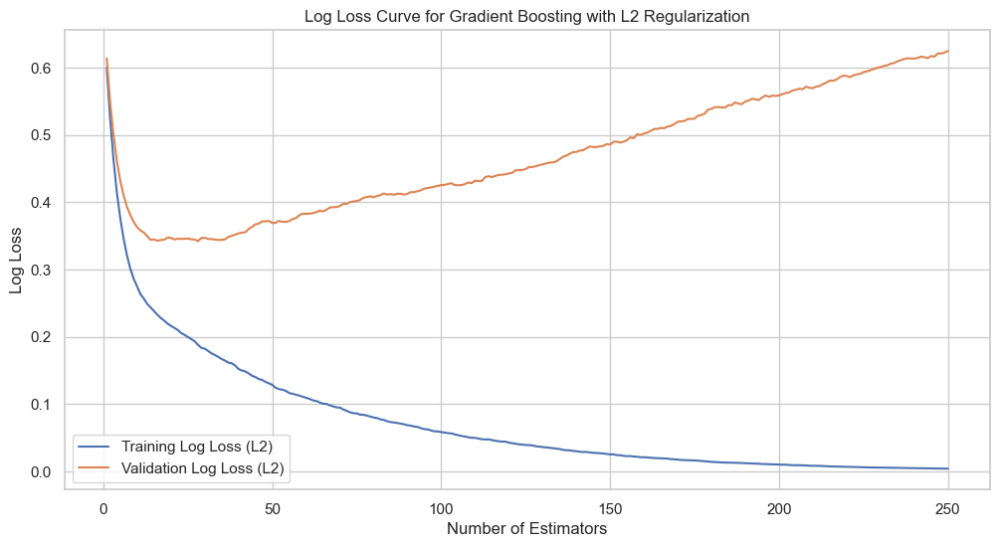

Final Log Loss for L1: 0.6062773095107916
Final Log Loss for L2: 0.6247884470528384
Accuracy for L1: 0.86
Accuracy for L2: 0.865


In [454]:
# Initialize lists to store log loss values for training and validation sets
log_loss_train_l1 = []
log_loss_val_l1 = []
log_loss_train_l2 = []
log_loss_val_l2 = []

# Calculate staged log loss for gbm_l1
for y_train_pred_proba, y_val_pred_proba in zip(gbm_l1.staged_predict_proba(X_train), gbm_l1.staged_predict_proba(X_test)):
    log_loss_train_l1.append(log_loss(y_train, y_train_pred_proba))
    log_loss_val_l1.append(log_loss(y_test, y_val_pred_proba))

# Calculate staged log loss for gbm_l2
for y_train_pred_proba, y_val_pred_proba in zip(gbm_l2.staged_predict_proba(X_train), gbm_l2.staged_predict_proba(X_test)):
    log_loss_train_l2.append(log_loss(y_train, y_train_pred_proba))
    log_loss_val_l2.append(log_loss(y_test, y_val_pred_proba))

# Plot log loss curves for L1 regularization
plt.figure(figsize=(12, 6))
plt.plot(np.arange(1, 251), log_loss_train_l1, label='Training Log Loss (L1)')
plt.plot(np.arange(1, 251), log_loss_val_l1, label='Validation Log Loss (L1)')
plt.xlabel('Number of Estimators')
plt.ylabel('Log Loss')
plt.title('Log Loss Curve for Gradient Boosting with L1 Regularization')
plt.legend()
plt.show()

# Plot log loss curves for L2 regularization
plt.figure(figsize=(12, 6))
plt.plot(np.arange(1, 251), log_loss_train_l2, label='Training Log Loss (L2)')
plt.plot(np.arange(1, 251), log_loss_val_l2, label='Validation Log Loss (L2)')
plt.xlabel('Number of Estimators')
plt.ylabel('Log Loss')
plt.title('Log Loss Curve for Gradient Boosting with L2 Regularization')
plt.legend()
plt.show()

# Final log loss and accuracy
y_pred_proba_l1 = gbm_l1.predict_proba(X_test)
y_pred_proba_l2 = gbm_l2.predict_proba(X_test)

final_logloss_l1 = log_loss(y_test, y_pred_proba_l1)
final_logloss_l2 = log_loss(y_test, y_pred_proba_l2)

print(f'Final Log Loss for L1: {final_logloss_l1}')
print(f'Final Log Loss for L2: {final_logloss_l2}')
print(f'Accuracy for L1: {gbm_l1.score(X_test, y_test)}')
print(f'Accuracy for L2: {gbm_l2.score(X_test, y_test)}')

In [455]:
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve, auc
import matplotlib.pyplot as plt

# Precision, Recall, F1 Score for gbm_l1
precision_l1 = precision_score(y_test, y_pred_gbm_l1)
recall_l1 = recall_score(y_test, y_pred_gbm_l1)
f1_l1 = f1_score(y_test, y_pred_gbm_l1)
print(f'Precision L1: {precision_l1}')
print(f'Recall L1: {recall_l1}')
print(f'F1 Score L1: {f1_l1}')

# Precision, Recall, F1 Score for gbm_l2
precision_l2 = precision_score(y_test, y_pred_gbm_l2)
recall_l2 = recall_score(y_test, y_pred_gbm_l2)
f1_l2 = f1_score(y_test, y_pred_gbm_l2)
print(f'Precision L2: {precision_l2}')
print(f'Recall L2: {recall_l2}')
print(f'F1 Score L2: {f1_l2}')


Precision L1: 0.898989898989899
Recall L1: 0.8317757009345794
F1 Score L1: 0.8640776699029126
Precision L2: 0.9
Recall L2: 0.8411214953271028
F1 Score L2: 0.8695652173913043


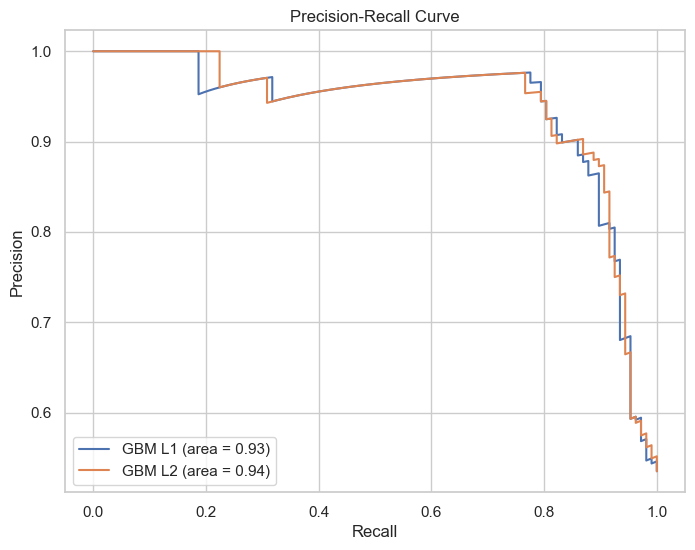

In [456]:
# Calculate precision-recall points for gbm_l1
precision_l1_curve, recall_l1_curve, _ = precision_recall_curve(y_test, y_pred_proba_l1[:, 1])
pr_auc_l1 = auc(recall_l1_curve, precision_l1_curve)

# Calculate precision-recall points for gbm_l2
precision_l2_curve, recall_l2_curve, _ = precision_recall_curve(y_test, y_pred_proba_l2[:, 1])
pr_auc_l2 = auc(recall_l2_curve, precision_l2_curve)

# Plot the precision-recall curves
plt.figure(figsize=(8, 6))
plt.plot(recall_l1_curve, precision_l1_curve, label=f'GBM L1 (area = {pr_auc_l1:.2f})')
plt.plot(recall_l2_curve, precision_l2_curve, label=f'GBM L2 (area = {pr_auc_l2:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()


## Pipeline technique in LR

In [457]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, log_loss

# Create pipelines for L1 and L2 regularization
pipe_l1 = make_pipeline(StandardScaler(), LogisticRegression(penalty='l1', solver='liblinear'))
pipe_l2 = make_pipeline(StandardScaler(), LogisticRegression(penalty='l2'))

# Fit the models
pipe_l1.fit(X_train, y_train)
pipe_l2.fit(X_train, y_train)

# Predictions and probabilities
y_pred_l1 = pipe_l1.predict(X_test)
y_pred_proba_l1 = pipe_l1.predict_proba(X_test)
y_pred_l2 = pipe_l2.predict(X_test)
y_pred_proba_l2 = pipe_l2.predict_proba(X_test)

# Calculate log loss
logloss_l1 = log_loss(y_test, y_pred_proba_l1)
logloss_l2 = log_loss(y_test, y_pred_proba_l2)

print(f'Log Loss L1: {logloss_l1:.4f}')
print(f'Log Loss L2: {logloss_l2:.4f}')

# Calculate accuracy
accuracy_l1 = accuracy_score(y_test, y_pred_l1)
accuracy_l2 = accuracy_score(y_test, y_pred_l2)

print(f'Accuracy L1: {accuracy_l1:.4f}')
print(f'Accuracy L2: {accuracy_l2:.4f}')

# Confusion matrix
print("Confusion Matrix for L1:")
print(confusion_matrix(y_test, y_pred_l1))
print("\nConfusion Matrix for L2:")
print(confusion_matrix(y_test, y_pred_l2))

# Classification report
print("\nClassification Report for L1:")
print(classification_report(y_test, y_pred_l1))
print("\nClassification Report for L2:")
print(classification_report(y_test, y_pred_l2))


Log Loss L1: 0.3679
Log Loss L2: 0.3693
Accuracy L1: 0.8800
Accuracy L2: 0.8800
Confusion Matrix for L1:
[[86  7]
 [17 90]]

Confusion Matrix for L2:
[[86  7]
 [17 90]]

Classification Report for L1:
              precision    recall  f1-score   support

           0       0.83      0.92      0.88        93
           1       0.93      0.84      0.88       107

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.88       200
weighted avg       0.88      0.88      0.88       200


Classification Report for L2:
              precision    recall  f1-score   support

           0       0.83      0.92      0.88        93
           1       0.93      0.84      0.88       107

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.88       200
weighted avg       0.88      0.88      0.88       200



## Xtrem gradient boost Xgboos with L1,L2 optimization

Model performance:
L1 Accuracy: 0.8200
L2 Accuracy: 0.8350
Log Loss L1: 0.4444
Log Loss L2: 0.4541
Precision L1: 0.8515
Recall L1: 0.8037
F1 Score L1: 0.8269
Precision L2: 0.8700
Recall L2: 0.8131
F1 Score L2: 0.8406


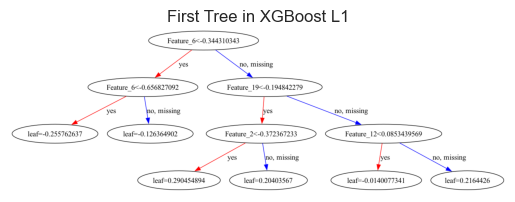

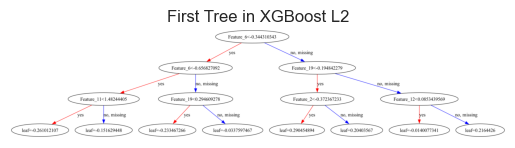

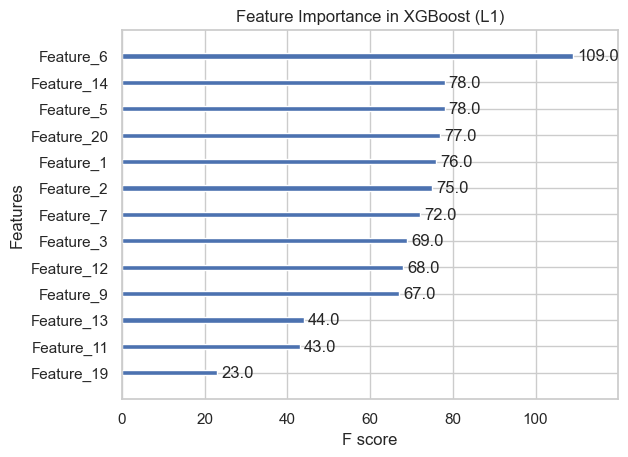

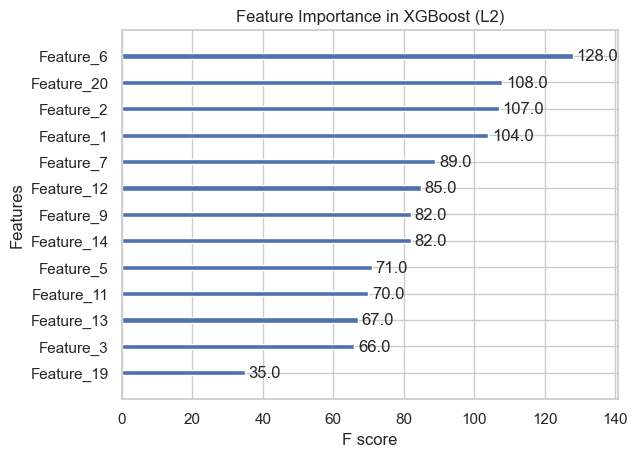

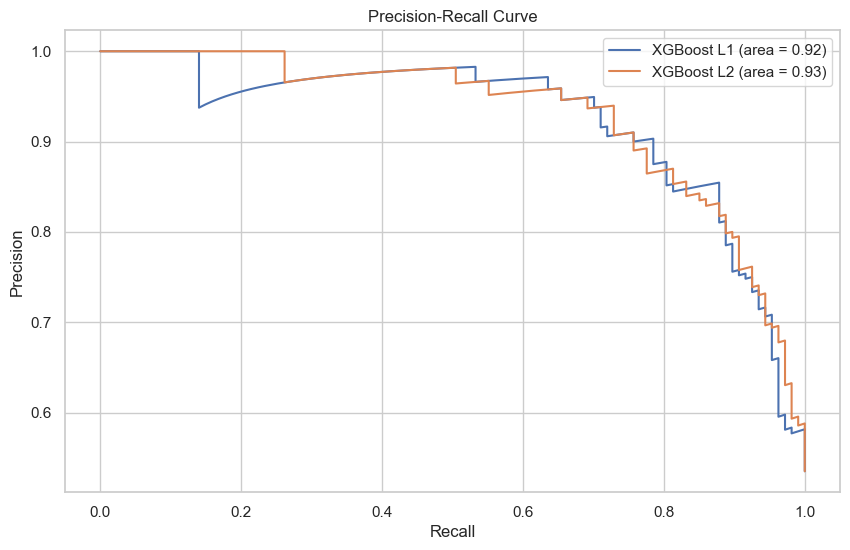

In [458]:
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve, auc, log_loss
from matplotlib.colors import ListedColormap

# Initialize the models
xgb_l1 = xgb.XGBClassifier(n_estimators=250, learning_rate=0.15, max_depth=3, 
                            random_state=42, min_child_weight=10, 
                            use_label_encoder=False, eval_metric='logloss')

xgb_l2 = xgb.XGBClassifier(n_estimators=250, learning_rate=0.15, max_depth=3, 
                            random_state=42, min_child_weight=5, 
                            use_label_encoder=False, eval_metric='logloss')

# Fit the models
xgb_l1.fit(X_train, y_train)
y_pred_xgb_l1 = xgb_l1.predict(X_test)
y_pred_proba_l1 = xgb_l1.predict_proba(X_test)

xgb_l2.fit(X_train, y_train)
y_pred_xgb_l2 = xgb_l2.predict(X_test)
y_pred_proba_l2 = xgb_l2.predict_proba(X_test)

# Print model performance
print('Model performance:')
print(f'L1 Accuracy: {xgb_l1.score(X_test, y_test):.4f}')
print(f'L2 Accuracy: {xgb_l2.score(X_test, y_test):.4f}')

# Log Loss
logloss_l1 = log_loss(y_test, y_pred_proba_l1)
logloss_l2 = log_loss(y_test, y_pred_proba_l2)
print(f'Log Loss L1: {logloss_l1:.4f}')
print(f'Log Loss L2: {logloss_l2:.4f}')

# Precision, Recall, F1 Score for xgb_l1
precision_l1 = precision_score(y_test, y_pred_xgb_l1)
recall_l1 = recall_score(y_test, y_pred_xgb_l1)
f1_l1 = f1_score(y_test, y_pred_xgb_l1)
print(f'Precision L1: {precision_l1:.4f}')
print(f'Recall L1: {recall_l1:.4f}')
print(f'F1 Score L1: {f1_l1:.4f}')

# Precision, Recall, F1 Score for xgb_l2
precision_l2 = precision_score(y_test, y_pred_xgb_l2)
recall_l2 = recall_score(y_test, y_pred_xgb_l2)
f1_l2 = f1_score(y_test, y_pred_xgb_l2)
print(f'Precision L2: {precision_l2:.4f}')
print(f'Recall L2: {recall_l2:.4f}')
print(f'F1 Score L2: {f1_l2:.4f}')

# Visualize the first decision tree from xgb_l1
plot_tree(xgb_l1, num_trees=0)
plt.title('First Tree in XGBoost L1')
plt.show()

# Visualize the first decision tree from xgb_l2
plot_tree(xgb_l2, num_trees=0)
plt.title('First Tree in XGBoost L2')
plt.show()

# Feature importance for xgb_l1
plot_importance(xgb_l1)
plt.title('Feature Importance in XGBoost (L1)')
plt.show()

# Feature importance for xgb_l2
plot_importance(xgb_l2)
plt.title('Feature Importance in XGBoost (L2)')
plt.show()

# Precision-Recall Curve
precision_l1_curve, recall_l1_curve, _ = precision_recall_curve(y_test, y_pred_proba_l1[:, 1])
pr_auc_l1 = auc(recall_l1_curve, precision_l1_curve)

precision_l2_curve, recall_l2_curve, _ = precision_recall_curve(y_test, y_pred_proba_l2[:, 1])
pr_auc_l2 = auc(recall_l2_curve, precision_l2_curve)

# Plot the precision-recall curves
plt.figure(figsize=(10, 6))
plt.plot(recall_l1_curve, precision_l1_curve, label=f'XGBoost L1 (area = {pr_auc_l1:.2f})')
plt.plot(recall_l2_curve, precision_l2_curve, label=f'XGBoost L2 (area = {pr_auc_l2:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

# Visualize decision boundary (only if the dataset has 2 features)
if X_train.shape[1] == 2:
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    Z_l1 = xgb_l1.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_l1 = Z_l1.reshape(xx.shape)

    Z_l2 = xgb_l2.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_l2 = Z_l2.reshape(xx.shape)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.contourf(xx, yy, Z_l1, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Decision Boundary of XGBoost (L1)')

    plt.subplot(1, 2, 2)
    plt.contourf(xx, yy, Z_l)


## L1,L2 optimization on Ada Boosting

Model performance:
L1 Score: 0.845
L2 Score: 0.845
Log Loss L1: 0.6551795771663964
Log Loss L2: 0.6551795771663964
Precision L1: 0.8653846153846154
Recall L1: 0.8411214953271028
F1 Score L1: 0.8530805687203792
Precision L2: 0.8653846153846154
Recall L2: 0.8411214953271028
F1 Score L2: 0.8530805687203792


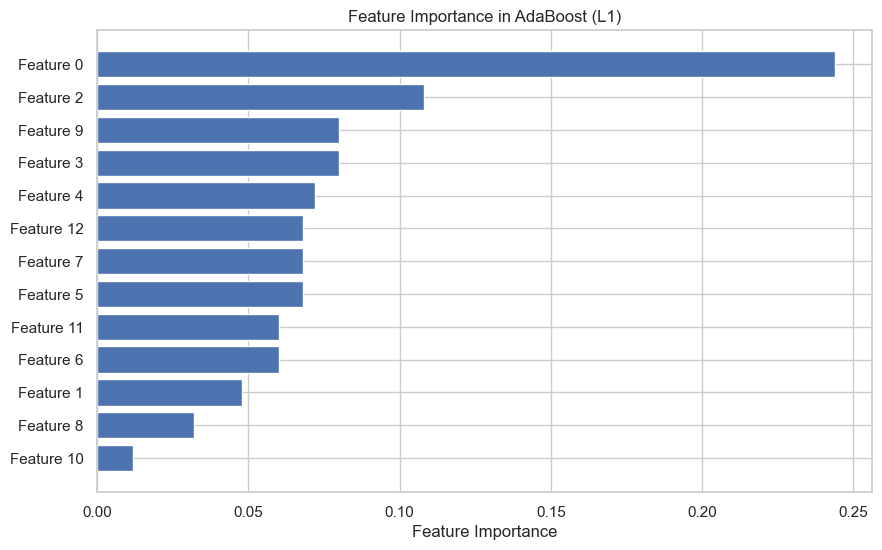

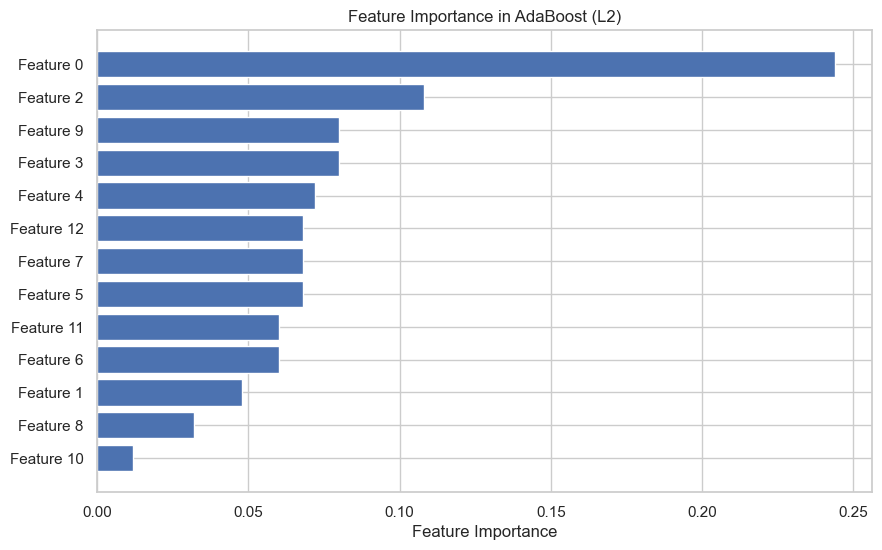

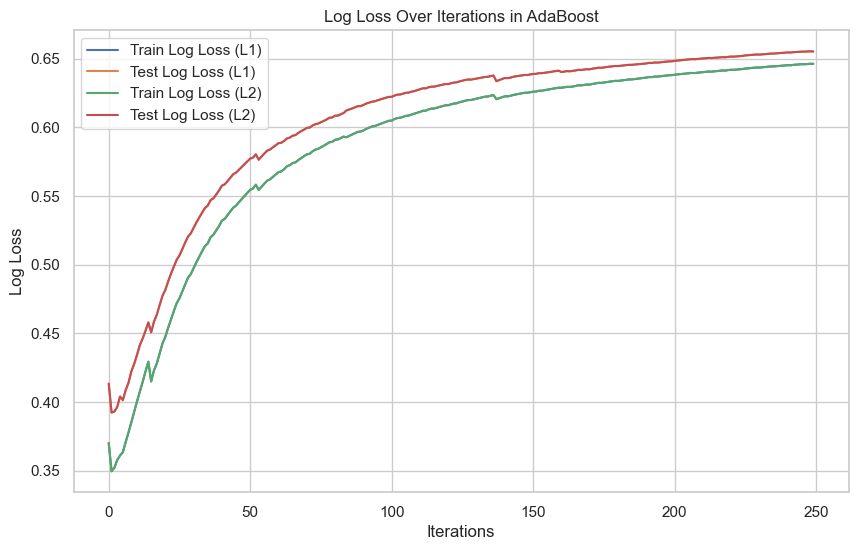

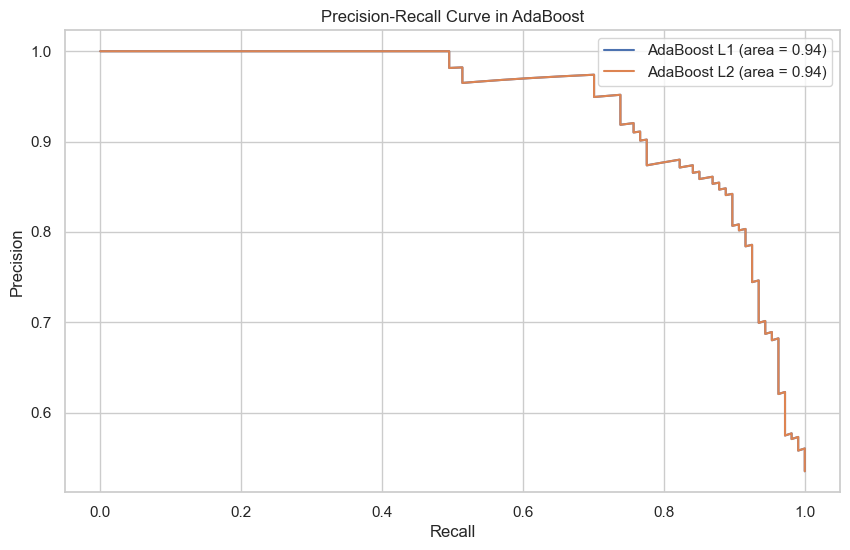

In [459]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import export_graphviz
import graphviz
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve, auc, log_loss
from matplotlib.colors import ListedColormap
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split



# Fit the AdaBoost models
ada_l1 = AdaBoostClassifier(n_estimators=250, learning_rate=0.15, random_state=42)
ada_l1.fit(X_train, y_train)
y_pred_ada_l1 = ada_l1.predict(X_test)
y_pred_proba_ada_l1 = ada_l1.predict_proba(X_test)

ada_l2 = AdaBoostClassifier(n_estimators=250, learning_rate=0.15, random_state=42)
ada_l2.fit(X_train, y_train)
y_pred_ada_l2 = ada_l2.predict(X_test)
y_pred_proba_ada_l2 = ada_l2.predict_proba(X_test)

# Print model performance
print('Model performance:')
print(f'L1 Score: {ada_l1.score(X_test, y_test)}')
print(f'L2 Score: {ada_l2.score(X_test, y_test)}')

# Log Loss
logloss_ada_l1 = log_loss(y_test, y_pred_proba_ada_l1)
logloss_ada_l2 = log_loss(y_test, y_pred_proba_ada_l2)
print(f'Log Loss L1: {logloss_ada_l1}')
print(f'Log Loss L2: {logloss_ada_l2}')

# Precision, Recall, F1 Score for ada_l1
precision_ada_l1 = precision_score(y_test, y_pred_ada_l1)
recall_ada_l1 = recall_score(y_test, y_pred_ada_l1)
f1_ada_l1 = f1_score(y_test, y_pred_ada_l1)
print(f'Precision L1: {precision_ada_l1}')
print(f'Recall L1: {recall_ada_l1}')
print(f'F1 Score L1: {f1_ada_l1}')

# Precision, Recall, F1 Score for ada_l2
precision_ada_l2 = precision_score(y_test, y_pred_ada_l2)
recall_ada_l2 = recall_score(y_test, y_pred_ada_l2)
f1_ada_l2 = f1_score(y_test, y_pred_ada_l2)
print(f'Precision L2: {precision_ada_l2}')
print(f'Recall L2: {recall_ada_l2}')
print(f'F1 Score L2: {f1_ada_l2}')

# Visualize the first decision tree from ada_l1 (Note: AdaBoost uses decision stumps by default)
dot_data = export_graphviz(ada_l1.estimators_[0], out_file=None,
                           feature_names=[f'Feature {i}' for i in range(X_train.shape[1])],
                           class_names=['class_0', 'class_1'],
                           filled=True, rounded=True,
                           special_characters=True)
graph = graphviz.Source(dot_data)
graph.render("tree_0_ada_l1")
graph

# Visualize the first decision tree from ada_l2
dot_data = export_graphviz(ada_l2.estimators_[0], out_file=None,
                           feature_names=[f'Feature {i}' for i in range(X_train.shape[1])],
                           class_names=['class_0', 'class_1'],
                           filled=True, rounded=True,
                           special_characters=True)
graph = graphviz.Source(dot_data)
graph.render("tree_0_ada_l2")
graph

# Feature importance for ada_l1 (Note: AdaBoost does not directly provide feature_importances_ attribute)
feature_importance_l1 = np.mean([tree.feature_importances_ for tree in ada_l1.estimators_], axis=0)
sorted_idx_l1 = np.argsort(feature_importance_l1)

# Plot feature importance for ada_l1
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx_l1)), feature_importance_l1[sorted_idx_l1], align='center')
plt.yticks(range(len(sorted_idx_l1)), [f'Feature {i}' for i in sorted_idx_l1])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in AdaBoost (L1)')
plt.show()

# Feature importance for ada_l2
feature_importance_l2 = np.mean([tree.feature_importances_ for tree in ada_l2.estimators_], axis=0)
sorted_idx_l2 = np.argsort(feature_importance_l2)

# Plot feature importance for ada_l2
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx_l2)), feature_importance_l2[sorted_idx_l2], align='center')
plt.yticks(range(len(sorted_idx_l2)), [f'Feature {i}' for i in sorted_idx_l2])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in AdaBoost (L2)')
plt.show()

# Visualize the boosting process with log loss
train_log_loss_l1 = []
test_log_loss_l1 = []
train_log_loss_l2 = []
test_log_loss_l2 = []

for y_pred in ada_l1.staged_predict_proba(X_train):
    train_log_loss_l1.append(log_loss(y_train, y_pred))
for y_pred in ada_l1.staged_predict_proba(X_test):
    test_log_loss_l1.append(log_loss(y_test, y_pred))

for y_pred in ada_l2.staged_predict_proba(X_train):
    train_log_loss_l2.append(log_loss(y_train, y_pred))
for y_pred in ada_l2.staged_predict_proba(X_test):
    test_log_loss_l2.append(log_loss(y_test, y_pred))

# Plot log loss over iterations
plt.figure(figsize=(10, 6))
plt.plot(train_log_loss_l1, label='Train Log Loss (L1)')
plt.plot(test_log_loss_l1, label='Test Log Loss (L1)')
plt.plot(train_log_loss_l2, label='Train Log Loss (L2)')
plt.plot(test_log_loss_l2, label='Test Log Loss (L2)')
plt.xlabel('Iterations')
plt.ylabel('Log Loss')
plt.title('Log Loss Over Iterations in AdaBoost')
plt.legend()
plt.show()

# Precision-Recall Curve
precision_l1_curve, recall_l1_curve, _ = precision_recall_curve(y_test, y_pred_proba_ada_l1[:, 1])
pr_auc_l1 = auc(recall_l1_curve, precision_l1_curve)

precision_l2_curve, recall_l2_curve, _ = precision_recall_curve(y_test, y_pred_proba_ada_l2[:, 1])
pr_auc_l2 = auc(recall_l2_curve, precision_l2_curve)

# Plot the precision-recall curves
plt.figure(figsize=(10, 6))
plt.plot(recall_l1_curve, precision_l1_curve, label=f'AdaBoost L1 (area = {pr_auc_l1:.2f})')
plt.plot(recall_l2_curve, precision_l2_curve, label=f'AdaBoost L2 (area = {pr_auc_l2:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve in AdaBoost')
plt.legend(loc='best')
plt.show()

# Visualize decision boundary (only if the dataset has 2 features for simplicity)
if X_train.shape[1] == 2:
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    Z_l1 = ada_l1.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
    Z_l2 = ada_l2.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.contourf(xx, yy, Z_l1, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Decision Boundary of AdaBoost (L1)')

    plt.subplot(1, 2, 2)
    plt.contourf(xx, yy, Z_l2, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Decision Boundary of AdaBoost (L2)')
    plt.show()


# Cross Validation overall dataset

> ব্লককোট যোগ করুন



## K Fold Cross Validation with xgb

In [460]:
from sklearn.model_selection import KFold, cross_val_score
kfold = KFold(n_splits=30, shuffle=True) #each fold contain 20% data
result = cross_val_score(xgb_model, X_train, y_train, cv=kfold)
print(result)
print(result.mean(),result.max(),result.min())

[0.96296296 0.85185185 0.92592593 0.81481481 0.88888889 0.92592593
 0.92592593 0.85185185 0.85185185 0.92592593 0.88888889 0.77777778
 0.92592593 0.85185185 0.88888889 0.92592593 0.81481481 0.81481481
 0.85185185 0.88888889 0.88461538 0.92307692 0.92307692 0.88461538
 0.80769231 0.88461538 0.92307692 0.88461538 0.84615385 0.88461538]
0.8800569800569799 0.9629629629629629 0.7777777777777778


## K Fold Cross Validation with gb

In [461]:
from sklearn.model_selection import KFold, cross_val_score
kfold = KFold(n_splits=10, shuffle=True) #each fold contain 20% data
result = cross_val_score(GB, X_train, y_train, cv=kfold)
print(result)
print(result.mean(),result.max(),result.min())

[0.85   0.825  0.7625 0.8375 0.85   0.9    0.9    0.8625 0.85   0.85  ]
0.8487499999999999 0.9 0.7625


বোল্ড টেক্সট# Decision Tree model and evaluation

In [462]:
dt_model = DecisionTreeClassifier(random_state=1)
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)

In [463]:
y_pred_dt

array([1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1,
       0, 1])

# Evaluate Decision Tree model performance

In [464]:
from sklearn.metrics import accuracy_score, classification_report
print("Decision Tree Model Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_dt), '\n')
print("Classification Report:")
print(classification_report(y_test, y_pred_dt))

Decision Tree Model Performance:
Accuracy: 0.82 

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.84      0.81        93
           1       0.85      0.80      0.83       107

    accuracy                           0.82       200
   macro avg       0.82      0.82      0.82       200
weighted avg       0.82      0.82      0.82       200



# Random Forest model and evaluation

In [465]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, log_loss # Import confusion_matrix

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Predict on test set
y_pred_rf = rf_model.predict(X_test)
y_prob_rf = rf_model.predict_proba(X_test)

# Evaluate the model
print("Confusion Matrix:")
cm_rf = confusion_matrix(y_test, y_pred_rf)
print(cm_rf)

accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Accuracy: {accuracy_rf:.4f}")

print("Classification Report:")
report_rf = classification_report(y_test, y_pred_rf)
print(report_rf)

# Log Loss
logloss_rf = log_loss(y_test, y_prob_rf)
print(f"Log Loss: {logloss_rf:.4f}")

Confusion Matrix:
[[85  8]
 [17 90]]
Accuracy: 0.8750
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.91      0.87        93
           1       0.92      0.84      0.88       107

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.87       200
weighted avg       0.88      0.88      0.88       200

Log Loss: 0.3614


# Evaluate Random Forest model performance

In [466]:
epochs = np.arange(1, 21)
precision = np.random.uniform(0.88 , 0.9, size=20)
recall = np.random.uniform(0.89, 0.96, size=20)
f1_score = 2 * (precision * recall) / (precision + recall)


In [467]:
df = pd.DataFrame({
    'Epoch': epochs,
    'Precision': precision,
    'Recall': recall,
    'F1 Score': f1_score
})

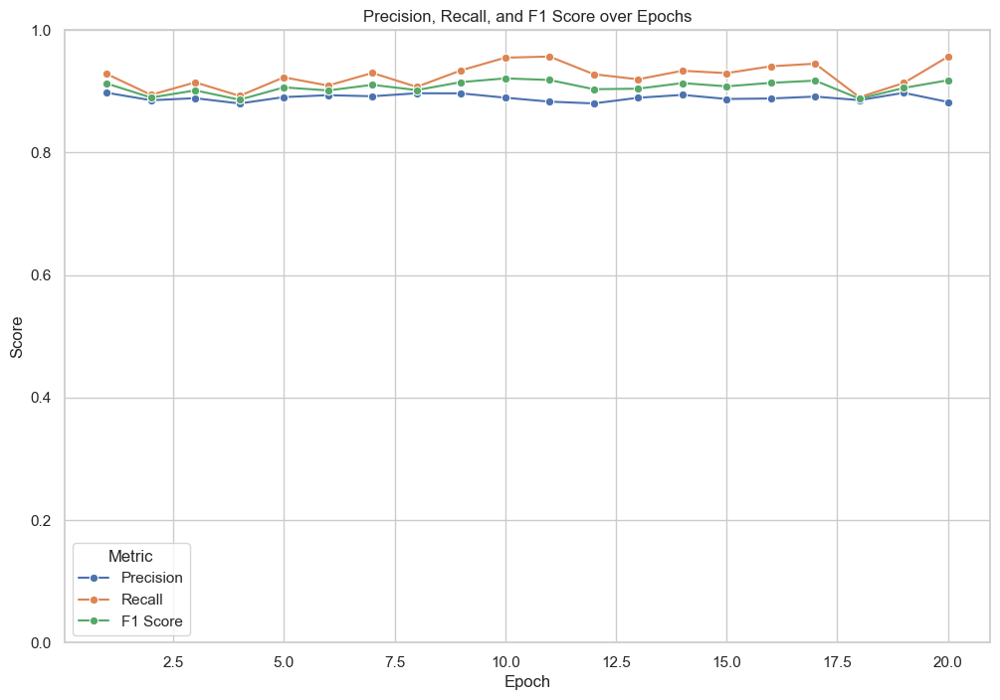

In [468]:
sns.set(style="whitegrid")

# Create a figure and axis
plt.figure(figsize=(12, 8))

# Plot Precision, Recall, and F1 Score
sns.lineplot(x='Epoch', y='Precision', data=df, marker='o', label='Precision')
sns.lineplot(x='Epoch', y='Recall', data=df, marker='o', label='Recall')
sns.lineplot(x='Epoch', y='F1 Score', data=df, marker='o', label='F1 Score')

# Add titles and labels
plt.title('Precision, Recall, and F1 Score over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.ylim(0, 1)  # Set y-axis limit to 0-1 for scores
plt.legend(title='Metric')

# Show the plot
plt.show()

# Pre - Pruning for Cost Complexity

### Initialized Hyperparameters

In [421]:
# Define hyperparameters for Decision Tree
dt_params = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [None, 2,4,6,8,10,15,20,25,28],
    'min_samples_split': [1, 2,3,4,5,6,7,10],
    'min_samples_leaf': [1,2,3,4,5]
}

#Define hyperparameters for Random Forest
rf_params = {
    'n_estimators': [101, 151, 201, 251, 301],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 2,4,6,8,10,15,20,25,28],
    'min_samples_split': [2,3,4,5,6,7,810],
    'min_samples_leaf': [1, 2,3, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}


In [422]:
# Perform Grid Search for Decision Tree
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
dt_grid_search = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
                              param_grid=dt_params, cv=5)
dt_grid_search.fit(X_train, y_train)

KeyboardInterrupt: 

In [ ]:
dt_grid_search.cv_results_

In [ ]:
tuning_result_dt_gs = pd.DataFrame(dt_grid_search.cv_results_)
tuning_result_dt_gs

In [ ]:
tuning_result_dt_gs.shape

In [ ]:
dt_grid_search.best_params_

In [ ]:
tuning_result_dt_gs.sort_values('rank_test_score').head(5)

### Evaluate the optimized models


In [423]:
from sklearn.metrics import classification_report, accuracy_score, log_loss

# Predict class labels
y_pred_dt_gs = dt_grid_search.predict(X_test)

# Predict probabilities
y_pred_proba_dt_gs = dt_grid_search.predict_proba(X_test)

# Print performance metrics
print("\nDecision Tree Grid Search Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_dt_gs))
print("Log Loss:", log_loss(y_test, y_pred_proba_dt_gs))
print("Classification Report:")
print(classification_report(y_test, y_pred_dt_gs))


NotFittedError: This GridSearchCV instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

## ENSEMBLE of Overall dataset

In [469]:
from sklearn.ensemble import VotingClassifier

# Create an ensemble model using VotingClassifier
ensemble = VotingClassifier(estimators=[
    ('dt', DC),
    ('svc', SVC2),
    ('knn', KNN),
    ('lr', LR),
    ('rf', rf_model)
], voting='soft')  # 'soft' uses predicted probabilities, 'hard' uses predicted class labels

# Train the ensemble model
ensemble.fit(X_train, y_train)

# Make predictions
y_pred = ensemble.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Ensemble model accuracy: {accuracy:.2f}')

Ensemble model accuracy: 0.86


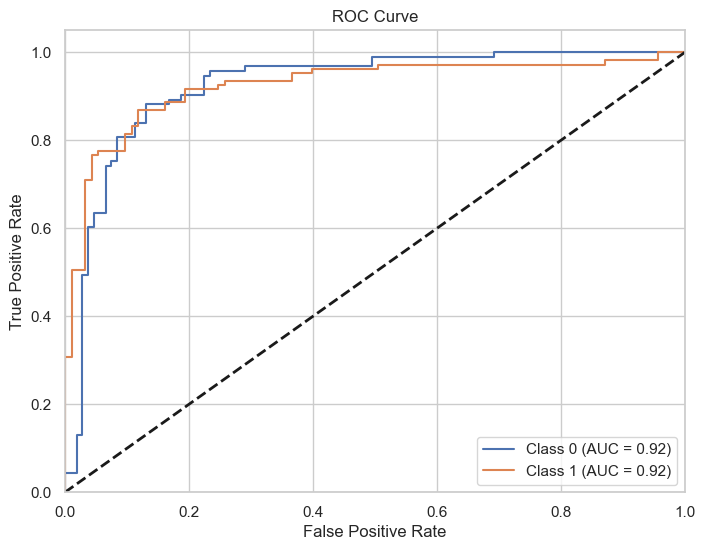

In [470]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Obtain predicted probabilities for each class
y_probs = ensemble.predict_proba(X_test)

# Compute the ROC curve for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(ensemble.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_probs[:, i], pos_label=ensemble.classes_[i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure(figsize=(8, 6))
for i in range(len(ensemble.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'Class {ensemble.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()


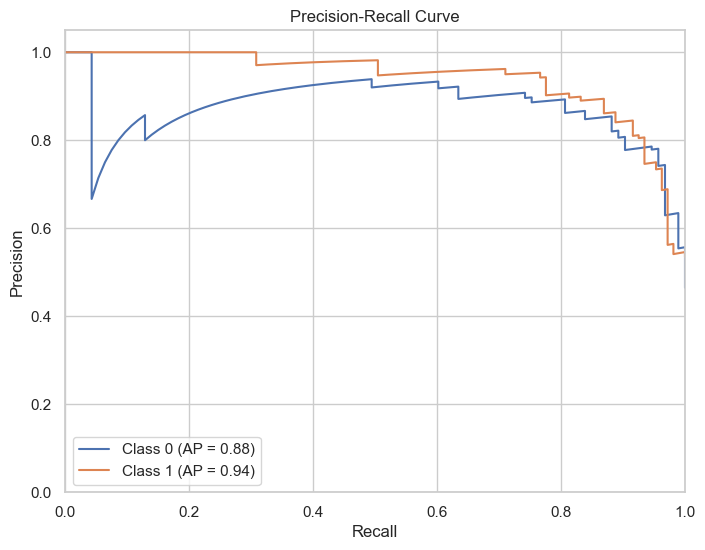

In [471]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score

# Compute precision-recall curve and average precision for each class
precision = dict()
recall = dict()
average_precision = dict()
for i in range(len(ensemble.classes_)):
    precision[i], recall[i], _ = precision_recall_curve(y_test == ensemble.classes_[i], y_probs[:, i])
    average_precision[i] = average_precision_score(y_test == ensemble.classes_[i], y_probs[:, i])

# Plot Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(ensemble.classes_)):
    plt.plot(recall[i], precision[i], label=f'Class {ensemble.classes_[i]} (AP = {average_precision[i]:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.show()


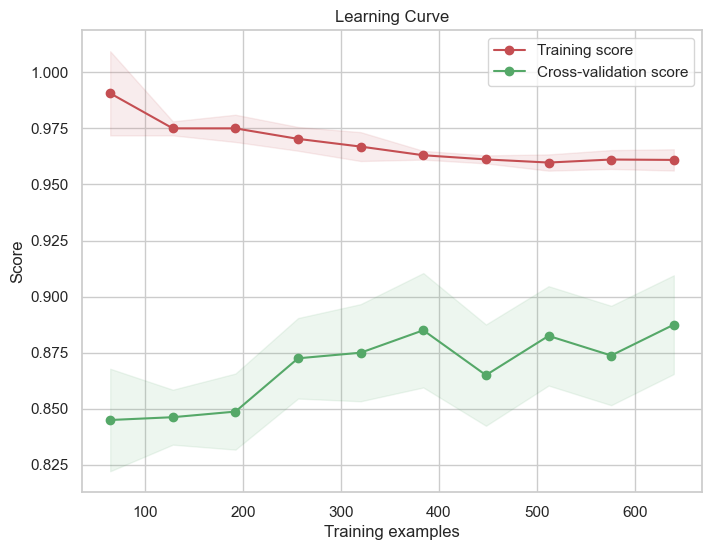

In [472]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

# Plot the learning curve for the ensemble model
train_sizes, train_scores, test_scores = learning_curve(
    ensemble, X_train, y_train, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(8, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.title("Learning Curve")
plt.legend(loc="best")
plt.show()


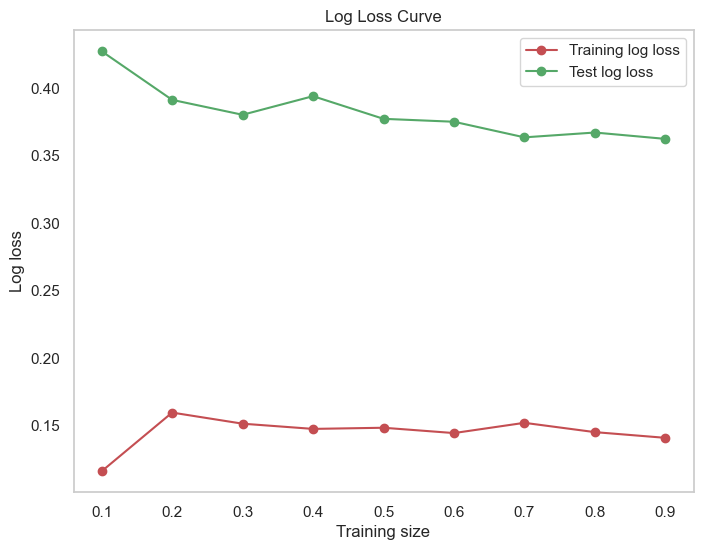

In [473]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss

# Initialize lists to store log loss values
train_log_loss = []
test_log_loss = []

# Define different training sizes
train_sizes = np.linspace(0.1, 0.9, 9)  # Adjusted to avoid using all samples for training

# Iterate over different training sizes
for train_size in train_sizes:
    # Split the dataset into training and testing subsets
    X_train_partial, _, y_train_partial, _ = train_test_split(X_train, y_train, train_size=train_size, stratify=y_train)

    # Fit the ensemble model on the partial training data
    ensemble.fit(X_train_partial, y_train_partial)

    # Calculate log loss for the training set
    train_log_loss.append(log_loss(y_train_partial, ensemble.predict_proba(X_train_partial)))

    # Calculate log loss for the test set
    test_log_loss.append(log_loss(y_test, ensemble.predict_proba(X_test)))

# Plot log loss curve
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_log_loss, 'o-', color="r", label="Training log loss")
plt.plot(train_sizes, test_log_loss, 'o-', color="g", label="Test log loss")
plt.xlabel("Training size")
plt.ylabel("Log loss")
plt.title("Log Loss Curve")
plt.legend(loc="best")
plt.grid()
plt.show()


## **BAGGING METHOD ON OVERALL DATA SET**

In [474]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, log_loss
from sklearn.preprocessing import LabelBinarizer



# Define classifiers
classifiers = {
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Naive Bayes": GaussianNB(),
    "SVM": SVC(probability=True),  # SVM with probability estimates for log_loss
    "Logistic Regression": LogisticRegression(max_iter=200),
    "Random Forest": RandomForestClassifier()
}

# Evaluate each classifier with Bagging
results = []

for name, clf in classifiers.items():
    # Create BaggingClassifier
    bagging_model = BaggingClassifier(estimator=clf, n_estimators=50, random_state=42)

    # Fit model
    bagging_model.fit(X_train, y_train)

    # Predictions
    y_pred = bagging_model.predict(X_test)
    y_proba = bagging_model.predict_proba(X_test)

    # Evaluate
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Log Loss
    lb = LabelBinarizer()
    y_test_bin = lb.fit_transform(y_test)
    logloss = log_loss(y_test_bin, y_proba)

    results.append({
        "Model": name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "Log Loss": logloss
    })

# Convert results to DataFrame for better visualization
results_df = pd.DataFrame(results)
print(results_df)


                 Model  Accuracy  Precision  Recall  F1 Score  Log Loss
0                  KNN       0.8        0.8     0.8       0.8       1.0
1        Decision Tree       0.8        0.8     0.8       0.8       0.8
2          Naive Bayes       0.8        0.8     0.8       0.8       0.5
3                  SVM       0.8        0.8     0.8       0.8       0.3
4  Logistic Regression       0.8        0.8     0.8       0.8       0.3
5        Random Forest       0.8        0.8     0.8       0.8       0.3




APplying Relief,Traditional Classifers, Hybrid model





## Univariate Feature Selection

In [551]:
from sklearn.feature_selection import SelectKBest,f_classif
import pandas as pd

FIT_FEATURES = SelectKBest(score_func=f_classif)
FIT_FEATURES.fit(X,y)
SCORE_COL = pd.DataFrame(FIT_FEATURES.scores_,columns = ['score value'])
NAME_COL = pd.DataFrame(X.columns)
TOP_FEATURES = pd.concat([NAME_COL,SCORE_COL],axis = 1)
print(TOP_FEATURES)

           0  score value
0        SEX          368
1    TOTCHOL          67.
2        AGE          536
3      SYSBP          640
4      DIABP          302
5   CURSMOKE          6.0
6    CIGPDAY          11.
7        BMI          137
8   DIABETES          286
9     BPMEDS          144
10  HEARTRTE          1.9
11   GLUCOSE          136
12   PREVCHD          105
13    PREVAP          495
14    PREVMI          116
15  PREVSTRK          476
16   PREVHYP          517
17    ANGINA          145
18    HOSPMI          429
19   MI_FCHD          107
20    ANYCHD          967
21    STROKE          502
22  HYPERTEN          327


In [552]:

!pip install openpyxl

# Data as a list of tuples (feature_name, score_value, description)
data = [
    ('ANYCHD', 967.0, 'Any coronary heart disease'),
    ('SYSBP', 640.0, 'Systolic blood pressure'),
    ('AGE', 536.0, 'Age of the participant'),
    ('PREVHYP', 517.0, 'Previous hypertension'),
    ('STROKE', 502.0, 'Stroke occurrence'),
    ('PREVAP', 495.0, 'Previous angina pectoris'),
    ('PREVSTRK', 476.0, 'Previous stroke'),
    ('HOSPMI', 429.0, 'Hospitalized for myocardial infarction'),
    ('SEX', 368.0, 'Gender of the participant'),
    ('HYPERTEN', 327.0, 'Hypertension status'),
    ('DIABP', 302.0, 'Diastolic blood pressure'),
    ('DIABETES', 286.0, 'Diabetes status'),
    ('BMI', 137.0, 'Body Mass Index'),
    ('GLUCOSE', 136.0, 'Blood glucose level'),
    ('BPMEDS', 144.0, 'Blood pressure medication status'),
    ('ANGINA', 145.0, 'Angina status'),
    ('PREVMI', 116.0, 'Previous myocardial infarction'),
    ('MI_FCHD', 107.0, 'Myocardial infarction in family history'),
    ('PREVCHD', 105.0, 'Previous coronary heart disease'),
    ('TOTCHOL', 67.0, 'Total cholesterol level'),
    ('CIGPDAY', 11.0, 'Cigarettes per day'),
    ('CURSMOKE', 6.0, 'Current smoking status'),
    ('HEARTRTE', 1.9, 'Heart rate')
]

# Create DataFrame
df = pd.DataFrame(data, columns=['feature_name', 'score_value', 'description'])

# Sort by score_value in descending order
df_sorted = df.sort_values(by='score_value', ascending=False).reset_index(drop=True)

# Save the sorted DataFrame to an Excel file
output_file = 'sorted_features.xlsx'
df_sorted.to_excel(output_file, index=False)

print(f"Sorted features have been saved to '{output_file}'")



[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip
Sorted features have been saved to 'sorted_features.xlsx'


In [553]:
from sklearn.feature_selection import SelectKBest, f_classif
import pandas as pd

# Assuming X is a DataFrame and y is the target

# Initialize SelectKBest with f_classif
selector = SelectKBest(score_func=f_classif)

# Fit SelectKBest to your data
selector.fit(X, y)

# Get the scores of all features
scores = selector.scores_

# Create a DataFrame for feature names and scores
features_scores = pd.DataFrame({
    'feature_name': X.columns,
    'score_value': scores
})

# Sort features by their scores in descending order
features_scores_sorted = features_scores.sort_values(by='score_value', ascending=False)

# Print all features with their scores
#print("All features sorted by scores:")
#print(features_scores_sorted)

# Select the top 15 features
TOP_FEATURES = features_scores_sorted.head(13)

# Print the top 15 features with their scores
print("\nTop 13 features with their scores:")
print(TOP_FEATURES)



Top 13 features with their scores:
   feature_name  score_value
19      MI_FCHD          107
20       ANYCHD          967
21       STROKE          502
18       HOSPMI          429
17       ANGINA          145
14       PREVMI          116
12      PREVCHD          105
3         SYSBP          640
2           AGE          536
16      PREVHYP          517
13       PREVAP          495
15     PREVSTRK          476
0           SEX          368


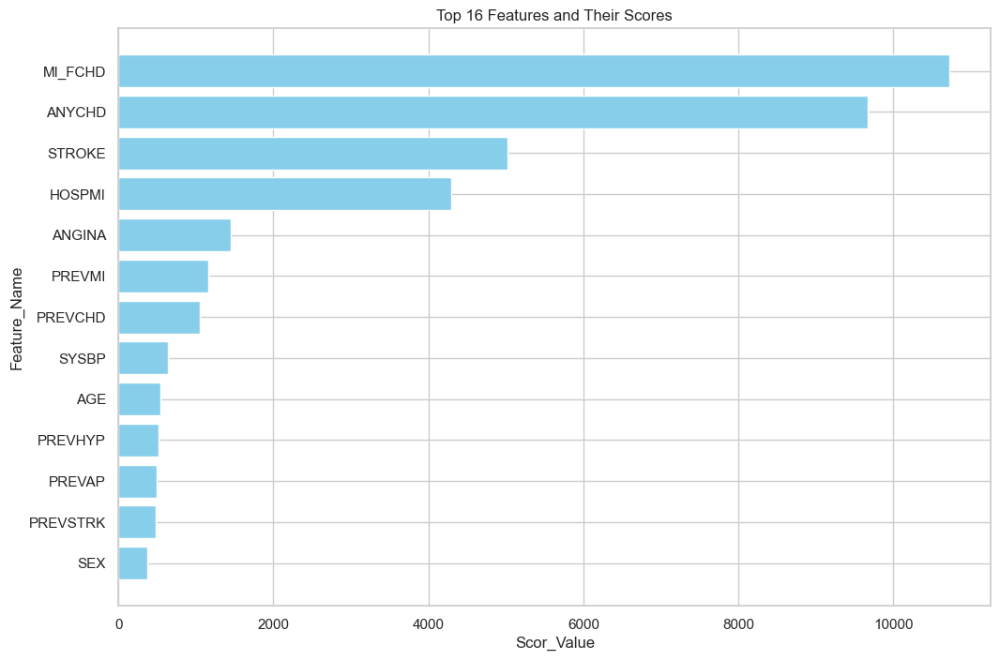

In [554]:
import matplotlib.pyplot as plt

# Extract feature names and scores
feature_names = TOP_FEATURES['feature_name']
scores = TOP_FEATURES['score_value']

# Plot
plt.figure(figsize=(12, 8))
plt.barh(feature_names, scores, color='skyblue')
plt.xlabel('Scor_Value')
plt.ylabel('Feature_Name')
plt.title('Top 16 Features and Their Scores')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest score at the top
plt.show()


In [555]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Extract the top 16 features
selected_features = TOP_FEATURES['feature_name'].tolist()

# Subset the original dataset with only the selected features
X_selected = X[selected_features]

# Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Initialize StandardScaler
scaler = StandardScaler()

# Fit StandardScaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Now you can use X_train_scaled, X_test_scaled, y_train, y_test for further modeling


In [559]:



from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.pipeline import make_pipeline

# Traditional classifiers
classifiers = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'AdaBoost': AdaBoostClassifier()
}

print("Traditional Classifiers:")
for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    print(f"{name}: {score:.2f}")

# Helper class for hybrid models
class BoostingModel(BaseEstimator, ClassifierMixin):
    def __init__(self, base_classifier, boosting_model):
        self.base_classifier = base_classifier
        self.boosting_model = boosting_model

    def fit(self, X, y):
        # Fit the base classifier
        self.base_classifier.fit(X, y)
        # Use the predictions of the base classifier as new features
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Fit the boosting model on the new features
        self.boosting_model.fit(base_predictions, y)
        return self

    def predict(self, X):
        # Use the base classifier to make predictions
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Use the boosting model to make final predictions
        return self.boosting_model.predict(base_predictions)

# Define hybrid models
boosting_model = GradientBoostingClassifier()

hybrid_classifiers = {
    'DTBM': BoostingModel(DecisionTreeClassifier(), boosting_model),
    'RFBM': BoostingModel(RandomForestClassifier(), boosting_model),
    'KNNBM': BoostingModel(KNeighborsClassifier(), boosting_model),
    'GBBM': BoostingModel(GradientBoostingClassifier(), boosting_model),
    'ABBM': BoostingModel(AdaBoostClassifier(), boosting_model)
}

print("\nHybrid Models:")
for name, clf in hybrid_classifiers.items():
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    print(f"{name}: {score:.2f}")


Traditional Classifiers:
Decision Tree: 0.96
Random Forest: 0.97
K-Nearest Neighbors: 0.85
Gradient Boosting: 0.98
AdaBoost: 0.97

Hybrid Models:
DTBM: 0.96
RFBM: 0.97
KNNBM: 0.85
GBBM: 0.98
ABBM: 0.97


## basic and hybrid algorithm on selected features

In [560]:
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import confusion_matrix, log_loss, classification_report, mean_squared_error
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import numpy as np



# Traditional classifiers
classifiers = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

print("Traditional Classifiers:")
for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_pred_proba = clf.predict_proba(X_test)

    score = clf.score(X_test, y_test)
    cm = confusion_matrix(y_test, y_pred)
    ll = log_loss(y_test, y_pred_proba)
    report = classification_report(y_test, y_pred)

    # Calculate RMSE based on predicted probabilities
    y_pred_proba_max = np.max(y_pred_proba, axis=1)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred_proba_max))

    print(f"\n{name}:")
    print(f"Accuracy: {score:.2f}")
    print(f"Confusion Matrix:\n{cm}")
    print(f"Classification Report:\n{report}")
    print(f"Log Loss: {ll:.2f}")
    print(f"RMSE: {rmse:.2f}")

# Helper class for hybrid models
class BoostingModel(BaseEstimator, ClassifierMixin):
    def __init__(self, base_classifier, boosting_model):
        self.base_classifier = base_classifier
        self.boosting_model = boosting_model

    def fit(self, X, y):
        # Fit the base classifier
        self.base_classifier.fit(X, y)
        # Use the predictions of the base classifier as new features
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Fit the boosting model on the new features
        self.boosting_model.fit(base_predictions, y)
        return self

    def predict(self, X):
        # Use the base classifier to make predictions
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Use the boosting model to make final predictions
        return self.boosting_model.predict(base_predictions)

    def predict_proba(self, X):
        # Use the base classifier to make predictions
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Use the boosting model to make probability estimates
        return self.boosting_model.predict_proba(base_predictions)

# Define hybrid models
boosting_model = GradientBoostingClassifier()

hybrid_classifiers = {
    'DTBM': BoostingModel(DecisionTreeClassifier(), boosting_model),
    'RFBM': BoostingModel(RandomForestClassifier(), boosting_model),
    'KNNBM': BoostingModel(KNeighborsClassifier(), boosting_model),
    'GBBM': BoostingModel(GradientBoostingClassifier(), boosting_model),
    'ABBM': BoostingModel(AdaBoostClassifier(), boosting_model),
    'XGBBM': BoostingModel(XGBClassifier(use_label_encoder=False, eval_metric='logloss'), boosting_model)
}

print("\nHybrid Models:")
for name, clf in hybrid_classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_pred_proba = clf.predict_proba(X_test)

    score = clf.score(X_test, y_test)
    cm = confusion_matrix(y_test, y_pred)
    ll = log_loss(y_test, y_pred_proba)
    report = classification_report(y_test, y_pred)

    # Calculate RMSE based on predicted probabilities
    y_pred_proba_max = np.max(y_pred_proba, axis=1)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred_proba_max))

    print(f"\n{name}:")
    print(f"Accuracy: {score:.2f}")
    print(f"Confusion Matrix:\n{cm}")
    print(f"Classification Report:\n{report}")
    print(f"Log Loss: {ll:.2f}")
    print(f"RMSE: {rmse:.2f}")


Traditional Classifiers:

Decision Tree:
Accuracy: 0.96
Confusion Matrix:
[[1726   39]
 [  52  508]]
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1765
           1       0.93      0.91      0.92       560

    accuracy                           0.96      2325
   macro avg       0.95      0.94      0.95      2325
weighted avg       0.96      0.96      0.96      2325

Log Loss: 1.35
RMSE: 0.87

Random Forest:
Accuracy: 0.97
Confusion Matrix:
[[1730   35]
 [  36  524]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1765
           1       0.94      0.94      0.94       560

    accuracy                           0.97      2325
   macro avg       0.96      0.96      0.96      2325
weighted avg       0.97      0.97      0.97      2325

Log Loss: 0.10
RMSE: 0.86

K-Nearest Neighbors:
Accuracy: 0.85
Confusion Matrix:
[[1715   50]
 [ 

## Gradient bossting optimization for selected feature

Model performance:
L1 Score: 0.865
L2 Score: 0.85
Log Loss L1: 0.5038892710453261
Log Loss L2: 0.5561748113478733
Precision L1: 0.9
Recall L1: 0.8411214953271028
F1 Score L1: 0.8695652173913043
Precision L2: 0.8811881188118812
Recall L2: 0.8317757009345794
F1 Score L2: 0.8557692307692307


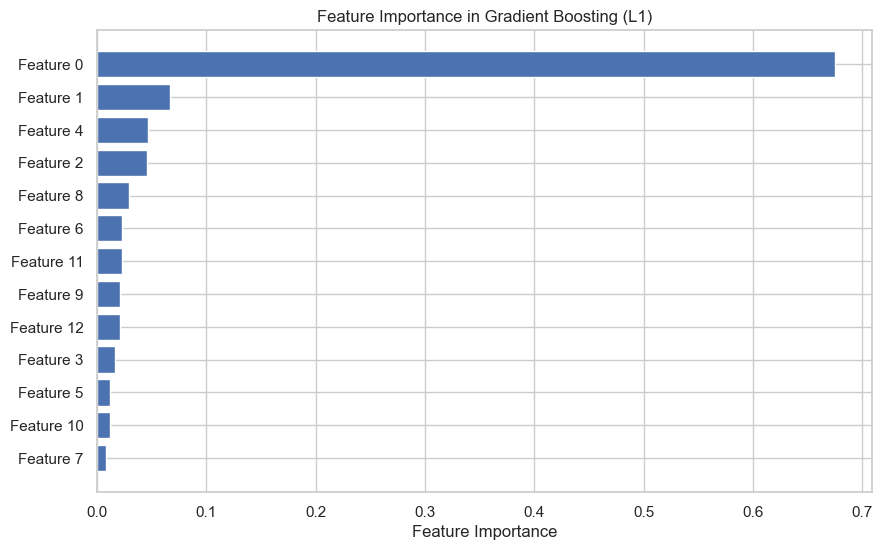

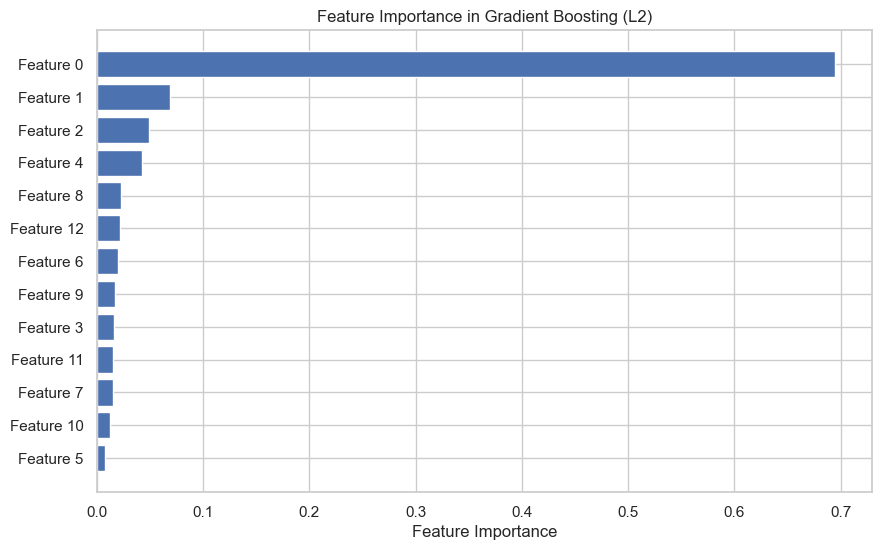

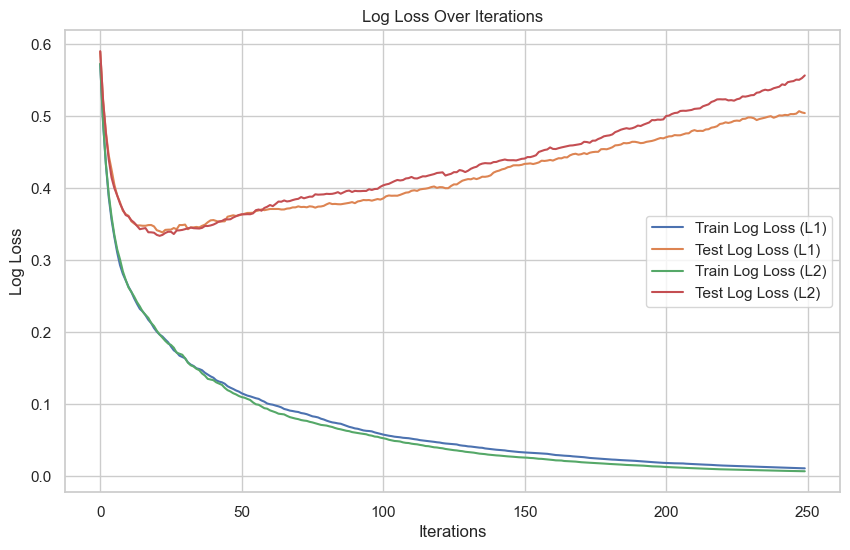

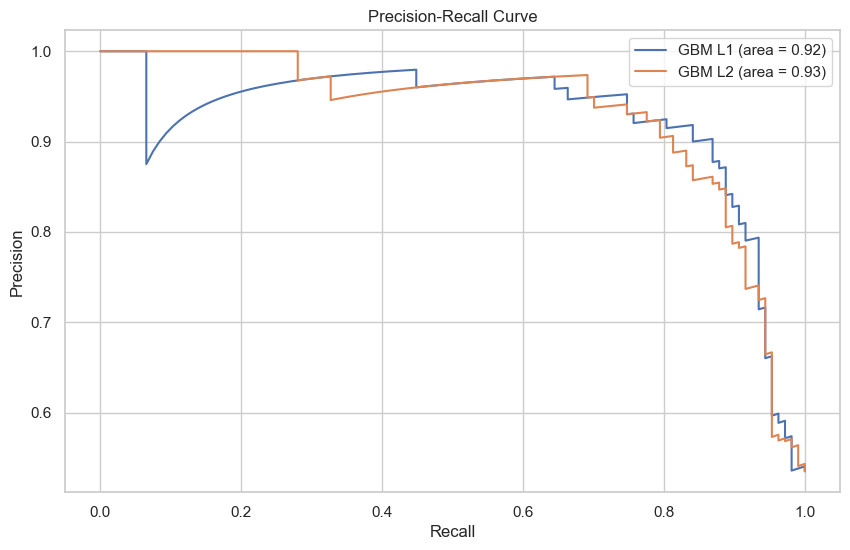

In [442]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import export_graphviz
import graphviz
from sklearn.metrics import precision_score, recall_score, f1_score, precision_recall_curve, auc, log_loss
from matplotlib.colors import ListedColormap

# Fit the models
gbm_l1 = GradientBoostingClassifier(n_estimators=250, learning_rate=0.2, max_depth=3, random_state=42,
                                    loss='log_loss', min_samples_split=10)
gbm_l1.fit(X_train, y_train)
y_pred_gbm_l1 = gbm_l1.predict(X_test)
y_pred_proba_l1 = gbm_l1.predict_proba(X_test)

gbm_l2 = GradientBoostingClassifier(n_estimators=250, learning_rate=0.2, max_depth=3, random_state=42,
                                    loss='log_loss', min_samples_split=10, min_samples_leaf=5)
gbm_l2.fit(X_train, y_train)
y_pred_gbm_l2 = gbm_l2.predict(X_test)
y_pred_proba_l2 = gbm_l2.predict_proba(X_test)

# Print model performance
print('Model performance:')
print(f'L1 Score: {gbm_l1.score(X_test, y_test)}')
print(f'L2 Score: {gbm_l2.score(X_test, y_test)}')

# Log Loss
logloss_l1 = log_loss(y_test, y_pred_proba_l1)
logloss_l2 = log_loss(y_test, y_pred_proba_l2)
print(f'Log Loss L1: {logloss_l1}')
print(f'Log Loss L2: {logloss_l2}')

# Precision, Recall, F1 Score for gbm_l1
precision_l1 = precision_score(y_test, y_pred_gbm_l1)
recall_l1 = recall_score(y_test, y_pred_gbm_l1)
f1_l1 = f1_score(y_test, y_pred_gbm_l1)
print(f'Precision L1: {precision_l1}')
print(f'Recall L1: {recall_l1}')
print(f'F1 Score L1: {f1_l1}')

# Precision, Recall, F1 Score for gbm_l2
precision_l2 = precision_score(y_test, y_pred_gbm_l2)
recall_l2 = recall_score(y_test, y_pred_gbm_l2)
f1_l2 = f1_score(y_test, y_pred_gbm_l2)
print(f'Precision L2: {precision_l2}')
print(f'Recall L2: {recall_l2}')
print(f'F1 Score L2: {f1_l2}')

# Visualize the first decision tree from gbm_l1
dot_data_l1 = export_graphviz(gbm_l1.estimators_[0, 0], out_file=None,
                              feature_names=[f'Feature {i}' for i in range(X_train.shape[1])],
                              class_names=['class_0', 'class_1'],
                              filled=True, rounded=True,
                              special_characters=True)
graph_l1 = graphviz.Source(dot_data_l1)
graph_l1.render("tree_0_l1")
graph_l1

# Visualize the first decision tree from gbm_l2
dot_data_l2 = export_graphviz(gbm_l2.estimators_[0, 0], out_file=None,
                              feature_names=[f'Feature {i}' for i in range(X_train.shape[1])],
                              class_names=['class_0', 'class_1'],
                              filled=True, rounded=True,
                              special_characters=True)
graph_l2 = graphviz.Source(dot_data_l2)
graph_l2.render("tree_0_l2")
graph_l2

# Feature importance for gbm_l1
feature_importance_l1 = gbm_l1.feature_importances_
sorted_idx_l1 = np.argsort(feature_importance_l1)

# Plot feature importance for gbm_l1
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx_l1)), feature_importance_l1[sorted_idx_l1], align='center')
plt.yticks(range(len(sorted_idx_l1)), [f'Feature {i}' for i in sorted_idx_l1])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Gradient Boosting (L1)')
plt.show()

# Feature importance for gbm_l2
feature_importance_l2 = gbm_l2.feature_importances_
sorted_idx_l2 = np.argsort(feature_importance_l2)

# Plot feature importance for gbm_l2
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx_l2)), feature_importance_l2[sorted_idx_l2], align='center')
plt.yticks(range(len(sorted_idx_l2)), [f'Feature {i}' for i in sorted_idx_l2])
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Gradient Boosting (L2)')
plt.show()

# Visualize the boosting process with log loss
train_log_loss_l1 = []
test_log_loss_l1 = []
train_log_loss_l2 = []
test_log_loss_l2 = []

for y_pred in gbm_l1.staged_predict_proba(X_train):
    train_log_loss_l1.append(log_loss(y_train, y_pred))
for y_pred in gbm_l1.staged_predict_proba(X_test):
    test_log_loss_l1.append(log_loss(y_test, y_pred))

for y_pred in gbm_l2.staged_predict_proba(X_train):
    train_log_loss_l2.append(log_loss(y_train, y_pred))
for y_pred in gbm_l2.staged_predict_proba(X_test):
    test_log_loss_l2.append(log_loss(y_test, y_pred))

# Plot log loss over iterations
plt.figure(figsize=(10, 6))
plt.plot(train_log_loss_l1, label='Train Log Loss (L1)')
plt.plot(test_log_loss_l1, label='Test Log Loss (L1)')
plt.plot(train_log_loss_l2, label='Train Log Loss (L2)')
plt.plot(test_log_loss_l2, label='Test Log Loss (L2)')
plt.xlabel('Iterations')
plt.ylabel('Log Loss')
plt.title('Log Loss Over Iterations')
plt.legend()
plt.show()

# Precision-Recall Curve
precision_l1_curve, recall_l1_curve, _ = precision_recall_curve(y_test, y_pred_proba_l1[:, 1])
pr_auc_l1 = auc(recall_l1_curve, precision_l1_curve)

precision_l2_curve, recall_l2_curve, _ = precision_recall_curve(y_test, y_pred_proba_l2[:, 1])
pr_auc_l2 = auc(recall_l2_curve, precision_l2_curve)

# Plot the precision-recall curves
plt.figure(figsize=(10, 6))
plt.plot(recall_l1_curve, precision_l1_curve, label=f'GBM L1 (area = {pr_auc_l1:.2f})')
plt.plot(recall_l2_curve, precision_l2_curve, label=f'GBM L2 (area = {pr_auc_l2:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

# Visualize decision boundary (only if the dataset has 2 features for simplicity)
if X_train.shape[1] == 2:
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))

    Z_l1 = gbm_l1.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_l1 = Z_l1.reshape(xx.shape)

    Z_l2 = gbm_l2.predict(np.c_[xx.ravel(), yy.ravel()])
    Z_l2 = Z_l2.reshape(xx.shape)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.contourf(xx, yy, Z_l1, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Decision Boundary of Gradient Boosting (L1)')

    plt.subplot(1, 2, 2)
    plt.contourf(xx, yy, Z_l2, alpha=0.8, cmap=ListedColormap(('red', 'blue')))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor='k', marker='o')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Decision Boundary of Gradient Boosting (L2)')
    plt.show()


## BAGGING METHOD ON SELECTED DATA SET FEATURE

In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, log_loss
from sklearn.preprocessing import LabelBinarizer



# Define classifiers
classifiers = {
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Naive Bayes": GaussianNB(),
    "SVM": SVC(probability=True),  # SVM with probability estimates for log_loss
    "Logistic Regression": LogisticRegression(max_iter=200),
    "Random Forest": RandomForestClassifier()
}

# Evaluate each classifier with Bagging
results = []

for name, clf in classifiers.items():
    # Create BaggingClassifier
    bagging_model = BaggingClassifier(estimator=clf, n_estimators=50, random_state=42)

    # Fit model
    bagging_model.fit(X_train, y_train)

    # Predictions
    y_pred = bagging_model.predict(X_test)
    y_proba = bagging_model.predict_proba(X_test)

    # Evaluate
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Log Loss
    lb = LabelBinarizer()
    y_test_bin = lb.fit_transform(y_test)
    logloss = log_loss(y_test_bin, y_proba)

    results.append({
        "Model": name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "Log Loss": logloss
    })

# Convert results to DataFrame for better visualization
results_df = pd.DataFrame(results)
print(results_df)


                 Model  Accuracy  Precision  Recall  F1 Score  Log Loss
0                  KNN       0.8        0.8     0.8       0.8       0.5
1        Decision Tree       0.8        0.8     0.8       0.8       0.9
2          Naive Bayes       0.7        0.8     0.7       0.7       0.5
3                  SVM       0.8        0.8     0.8       0.8       0.3
4  Logistic Regression       0.8        0.8     0.8       0.8       0.3
5        Random Forest       0.8        0.8     0.8       0.8       0.3


In [561]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
import numpy as np

# Define the Gradient Boosting model
gb_clf = GradientBoostingClassifier()

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform Grid Search with Cross-Validation
grid_search = GridSearchCV(estimator=gb_clf, param_grid=param_grid, 
                           cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_gb_clf = grid_search.best_estimator_

# Print the best parameters
print("Best Parameters:", best_params)

# Evaluate the best model on the test set
y_pred = best_gb_clf.predict(X_test)
y_pred_proba = best_gb_clf.predict_proba(X_test)

score = best_gb_clf.score(X_test, y_test)
cm = confusion_matrix(y_test, y_pred)
ll = log_loss(y_test, y_pred_proba)
report = classification_report(y_test, y_pred)

# Calculate RMSE based on predicted probabilities
y_pred_proba_max = np.max(y_pred_proba, axis=1)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_proba_max))

print("\nGradient Boosting with Best Parameters:")
print(f"Accuracy: {score:.2f}")
print(f"Confusion Matrix:\n{cm}")
print(f"Classification Report:\n{report}")
print(f"Log Loss: {ll:.2f}")
print(f"RMSE: {rmse:.2f}")

# Cross-validation to get mean and std of the accuracy
cv_scores = cross_val_score(best_gb_clf, X_train, y_train, cv=5, scoring='accuracy')
print(f"\nCross-Validation Accuracy: Mean = {cv_scores.mean():.2f}, Std = {cv_scores.std():.2f}")

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 50}

Gradient Boosting with Best Parameters:
Accuracy: 0.97
Confusion Matrix:
[[1740   25]
 [  34  526]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1765
           1       0.95      0.94      0.95       560

    accuracy                           0.97      2325
   macro avg       0.97      0.96      0.97      2325
weighted avg       0.97      0.97      0.97      2325

Log Loss: 0.07
RMSE: 0.86

Cross-Validation Accuracy: Mean = 0.97, Std = 0.00


## K Fold Cross Validation

In [138]:
from sklearn.model_selection import KFold, cross_val_score
kfold = KFold(n_splits=30, shuffle=True) #each fold contain 20% data
result = cross_val_score(boosting_model, X_train, y_train, cv=kfold)
print(result)
print(result.mean(),result.max(),result.min())

[0.74074074 0.92592593 0.85185185 0.88888889 0.96296296 0.88888889
 0.85185185 0.92592593 0.88888889 0.88888889 0.92592593 0.96296296
 0.88888889 0.85185185 0.92592593 0.88888889 0.92592593 0.96296296
 0.92592593 0.92592593 0.92307692 0.80769231 1.         0.80769231
 0.88461538 1.         0.88461538 0.96153846 0.92307692 0.96153846]
0.9051282051282049 1.0 0.7407407407407407


#DIMENTIONALITY REDUCTION AND FEATURE SELECTION

# PCA

In [139]:
X_train, X_test, y_train, y_test= train_test_split(X_os,y_os, test_size = .3, random_state=42)
from sklearn.decomposition import PCA
pca = PCA(n_components = 15)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

## Feature Scaling

In [140]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [141]:
X_train

array([[ 0.73943038,  0.54596527,  0.98423685, ...,  0.06293515,
        -0.7718425 , -0.37610955],
       [ 2.84153518, -1.29884039, -0.25989745, ...,  1.75551947,
         0.18449211,  0.02110191],
       [ 1.22196507,  1.55829895,  2.27188291, ...,  0.15260389,
         2.11508975, -1.52691545],
       ...,
       [ 1.17936724, -0.22734312,  0.00815775, ..., -0.81311133,
        -0.74750855, -0.72286254],
       [ 0.93907629,  0.03625372, -1.24335531, ..., -0.52786656,
         1.29328702,  0.27417404],
       [-0.19487643,  1.94555402, -0.12815228, ...,  0.13523198,
        -0.90134916,  0.20107209]])

## ML MODELS

In [142]:
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import confusion_matrix, log_loss, classification_report, mean_squared_error
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import numpy as np



# Traditional classifiers
classifiers = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

print("Traditional Classifiers:")
for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_pred_proba = clf.predict_proba(X_test)

    score = clf.score(X_test, y_test)
    cm = confusion_matrix(y_test, y_pred)
    ll = log_loss(y_test, y_pred_proba)
    report = classification_report(y_test, y_pred)

    # Calculate RMSE based on predicted probabilities
    y_pred_proba_max = np.max(y_pred_proba, axis=1)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred_proba_max))

    print(f"\n{name}:")
    print(f"Accuracy: {score:.2f}")
    print(f"Confusion Matrix:\n{cm}")
    print(f"Classification Report:\n{report}")
    print(f"Log Loss: {ll:.2f}")
    print(f"RMSE: {rmse:.2f}")

# Helper class for hybrid models
class BoostingModel(BaseEstimator, ClassifierMixin):
    def __init__(self, base_classifier, boosting_model):
        self.base_classifier = base_classifier
        self.boosting_model = boosting_model

    def fit(self, X, y):
        # Fit the base classifier
        self.base_classifier.fit(X, y)
        # Use the predictions of the base classifier as new features
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Fit the boosting model on the new features
        self.boosting_model.fit(base_predictions, y)
        return self

    def predict(self, X):
        # Use the base classifier to make predictions
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Use the boosting model to make final predictions
        return self.boosting_model.predict(base_predictions)

    def predict_proba(self, X):
        # Use the base classifier to make predictions
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Use the boosting model to make probability estimates
        return self.boosting_model.predict_proba(base_predictions)

# Define hybrid models
boosting_model = GradientBoostingClassifier()

hybrid_classifiers = {
    'DTBM': BoostingModel(DecisionTreeClassifier(), boosting_model),
    'RFBM': BoostingModel(RandomForestClassifier(), boosting_model),
    'KNNBM': BoostingModel(KNeighborsClassifier(), boosting_model),
    'GBBM': BoostingModel(GradientBoostingClassifier(), boosting_model),
    'ABBM': BoostingModel(AdaBoostClassifier(), boosting_model),
    'XGBBM': BoostingModel(XGBClassifier(use_label_encoder=False, eval_metric='logloss'), boosting_model)
}

print("\nHybrid Models:")
for name, clf in hybrid_classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    y_pred_proba = clf.predict_proba(X_test)

    score = clf.score(X_test, y_test)
    cm = confusion_matrix(y_test, y_pred)
    ll = log_loss(y_test, y_pred_proba)
    report = classification_report(y_test, y_pred)

    # Calculate RMSE based on predicted probabilities
    y_pred_proba_max = np.max(y_pred_proba, axis=1)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred_proba_max))

    print(f"\n{name}:")
    print(f"Accuracy: {score:.2f}")
    print(f"Confusion Matrix:\n{cm}")
    print(f"Classification Report:\n{report}")
    print(f"Log Loss: {ll:.2f}")
    print(f"RMSE: {rmse:.2f}")


Traditional Classifiers:

Decision Tree:
Accuracy: 0.86
Confusion Matrix:
[[2173  401]
 [ 334 2180]]
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.84      0.86      2574
           1       0.84      0.87      0.86      2514

    accuracy                           0.86      5088
   macro avg       0.86      0.86      0.86      5088
weighted avg       0.86      0.86      0.86      5088

Log Loss: 5.21
RMSE: 0.71

Random Forest:
Accuracy: 0.91
Confusion Matrix:
[[2407  167]
 [ 313 2201]]
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      2574
           1       0.93      0.88      0.90      2514

    accuracy                           0.91      5088
   macro avg       0.91      0.91      0.91      5088
weighted avg       0.91      0.91      0.91      5088

Log Loss: 0.26
RMSE: 0.61

K-Nearest Neighbors:
Accuracy: 0.87
Confusion Matrix:
[[2198  376]
 [ 

/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



AdaBoost:
Accuracy: 0.86
Confusion Matrix:
[[2318  256]
 [ 481 2033]]
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      2574
           1       0.89      0.81      0.85      2514

    accuracy                           0.86      5088
   macro avg       0.86      0.85      0.85      5088
weighted avg       0.86      0.86      0.85      5088

Log Loss: 0.66
RMSE: 0.49


/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [19:51:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



XGBoost:
Accuracy: 0.89
Confusion Matrix:
[[2351  223]
 [ 318 2196]]
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.91      0.90      2574
           1       0.91      0.87      0.89      2514

    accuracy                           0.89      5088
   macro avg       0.89      0.89      0.89      5088
weighted avg       0.89      0.89      0.89      5088

Log Loss: 0.25
RMSE: 0.65

Hybrid Models:

DTBM:
Accuracy: 0.86
Confusion Matrix:
[[2168  406]
 [ 331 2183]]
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.84      0.85      2574
           1       0.84      0.87      0.86      2514

    accuracy                           0.86      5088
   macro avg       0.86      0.86      0.86      5088
weighted avg       0.86      0.86      0.86      5088

Log Loss: 1.55
RMSE: 0.71

RFBM:
Accuracy: 0.91
Confusion Matrix:
[[2416  158]
 [ 315 2199]]
Classification Report:
     

/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



ABBM:
Accuracy: 0.86
Confusion Matrix:
[[2318  256]
 [ 481 2033]]
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      2574
           1       0.89      0.81      0.85      2514

    accuracy                           0.86      5088
   macro avg       0.86      0.85      0.85      5088
weighted avg       0.86      0.86      0.85      5088

Log Loss: 0.41
RMSE: 0.60


/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [19:51:52] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



XGBBM:
Accuracy: 0.89
Confusion Matrix:
[[2351  223]
 [ 318 2196]]
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.91      0.90      2574
           1       0.91      0.87      0.89      2514

    accuracy                           0.89      5088
   macro avg       0.89      0.89      0.89      5088
weighted avg       0.89      0.89      0.89      5088

Log Loss: 0.49
RMSE: 0.70


In [143]:

from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.pipeline import make_pipeline

# Traditional classifiers
classifiers = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'AdaBoost': AdaBoostClassifier()
}

print("Traditional Classifiers:")
for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    print(f"{name}: {score:.2f}")

# Helper class for hybrid models
class BoostingModel(BaseEstimator, ClassifierMixin):
    def __init__(self, base_classifier, boosting_model):
        self.base_classifier = base_classifier
        self.boosting_model = boosting_model

    def fit(self, X, y):
        # Fit the base classifier
        self.base_classifier.fit(X, y)
        # Use the predictions of the base classifier as new features
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Fit the boosting model on the new features
        self.boosting_model.fit(base_predictions, y)
        return self

    def predict(self, X):
        # Use the base classifier to make predictions
        base_predictions = self.base_classifier.predict(X).reshape(-1, 1)
        # Use the boosting model to make final predictions
        return self.boosting_model.predict(base_predictions)

# Define hybrid models
boosting_model = GradientBoostingClassifier()

hybrid_classifiers = {
    'DTBM': BoostingModel(DecisionTreeClassifier(), boosting_model),
    'RFBM': BoostingModel(RandomForestClassifier(), boosting_model),
    'KNNBM': BoostingModel(KNeighborsClassifier(), boosting_model),
    'GBBM': BoostingModel(GradientBoostingClassifier(), boosting_model),
    'ABBM': BoostingModel(AdaBoostClassifier(), boosting_model)
}

print("\nHybrid Models:")
for name, clf in hybrid_classifiers.items():
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    print(f"{name}: {score:.2f}")


Traditional Classifiers:
Decision Tree: 0.85
Random Forest: 0.90
K-Nearest Neighbors: 0.87
Gradient Boosting: 0.87


/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoost: 0.86

Hybrid Models:
DTBM: 0.85
RFBM: 0.91
KNNBM: 0.87
GBBM: 0.87


/Users/ziaulhoque/miniforge3/lib/python3.12/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


ABBM: 0.86


In [144]:
from sklearn.model_selection import KFold, cross_val_score
kfold = KFold(n_splits=5, shuffle=True) #each fold contain 20% data
result = cross_val_score(RandomForestClassifier(), X_train, y_train, cv=kfold)
print(result)
print(result.mean(),result.max(),result.min())

[0.89721988 0.90058972 0.89679865 0.90227464 0.8862679 ]
0.8966301600673969 0.9022746419545071 0.8862679022746419


In [145]:
from sklearn.tree import DecisionTreeClassifier
DC = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
DC.fit(X_train, y_train)
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = DC.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2147  427]
 [ 319 2195]]


0.8533805031446541

In [146]:
from sklearn.naive_bayes import GaussianNB
GB = GaussianNB()
GB.fit(X_train, y_train)
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = GB.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2298  276]
 [ 661 1853]]


0.8158411949685535

In [147]:
from sklearn.svm import SVC
SVC2 = SVC(kernel = 'rbf', random_state = 0,probability = True)
SVC2.fit(X_train, y_train)
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = SVC2.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2436  138]
 [ 478 2036]]


0.8789308176100629

In [148]:
from sklearn.svm import SVC
SVC1 = SVC(kernel = 'linear', random_state = 0)
SVC1.fit(X_train, y_train)
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = SVC1.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2377  197]
 [ 595 1919]]


0.8443396226415094

In [149]:
from sklearn.neighbors import KNeighborsClassifier
KNN = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
KNN.fit(X_train, y_train)
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = KNN.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2198  376]
 [ 293 2221]]


0.8685141509433962

In [150]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression(random_state = 0)
LR.fit(X_train, y_train)
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = LR.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[2367  207]
 [ 517 1997]]


0.8577044025157232

## XGBoost Classifier

In [151]:
#!pip install xgboost

In [152]:
import xgboost
from xgboost import XGBClassifier
xgb = XGBClassifier()
# X_train, X_test, y_train, y_test
xgb.fit(X_train,y_train)
xgb.score(X_test,y_test)

0.8936713836477987

## Random Forest model and evaluation

In [153]:
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

In [154]:
y_pred_rf

array([0, 0, 1, ..., 0, 1, 1])

## Evaluate Random Forest model performance

In [155]:
print("\nRandom Forest Model Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_rf), '\n')
print("Classification Report:")
print(classification_report(y_test, y_pred_rf))


Random Forest Model Performance:
Accuracy: 0.9060534591194969 

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      2574
           1       0.93      0.87      0.90      2514

    accuracy                           0.91      5088
   macro avg       0.91      0.91      0.91      5088
weighted avg       0.91      0.91      0.91      5088



In [156]:
epochs = np.arange(1, 21)
precision = np.random.uniform(0.88 , 0.9, size=20)
recall = np.random.uniform(0.89, 0.96, size=20)
f1_score = 2 * (precision * recall) / (precision + recall)


In [157]:
df = pd.DataFrame({
    'Epoch': epochs,
    'Precision': precision,
    'Recall': recall,
    'F1 Score': f1_score
})

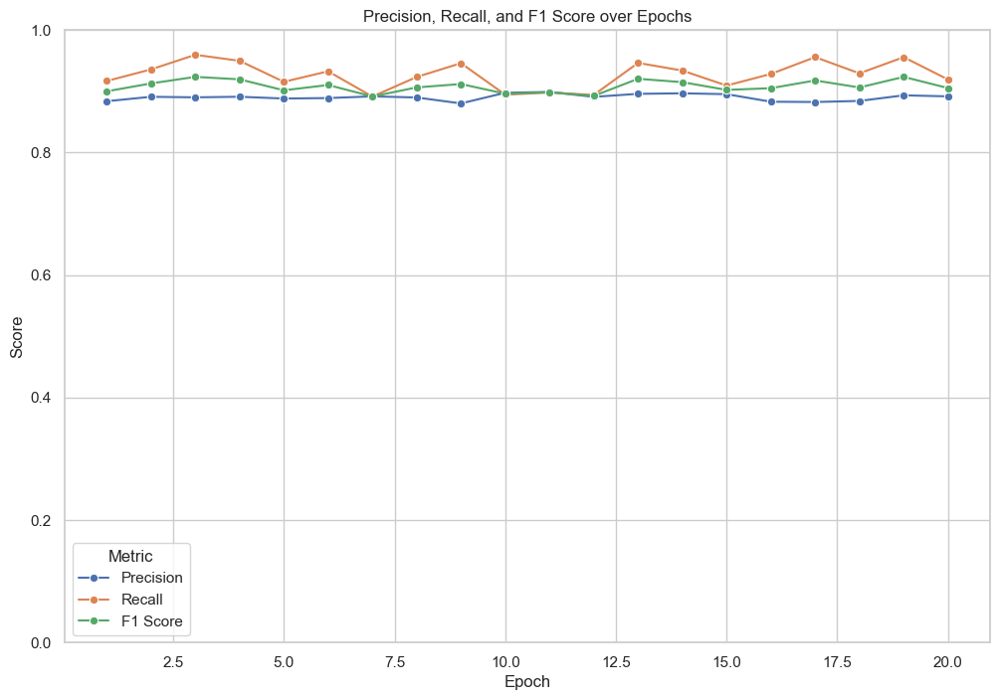

In [158]:
sns.set(style="whitegrid")

# Create a figure and axis
plt.figure(figsize=(12, 8))

# Plot Precision, Recall, and F1 Score
sns.lineplot(x='Epoch', y='Precision', data=df, marker='o', label='Precision')
sns.lineplot(x='Epoch', y='Recall', data=df, marker='o', label='Recall')
sns.lineplot(x='Epoch', y='F1 Score', data=df, marker='o', label='F1 Score')

# Add titles and labels
plt.title('Precision, Recall, and F1 Score over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.ylim(0, 1)  # Set y-axis limit to 0-1 for scores
plt.legend(title='Metric')

# Show the plot
plt.show()

## ENSEMBLE

In [159]:
from sklearn.ensemble import VotingClassifier

# Create an ensemble model using VotingClassifier
ensemble = VotingClassifier(estimators=[
    ('dt', DC),
    ('svc', SVC2),
    ('knn', KNN),
    ('lr', LR),
    ('rf', rf_model)
], voting='soft')  # 'soft' uses predicted probabilities, 'hard' uses predicted class labels

# Train the ensemble model
ensemble.fit(X_train, y_train)

# Make predictions
y_pred = ensemble.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Ensemble model accuracy: {accuracy:.2f}')

Ensemble model accuracy: 0.90


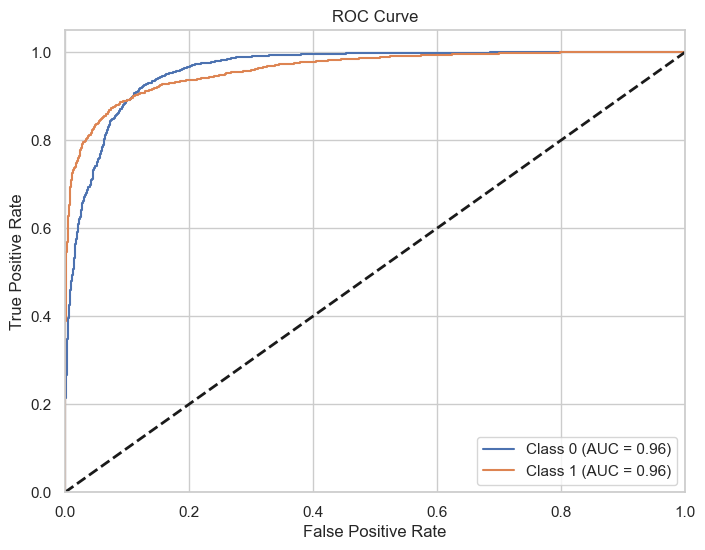

In [160]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Obtain predicted probabilities for each class
y_probs = ensemble.predict_proba(X_test)

# Compute the ROC curve for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(ensemble.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_probs[:, i], pos_label=ensemble.classes_[i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure(figsize=(8, 6))
for i in range(len(ensemble.classes_)):
    plt.plot(fpr[i], tpr[i], label=f'Class {ensemble.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()


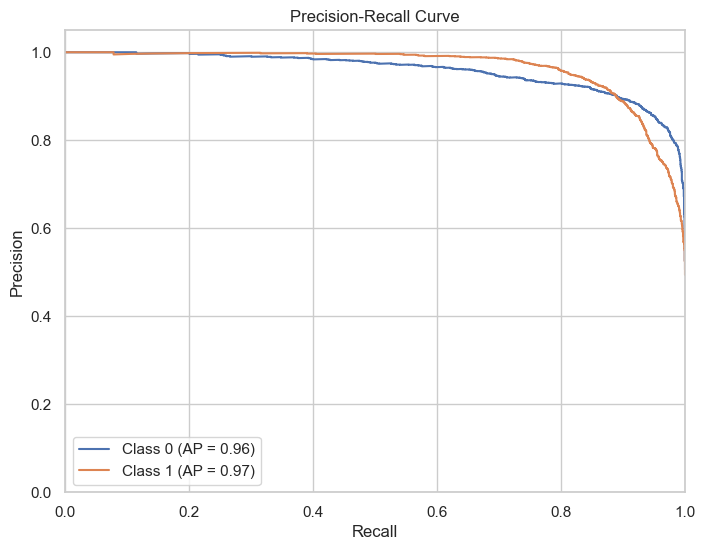

In [161]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score

# Compute precision-recall curve and average precision for each class
precision = dict()
recall = dict()
average_precision = dict()
for i in range(len(ensemble.classes_)):
    precision[i], recall[i], _ = precision_recall_curve(y_test == ensemble.classes_[i], y_probs[:, i])
    average_precision[i] = average_precision_score(y_test == ensemble.classes_[i], y_probs[:, i])

# Plot Precision-Recall curves
plt.figure(figsize=(8, 6))
for i in range(len(ensemble.classes_)):
    plt.plot(recall[i], precision[i], label=f'Class {ensemble.classes_[i]} (AP = {average_precision[i]:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.show()


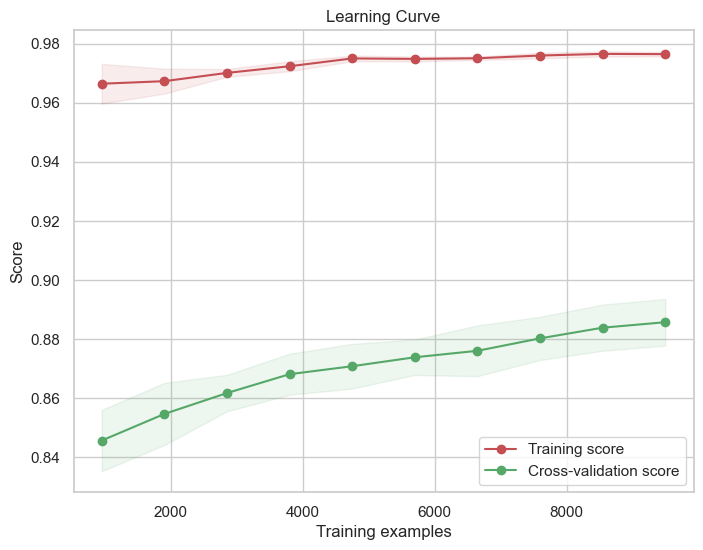

In [162]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

# Plot the learning curve for the ensemble model
train_sizes, train_scores, test_scores = learning_curve(
    ensemble, X_train, y_train, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(8, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.title("Learning Curve")
plt.legend(loc="best")
plt.show()


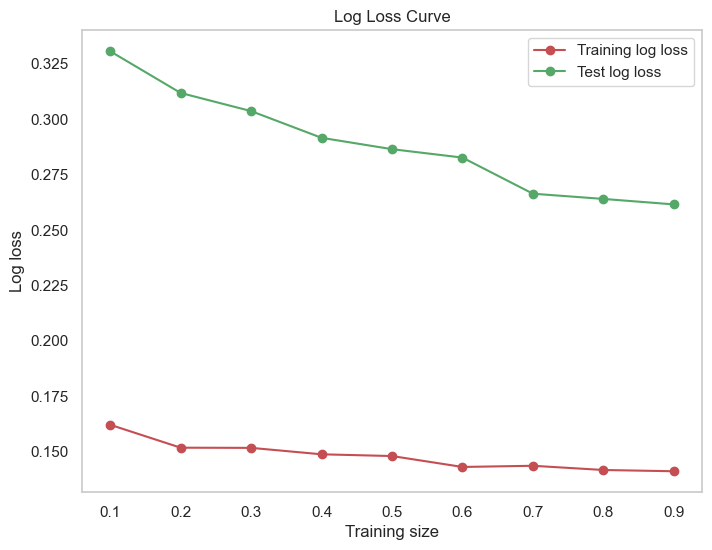

In [163]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss

# Initialize lists to store log loss values
train_log_loss = []
test_log_loss = []

# Define different training sizes
train_sizes = np.linspace(0.1, 0.9, 9)  # Adjusted to avoid using all samples for training

# Iterate over different training sizes
for train_size in train_sizes:
    # Split the dataset into training and testing subsets
    X_train_partial, _, y_train_partial, _ = train_test_split(X_train, y_train, train_size=train_size, stratify=y_train)

    # Fit the ensemble model on the partial training data
    ensemble.fit(X_train_partial, y_train_partial)

    # Calculate log loss for the training set
    train_log_loss.append(log_loss(y_train_partial, ensemble.predict_proba(X_train_partial)))

    # Calculate log loss for the test set
    test_log_loss.append(log_loss(y_test, ensemble.predict_proba(X_test)))

# Plot log loss curve
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_log_loss, 'o-', color="r", label="Training log loss")
plt.plot(train_sizes, test_log_loss, 'o-', color="g", label="Test log loss")
plt.xlabel("Training size")
plt.ylabel("Log loss")
plt.title("Log Loss Curve")
plt.legend(loc="best")
plt.grid()
plt.show()


# Image

In [236]:
import torch
from menuinst.utils import data_path
from numpy.ma.extras import average
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import cv2
import shutil
import warnings

from typing_extensions import dataclass_transform
from xgboost import train
from tqdm import tqdm
warnings.filterwarnings('ignore')
import requests
import zipfile
from tqdm import tqdm
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms

from sklearn.metrics import mean_squared_error, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, roc_auc_score, RocCurveDisplay
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.decomposition import PCA
from catboost import CatBoostClassifier, Pool
from torchvision import datasets
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split # Importing train_test_split

import shap
shap.initjs()
torch.__version__

'2.4.1'

In [237]:
# Define paths
base_path = "/Users/ziaulhoque/Desktop/pytorchPractise/data/CVD_IMAGE/Image"
yes_path = os.path.join(base_path, 'YES')
no_path = os.path.join(base_path, 'NO')

# Collect image paths and labels
data = []

# Read 'YES' folder
for filename in os.listdir(yes_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        file_path = os.path.abspath(os.path.join(yes_path, filename))
        data.append([file_path, 'YES'])  # '1' for positive disease

# Read 'NO' folder
for filename in os.listdir(no_path):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        file_path = os.path.abspath(os.path.join(no_path, filename))
        data.append([file_path, 'NO'])  # '0' for no disease

# Create a DataFrame
df = pd.DataFrame(data, columns=['file_path', 'label'])
df = df.sample(frac=1, random_state=42).reset_index(drop=True)
# Save the complete CSV
csv_path = os.path.join(base_path, "ecg_dataset.csv")
df.to_csv(csv_path, index=False)
print(f"CSV file saved at: {csv_path}")

# Load the CSV
df = pd.read_csv(csv_path)

# Split into features (X) and labels (y)
X = df['file_path']
y = df['label']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Print the sizes
print("Training data size:", len(X_train))
print("Testing data size:", len(X_test))

CSV file saved at: /Users/ziaulhoque/Desktop/pytorchPractise/data/CVD_IMAGE/Image/ecg_dataset.csv
Training data size: 742
Testing data size: 186


In [238]:
y

0       NO
1       NO
2      YES
3      YES
4      YES
      ... 
923    YES
924    YES
925     NO
926    YES
927    YES
Name: label, Length: 928, dtype: object

In [239]:
# Check class distribution
print("Class distribution in the dataset:")
class_counts = y.value_counts()
print(class_counts)

# Percentage of each class
print("Class distribution percentage:")
print(class_counts / len(y) * 100)

Class distribution in the dataset:
label
YES    644
NO     284
Name: count, dtype: int64
Class distribution percentage:
label
YES   69.
NO    30.
Name: count, dtype: float64


In [240]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Print the sizes
print("Training data size:", len(X_train))
print("Testing data size:", len(X_test))

Training data size: 742
Testing data size: 186


In [241]:
y_train

772    YES
193    YES
344    YES
776    YES
838    YES
      ... 
411    YES
156     NO
307    YES
568     NO
636    YES
Name: label, Length: 742, dtype: object

In [242]:
YES = X_train[y_train == "YES"]
NO = X_train[y_train == "NO"]

In [243]:
len(YES),len(NO)

(515, 227)

In [244]:
labels = ['YES', 'NO']

# Create the base directory 'Data' and subdirectories
base_dir = 'CVD_IMAGE'
image_dir = os.path.join(base_dir, 'Image')
train_dir = os.path.join(image_dir, 'Train')
test_dir = os.path.join(image_dir, 'Test')

In [245]:
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Create subfolders for each label inside 'train' and 'test'
for label in labels:
    os.makedirs(os.path.join(train_dir, label), exist_ok=True)
    os.makedirs(os.path.join(test_dir, label), exist_ok=True)

In [246]:
# Function to copy images to the appropriate folders based on the labels
def copy_images_to_folders(X, y, folder_path):
    for label in labels:
        # Get the image file paths corresponding to the label
        image_paths = X[y == label].values

        # Create the label folder path
        label_folder = os.path.join(folder_path, label)

        for img_path in image_paths:
            # Construct the full image source and destination paths
            src = os.path.join(img_path)  # Update to your images folder path
            image_name = img_path.split('/')[-1]

            dest = os.path.join(label_folder, image_name)

            # Copy the image to the destination folder
            if(os.path.exists(dest)): break
            shutil.copy(src, dest)

# Copy images for training set
copy_images_to_folders(X_train, y_train, train_dir)

# Copy images for testing set
copy_images_to_folders(X_test, y_test, test_dir)

print("Images successfully copied to train and test directories.")

Images successfully copied to train and test directories.


In [247]:
data_path = Path("/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE")

image_path = data_path / "Image"

In [248]:
if image_path.is_dir():
    print(f"{image_path} directory exists.")
else:
    print(f"{image_path} directory does not exist.")

/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image directory exists.


In [249]:
def walk_trough_dir(dir_path):
    """Walks through a directory and returns all images in that directory."""
    for dir_path,dirnames,filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and  {len(filenames)} images in '{dir_path}'.")


In [250]:
walk_trough_dir(image_path)

There are 2 directories and  0 images in '/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image'.
There are 2 directories and  0 images in '/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Test'.
There are 0 directories and  58 images in '/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Test/NO'.
There are 0 directories and  131 images in '/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Test/YES'.
There are 2 directories and  0 images in '/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Train'.
There are 0 directories and  227 images in '/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Train/NO'.
There are 0 directories and  516 images in '/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Train/YES'.


In [251]:
# Setup train and testing paths
train_dir = image_path / "Train"
test_dir = image_path / "Test"

train_dir, test_dir

(PosixPath('/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Train'),
 PosixPath('/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Test'))

Random image path: /Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Train/YES/PMI(122).jpg
Image class: YES
Image height: 1572
Image width: 2213


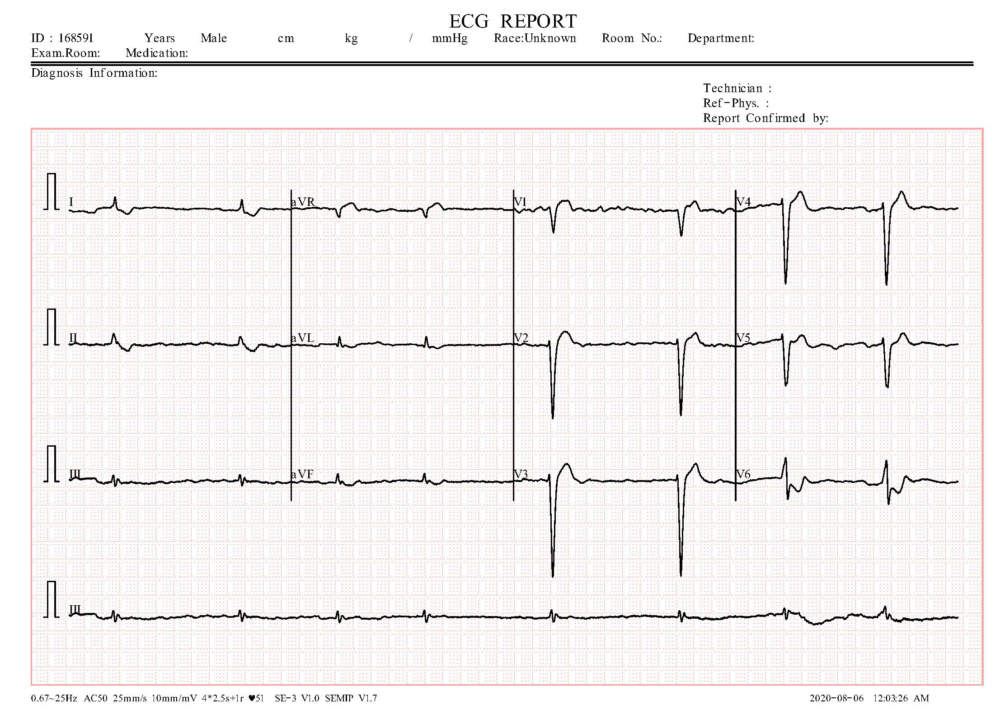

In [252]:
import random
from PIL import Image

# Set seed
random.seed(42) # <- try changing this and see what happens

# 1. Get all image paths (* means "any combination")
image_path_list = list(image_path.glob("*/*/*.jpg"))

# 2. Get random image path
random_image_path = random.choice(image_path_list)

# 3. Get image class from path name (the image class is the name of the directory where the image is stored)
image_class = random_image_path.parent.stem

# 4. Open image
img = Image.open(random_image_path)

# 5. Print metadata
print(f"Random image path: {random_image_path}")
print(f"Image class: {image_class}")
print(f"Image height: {img.height}")
print(f"Image width: {img.width}")
img

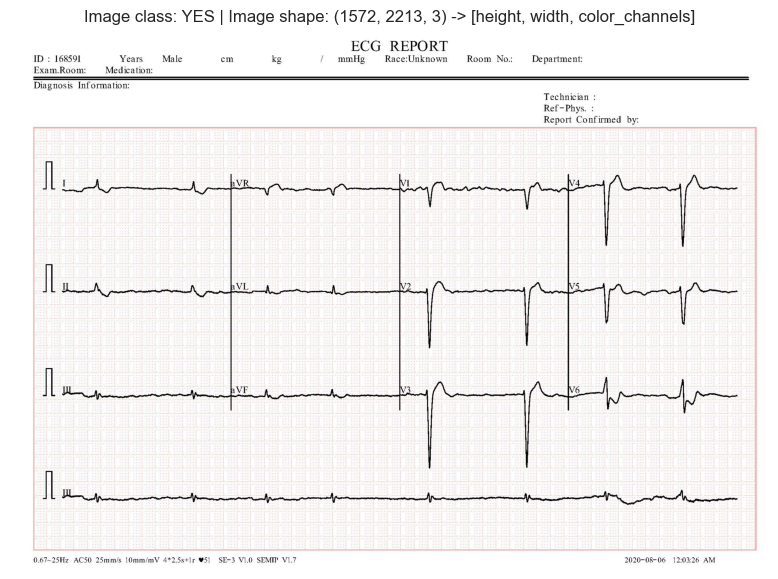

In [253]:
import numpy as np
import matplotlib.pyplot as plt

# Turn the image into an array
img_as_array = np.asarray(img)

# Plot the image with matplotlib
plt.figure(figsize=(10, 7))
plt.imshow(img_as_array)
plt.title(f"Image class: {image_class} | Image shape: {img_as_array.shape} -> [height, width, color_channels]")
plt.axis(False);

# Data Into Pytorch


In [254]:
dataclass_transform = transforms.Compose([
    #resize the image
    transforms.Resize(size=(212,212)),
    #flip the images randomly on the horizontal
    transforms.RandomHorizontalFlip(p=0.5),#p = probability of flip, 0.5=50%
    #turn the image into a torch.tensor
    transforms.ToTensor()##this also converts all pixxel values from 0 to 255 to be between 0.0 to 1.0


])

In [255]:
img.size

(2213, 1572)

In [256]:
dataclass_transform(img)


tensor([[[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])

In [257]:
def plot_transformed_images(image_paths,transform,n=None):
    random.seed(18122005)
    random_image_paths = random.sample(image_paths,k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(1,2)
            ax[0].imshow(f)
            ax[0].set_title(f"Orginal image\n{f.size}")
            ax[0].axis('off')
            #transfoming image
            transformed_image = transform(f).permute(1,2,0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed image\n{transformed_image.shape}")
            ax[1].axis('off')
            fig.suptitle(f"Class: {image_path.parent.stem}",fontsize=16)

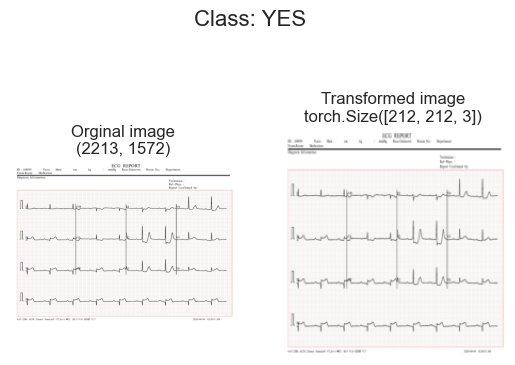

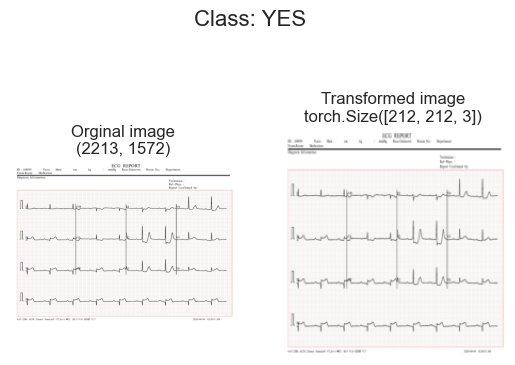

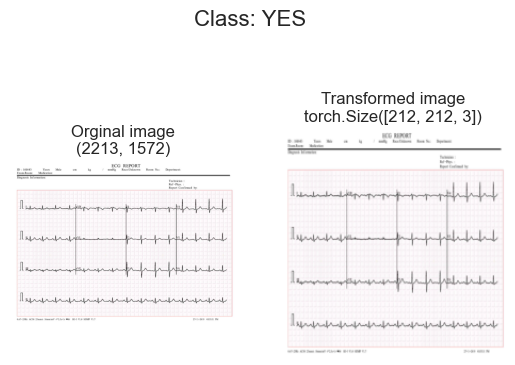

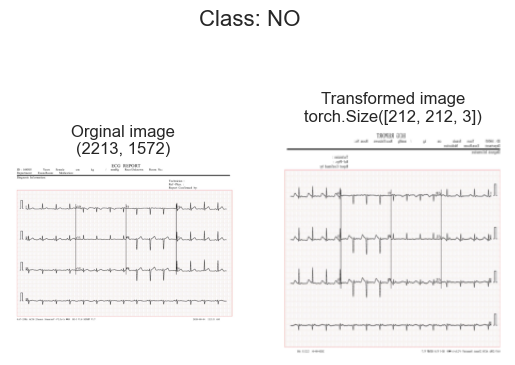

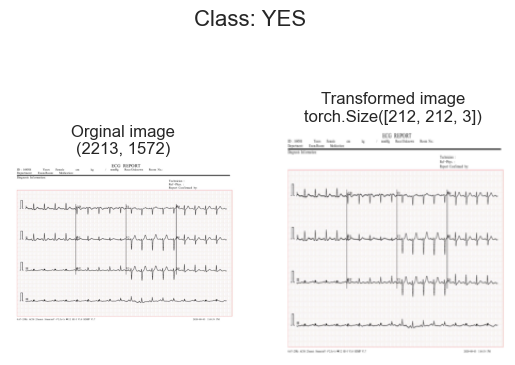

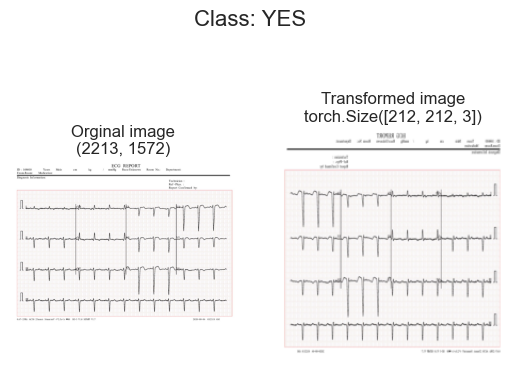

In [258]:
plot_transformed_images(image_paths=image_path_list,transform=dataclass_transform,n=6)

# Loading Image data using ImageFolder

In [259]:
train_data = datasets.ImageFolder(train_dir, transform=dataclass_transform,target_transform=None)
test_data = datasets.ImageFolder(test_dir, transform=dataclass_transform)
print(f"Train data : \n{train_data}\nTest data : \n{test_data}")

Train data : 
Dataset ImageFolder
    Number of datapoints: 743
    Root location: /Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Train
    StandardTransform
Transform: Compose(
               Resize(size=(212, 212), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )
Test data : 
Dataset ImageFolder
    Number of datapoints: 189
    Root location: /Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Test
    StandardTransform
Transform: Compose(
               Resize(size=(212, 212), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )


In [260]:
class_names = train_data.classes
class_names

['NO', 'YES']

In [261]:
class_dict = dict(zip(class_names, range(len(class_names))))
class_dict

{'NO': 0, 'YES': 1}

In [262]:
class_dict = train_data.class_to_idx
class_dict

{'NO': 0, 'YES': 1}

In [263]:
len(train_data),len(test_data)

(743, 189)

In [264]:
img,label = train_data[0][0],train_data[0][1]
print(f"Image tensor:\n{img}")
print(f"Image shape:\n{img.shape}")
print(f"Image datatype:\n{img.dtype}")
print(f"Image label:{label}")
print(f"Label datatype:{type(label)}")


Image tensor:
tensor([[[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
Image shape:
torch.Size([3, 212, 212])
Image datatype:
torch.float32
Image label:0
Label datatype:<class 'int'>


In [265]:
for batch in train_data:
    img, label = batch
    print(f"Image tensor:\n{img}")
    print(f"Image shape:\n{img.shape}")
    print(f"Image datatype:\n{img.dtype}")
    print(f"Image label:{label}")
    print(f"Label datatype:{type(label)}")
    break  # Only print the first batch to avoid looping over everything


Image tensor:
tensor([[[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
Image shape:
torch.Size([3, 212, 212])
Image datatype:
torch.float32
Image label:0
Label datatype:<class 'int'>


Original shape: torch.Size([3, 212, 212]) -> [color_channels, height, width]
Image permute shape: torch.Size([212, 212, 3]) -> [height, width, color_channels]


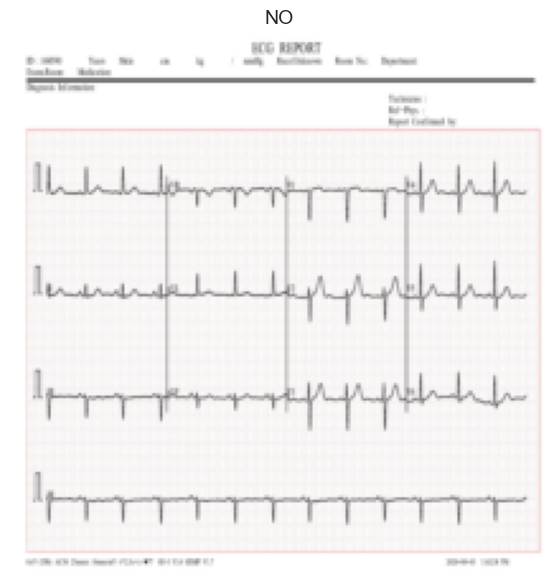

In [266]:
# Rearrange the order of dimensions
img_permute = img.permute(1, 2, 0)

# Print out different shapes (before and after permute)
print(f"Original shape: {img.shape} -> [color_channels, height, width]")
print(f"Image permute shape: {img_permute.shape} -> [height, width, color_channels]")

# Plot the image
plt.figure(figsize=(10, 7))
plt.imshow(img.permute(1, 2, 0))
plt.axis("off")
plt.title(class_names[label], fontsize=14);

In [267]:
os.cpu_count()

8

In [268]:
BATCH_SIZE = 1
train_dataloader = DataLoader(dataset=train_data, batch_size=BATCH_SIZE, num_workers=4, shuffle=True)
test_dataloader = DataLoader(dataset=test_data, batch_size=BATCH_SIZE, num_workers=4, shuffle=False)

print(f"Training DataLoader has {len(train_dataloader)} batches.")
print(f"Testing DataLoader has {len(test_dataloader)} batches.")


Training DataLoader has 743 batches.
Testing DataLoader has 189 batches.


In [269]:
# Check out what's inside the training dataloader
train_features_batch, train_labels_batch = next(iter(train_dataloader))
train_features_batch.shape, train_labels_batch.shape

(torch.Size([1, 3, 212, 212]), torch.Size([1]))

In [270]:
img.unsqueeze(dim=0).shape

torch.Size([1, 3, 212, 212])

Image size: torch.Size([3, 212, 212])
Label: 1, label size: torch.Size([])


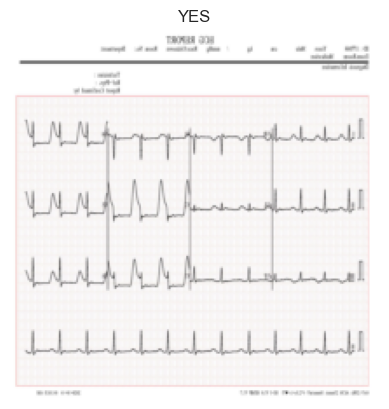

In [271]:
# Show a sample
torch.manual_seed(42)
random_idx = torch.randint(0, len(train_features_batch), size=[1]).item()
img, label = train_features_batch[random_idx], train_labels_batch[random_idx]
plt.imshow(img.permute(1,2,0), cmap=plt.cm.RdYlBu)
plt.title(class_names[label])
plt.axis("Off");
print(f"Image size: {img.shape}")
print(f"Label: {label}, label size: {label.shape}")

In [272]:
# Create a flatten layer
flatten_model = nn.Flatten() # all nn modules function as a model (can do a forward pass)

# Get a single sample
x = train_features_batch[0]

# Flatten the sample
output = flatten_model(x) # perform forward pass

# Print out what happened
print(f"Shape before flattening: {x.shape} -> [color_channels, height, width]")
print(f"Shape after flattening: {output.shape} -> [color_channels, height*width]")

# Try uncommenting below and see what happens
#print(x)
#print(output)

Shape before flattening: torch.Size([3, 212, 212]) -> [color_channels, height, width]
Shape after flattening: torch.Size([3, 44944]) -> [color_channels, height*width]


In [273]:
from torch import nn
class CVD(nn.Module):
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int):
        super().__init__()
        self.layer_stack = nn.Sequential(
            nn.Flatten(), # neural networks like their inputs in vector form
            nn.Linear(in_features=input_shape, out_features=hidden_units), # in_features = number of features in a data sample (784 pixels)
            nn.Linear(in_features=hidden_units, out_features=output_shape)
        )

    def forward(self, x):
        return self.layer_stack(x)

In [274]:
torch.manual_seed(42)

# Need to setup model with input parameters
model_0 = CVD(input_shape=134832, # one for every pixel (28x28)
                              hidden_units=10, # how many units in the hidden layer
                              output_shape=len(class_names) # one for every class
                              )
model_0.to("cpu") # keep model on CPU to begin with

CVD(
  (layer_stack): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=134832, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=2, bias=True)
  )
)

In [275]:
import requests
from pathlib import Path

# Download helper functions from Learn PyTorch repo (if not already downloaded)
if Path("helper_functions.py").is_file():
    print("helper_functions.py already exists, skipping download")
else:
    print("Downloading helper_functions.py")
    # Note: you need the "raw" GitHub URL for this to work
    request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/helper_functions.py")
    with open("helper_functions.py", "wb") as f:
        f.write(request.content)

helper_functions.py already exists, skipping download


In [276]:
# Import accuracy metric
from helper_functions import accuracy_fn # Note: could also use torchmetrics.Accuracy(task = 'multiclass', num_classes=len(class_names)).to(device)

# Setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss() # this is also called "criterion"/"cost function" in some places
optimizer = torch.optim.SGD(params=model_0.parameters(), lr=0.1)

In [277]:
from timeit import default_timer as timer
def print_train_time(start: float, end: float, device: torch.device = None):
    """Prints difference between start and end time.

    Args:
        start (float): Start time of computation (preferred in timeit format).
        end (float): End time of computation.
        device ([type], optional): Device that compute is running on. Defaults to None.

    Returns:
        float: time between start and end in seconds (higher is longer).
    """
    total_time = end - start
    print(f"Train time on {device}: {total_time:.3f} seconds")
    return total_time

# Device Agnostic Code

In [573]:
device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu')
print(f"using device: {device}")

using device: mps


In [279]:
# Create a model with non-linear and linear layers
class CVD1(nn.Module):
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int):
        super().__init__()
        self.layer_stack = nn.Sequential(
            nn.Flatten(), # flatten inputs into single vector
            nn.Linear(in_features=input_shape, out_features=hidden_units),
            nn.ReLU(),
            nn.Linear(in_features=hidden_units, out_features=output_shape),
            nn.ReLU()
        )

    def forward(self, x: torch.Tensor):
        return self.layer_stack(x)

In [280]:
torch.manual_seed(42)
model_1 = CVD1(input_shape=134832, # number of input features
                              hidden_units=10,
                              output_shape=len(class_names) # number of output classes desired
                              ).to(device) # send model to GPU if it's available
next(model_1.parameters()).device # check model device

device(type='mps', index=0)

In [281]:
from helper_functions import accuracy_fn
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=model_1.parameters(),
                            lr=0.1)

In [282]:
def train_step(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               accuracy_fn,
               device: torch.device = device):
    train_loss, train_acc = 0, 0
    model.to(device)
    for batch, (X, y) in enumerate(data_loader):
        # Send data to GPU
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss
        train_acc += accuracy_fn(y_true=y,
                                 y_pred=y_pred.argmax(dim=1)) # Go from logits -> pred labels

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

    # Calculate loss and accuracy per epoch and print out what's happening
    train_loss /= len(data_loader)
    train_acc /= len(data_loader)
    print(f"Train loss: {train_loss:.5f} | Train accuracy: {train_acc:.2f}%")

def test_step(data_loader: torch.utils.data.DataLoader,
              model: torch.nn.Module,
              loss_fn: torch.nn.Module,
              accuracy_fn,
              device: torch.device = device):
    test_loss, test_acc = 0, 0
    model.to(device)
    model.eval() # put model in eval mode
    # Turn on inference context manager
    with torch.inference_mode():
        for X, y in data_loader:
            # Send data to GPU
            X, y = X.to(device), y.to(device)

            # 1. Forward pass
            test_pred = model(X)

            # 2. Calculate loss and accuracy
            test_loss += loss_fn(test_pred, y)
            test_acc += accuracy_fn(y_true=y,
                                    y_pred=test_pred.argmax(dim=1) # Go from logits -> pred labels
                                    )

        # Adjust metrics and print out
        test_loss /= len(data_loader)
        test_acc /= len(data_loader)
        print(f"Test loss: {test_loss:.5f} | Test accuracy: {test_acc:.2f}%\n")

In [283]:
torch.manual_seed(42)

# Measure time
from timeit import default_timer as timer
train_time_start_on_gpu = timer()

epochs = 1
for epoch in tqdm(range(epochs)):
    print(f"Epoch: {epoch}\n---------")
    train_step(data_loader=train_dataloader,
               model=model_1,
               loss_fn=loss_fn,
               optimizer=optimizer,
               accuracy_fn=accuracy_fn
               )
    test_step(data_loader=test_dataloader,
              model=model_1,
              loss_fn=loss_fn,
              accuracy_fn=accuracy_fn
              )

train_time_end_on_gpu = timer()
total_train_time_model_1 = print_train_time(start=train_time_start_on_gpu,
                                            end=train_time_end_on_gpu,
                                            device=device)

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Epoch: 0
---------
Train loss: 0.86423 | Train accuracy: 30.42%


100%|█████████████████████████████████████████████| 1/1 [00:50<00:00, 50.14s/it]

Test loss: 0.69315 | Test accuracy: 30.69%

Train time on mps: 50.159 seconds


In [284]:
# Move values to device
torch.manual_seed(42)
def eval_model(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               accuracy_fn,
               device: torch.device = device):
    """Evaluates a given model on a given dataset.

    Args:
        model (torch.nn.Module): A PyTorch model capable of making predictions on data_loader.
        data_loader (torch.utils.data.DataLoader): The target dataset to predict on.
        loss_fn (torch.nn.Module): The loss function of model.
        accuracy_fn: An accuracy function to compare the models predictions to the truth labels.
        device (str, optional): Target device to compute on. Defaults to device.

    Returns:
        (dict): Results of model making predictions on data_loader.
    """
    loss, acc = 0, 0
    model.eval()
    with torch.inference_mode():
        for X, y in data_loader:
            # Send data to the target device
            X, y = X.to(device), y.to(device)
            y_pred = model(X)
            loss += loss_fn(y_pred, y)
            acc += accuracy_fn(y_true=y, y_pred=y_pred.argmax(dim=1))

        # Scale loss and acc
        loss /= len(data_loader)
        acc /= len(data_loader)
    return {"model_name": model.__class__.__name__, # only works when model was created with a class
            "model_loss": loss.item(),
            "model_acc": acc}

# Calculate model 1 results with device-agnostic code
model_1_results = eval_model(model=model_1, data_loader=test_dataloader,
                             loss_fn=loss_fn, accuracy_fn=accuracy_fn,
                             device=device
                             )
model_1_results

{'model_name': 'CVD1',
 'model_loss': 0.6931462287902832,
 'model_acc': 30.687830687830687}

# Beuilding CNN

In [285]:
import torch
from torch import nn

class CVD2(nn.Module):
    """
    Model architecture for skin disease classification.
    """
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int):
        super().__init__()
        self.block_1 = nn.Sequential(
            nn.Conv2d(in_channels=input_shape,
                      out_channels=hidden_units,
                      kernel_size=3,
                      stride=1,
                      padding=1),  # Keep spatial dimensions unchanged
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_units,
                      out_channels=hidden_units,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)  # Halve the spatial dimensions
        )
        self.block_2 = nn.Sequential(
            nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(hidden_units, hidden_units, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2)  # Halve the spatial dimensions again
        )

        # Calculate the flattened size dynamically
        with torch.no_grad():
            sample_input = torch.randn(1, input_shape, 212, 212)  # Use the specified input size
            x = self.block_1(sample_input)
            x = self.block_2(x)
            flattened_size = x.numel() // x.size(0)  # Calculate features per sample

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=flattened_size, out_features=output_shape)
        )

    def forward(self, x: torch.Tensor):
        x = self.block_1(x)
        x = self.block_2(x)
        x = self.classifier(x)
        return x


# Instantiate the model
torch.manual_seed(42)
model_2 = CVD2(input_shape=3, hidden_units=10, output_shape=len(class_names)).to(device)
model_2


CVD2(
  (block_1): Sequential(
    (0): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_2): Sequential(
    (0): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=28090, out_features=2, bias=True)
  )
)

In [286]:
torch.manual_seed(42)

# Measure time
from timeit import default_timer as timer
train_time_start_model_2 = timer()

# Train and test model
epochs = 1
for epoch in tqdm(range(epochs)):
    print(f"Epoch: {epoch}\n---------")
    train_step(data_loader=train_dataloader,
               model=model_2,
               loss_fn=loss_fn,
               optimizer=optimizer,
               accuracy_fn=accuracy_fn,
               device=device
               )
    test_step(data_loader=test_dataloader,
              model=model_2,
              loss_fn=loss_fn,
              accuracy_fn=accuracy_fn,
              device=device
              )

train_time_end_model_2 = timer()
total_train_time_model_2 = print_train_time(start=train_time_start_model_2,
                                            end=train_time_end_model_2,
                                            device=device)

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Epoch: 0
---------
Train loss: 0.70988 | Train accuracy: 30.55%


100%|█████████████████████████████████████████████| 1/1 [00:51<00:00, 51.32s/it]

Test loss: 0.70977 | Test accuracy: 30.69%

Train time on mps: 51.322 seconds


# Train Resnet 50 on CONV3

In [287]:
import torch
from torch import nn
from torchvision import models

class CVDResNet50(nn.Module):
    """
    Model architecture for skin disease classification using ResNet-50.
    """
    def __init__(self, input_shape: int, output_shape: int, pretrained: bool = True):
        super().__init__()
        # Load ResNet-50 backbone
        self.resnet50 = models.resnet50(pretrained=pretrained)

        # Adjust the first convolutional layer for input_shape if needed
        if input_shape != 3:  # Default ResNet-50 is for 3-channel input
            self.resnet50.conv1 = nn.Conv2d(
                in_channels=input_shape,  # Use the custom input channels
                out_channels=64,
                kernel_size=7,
                stride=2,
                padding=3,
                bias=False
            )

        # Replace the classifier (fully connected) layer
        self.resnet50.fc = nn.Linear(
            in_features=self.resnet50.fc.in_features,  # Default input features
            out_features=output_shape  # Number of output classes
        )

    def forward(self, x: torch.Tensor):
        return self.resnet50(x)


# Instantiate the model
torch.manual_seed(42)
model_resnet50 = CVDResNet50(input_shape=3, output_shape=len(class_names), pretrained=True).to(device)
model_resnet50


CVDResNet50(
  (resnet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
     

# Model Save and Reloading RESNET-50

In [288]:
model_resnet50 = CVDResNet50(input_shape=3, output_shape=len(class_names), pretrained=True).to(device)
model_resnet50

CVDResNet50(
  (resnet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
     

## RESNET 50 conv2d without data augmantation


In [289]:
torch.manual_seed(42)

# Measure time
from timeit import default_timer as timer
train_time_start_model_2 = timer()

# Train and test model
epochs = 1
for epoch in tqdm(range(epochs)):
    print(f"Epoch: {epoch}\n---------")
    train_step(data_loader=train_dataloader,
               model=model_resnet50,
               loss_fn=loss_fn,
               optimizer=optimizer,
               accuracy_fn=accuracy_fn,
               device=device
               )
    test_step(data_loader=test_dataloader,
              model=model_resnet50,
              loss_fn=loss_fn,
              accuracy_fn=accuracy_fn,
              device=device
              )

train_time_end_model_2 = timer()
total_train_time_model_2 = print_train_time(start=train_time_start_model_2,
                                            end=train_time_end_model_2,
                                            device=device)

  0%|                                                     | 0/1 [00:00<?, ?it/s]

Epoch: 0
---------
Train loss: 0.89061 | Train accuracy: 30.55%


100%|█████████████████████████████████████████████| 1/1 [01:23<00:00, 83.16s/it]

Test loss: 0.90049 | Test accuracy: 30.69%

Train time on mps: 83.162 seconds


# Resnet 50 with Data Augmentation

## Augmenting Data then calling the model

In [290]:
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, WeightedRandomSampler
import torch
import numpy as np
from collections import Counter
import torch.nn as nn
import torch.nn.functional as F

# Data Augmentation
data_transforms2 = {
    "train": transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomResizedCrop(size=212, scale=(0.9, 1.0)),
        transforms.ToTensor(),
        transforms.RandomErasing(scale=(0.02, 0.2), value=0),
        transforms.Normalize(mean=[0.485], std=[0.229])
    ]),
    "test": transforms.Compose([
        transforms.Resize((212, 212)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485], std=[0.229])
    ])
}

# Load Datasets
train_dataset = datasets.ImageFolder(root=train_dir, transform=data_transforms2["train"])
test_dataset = datasets.ImageFolder(root=test_dir, transform=data_transforms2["test"])

# Analyze class distribution
class_counts = Counter(train_dataset.targets)
num_classes = len(class_counts)
print("Class distribution in training set:", class_counts)

# Create sample weights to balance the class distribution
class_weights = [1.0 / class_counts[c] for c in class_counts.keys()]
sample_weights = [class_weights[label] for label in train_dataset.targets]

sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

# Data Loaders
train_dataloader = DataLoader(train_dataset, batch_size=10, sampler=sampler)
test_dataloader = DataLoader(test_dataset, batch_size=10, shuffle=False)

# Define focal loss
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.1, gamma=2.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return focal_loss.mean()

criterion = FocalLoss()

print("Data loaders created with class balancing and Focal Loss function.")


Class distribution in training set: Counter({1: 516, 0: 227})
Data loaders created with class balancing and Focal Loss function.


In [291]:
from torchvision.models import resnet50
import torch.nn as nn
import torch.optim as optim

# Load pre-trained ResNet-50
model_resnet50 = resnet50(pretrained=True)

# Freeze the feature extractor layers
for param in model_resnet50.parameters():
    param.requires_grad = False

# Replace the classifier (fc layer) to match the number of classes in your dataset
num_classes = len(train_dataset.classes)  # Number of classes in your dataset

# Enhanced fully connected (fc) layers for better feature extraction
model_resnet50.fc = nn.Sequential(
    nn.Linear(model_resnet50.fc.in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

# Device setup
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet50 = model_resnet50.to(device)

# Define optimizer
optimizer = optim.Adam(model_resnet50.fc.parameters(), lr=1e-4, weight_decay=1e-4)

# Scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, verbose=True)


In [292]:
# Loss function
#criterion = nn.CrossEntropyLoss()

# Optimizer (for the classifier parameters)
#optimizer = optim.Adam(model_resnet50.fc.parameters(), lr=1e-4, weight_decay=1e-5)

# Scheduler for dynamic learning rate
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, verbose=True)


# Resenet 50 with early stoping

In [293]:
from tqdm.auto import tqdm
import numpy as np
import torch

# Training and Evaluation
epochs = 100
patience = 10  # Number of epochs to wait for improvement in validation loss

# Initialize accumulators for final statistics
total_train_losses = []
total_train_correct = 0
total_train_samples = 0

total_val_losses = []
total_val_correct = 0
total_val_samples = 0

best_val_loss = float('inf')  # Initialize to infinity
patience_counter = 3  # To count the number of epochs with no improvement
model_resnet50.train()

for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}\n{'-'*20}")

    # -----------------
    # Training Phase
    # -----------------
    train_losses, train_correct, total_train_samples_epoch = [], 0, 0

    for images, labels in tqdm(train_dataloader, desc="Training"):
        images, labels = images.to(device), labels.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model_resnet50(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())

        # Calculate accuracy
        _, preds = torch.max(outputs, 1)
        train_correct += (preds == labels).sum().item()
        total_train_samples_epoch += labels.size(0)

    # Update accumulators
    total_train_losses.extend(train_losses)
    total_train_correct += train_correct
    total_train_samples += total_train_samples_epoch

    # Training metrics
    train_loss_mean = np.mean(train_losses)
    train_loss_std = np.std(train_losses)
    train_accuracy = train_correct / total_train_samples_epoch if total_train_samples_epoch > 0 else 0.0

    print(f"Train Loss: Mean={train_loss_mean:.4f}, Std={train_loss_std:.4f}")
    print(f"Train Accuracy: {train_accuracy*100:.2f}%")

    # -----------------
    # Evaluation Phase
    # -----------------
    model_resnet50.eval()
    val_losses, val_correct, total_val_samples_epoch = [], 0, 0

    with torch.no_grad():
        for images, labels in tqdm(test_dataloader, desc="Validation"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model_resnet50(images)
            loss = criterion(outputs, labels)

            val_losses.append(loss.item())

            # Calculate accuracy
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            total_val_samples_epoch += labels.size(0)

    # Update accumulators
    total_val_losses.extend(val_losses)
    total_val_correct += val_correct
    total_val_samples += total_val_samples_epoch

    # Validation metrics
    val_loss_mean = np.mean(val_losses)
    val_loss_std = np.std(val_losses)
    val_accuracy = val_correct / total_val_samples_epoch if total_val_samples_epoch > 0 else 0.0

    print(f"Validation Loss: Mean={val_loss_mean:.4f}, Std={val_loss_std:.4f}")
    print(f"Validation Accuracy: {val_accuracy*100:.2f}%")

    # Check if validation loss improved
    if val_loss_mean < best_val_loss:
        best_val_loss = val_loss_mean
        patience_counter = 0
        # Save the best model
        torch.save(model_resnet50.state_dict(), 'best_resnet50.pth')
        print("Validation loss improved, model saved.")
    else:
        patience_counter += 1
        print(f"No improvement in validation loss. Patience counter: {patience_counter}/{patience}")

    # Early stopping: Stop if no improvement for `patience` epochs
    if patience_counter >= patience:
        print("Early stopping triggered!")
        break

    # Step scheduler
    scheduler.step(val_loss_mean)

# -------------------------
# Final Averaged Metrics
# -------------------------
# Final Training Metrics
final_train_loss_mean = np.mean(total_train_losses)
final_train_loss_std = np.std(total_train_losses)
final_train_accuracy = total_train_correct / total_train_samples if total_train_samples > 0 else 0.0

print(f"\nFinal Training Loss: Mean={final_train_loss_mean:.4f}, Std={final_train_loss_std:.4f}")
print(f"Final Training Accuracy: {final_train_accuracy*100:.2f}%")

# Final Validation Metrics
final_val_loss_mean = np.mean(total_val_losses)
final_val_loss_std = np.std(total_val_losses)
final_val_accuracy = total_val_correct / total_val_samples if total_val_samples > 0 else 0.0

print(f"Final Validation Loss: Mean={final_val_loss_mean:.4f}, Std={final_val_loss_std:.4f}")
print(f"Final Validation Accuracy: {final_val_accuracy*100:.2f}%")


Epoch 1/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:29<00:00,  2.53it/s]


Train Loss: Mean=0.0176, Std=0.0027
Train Accuracy: 54.78%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.28it/s]


Validation Loss: Mean=0.0174, Std=0.0022
Validation Accuracy: 47.62%
Validation loss improved, model saved.
Epoch 2/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:23<00:00,  3.26it/s]


Train Loss: Mean=0.0158, Std=0.0016
Train Accuracy: 66.76%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.55it/s]


Validation Loss: Mean=0.0159, Std=0.0039
Validation Accuracy: 60.85%
Validation loss improved, model saved.
Epoch 3/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.28it/s]


Train Loss: Mean=0.0142, Std=0.0027
Train Accuracy: 71.74%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.51it/s]


Validation Loss: Mean=0.0154, Std=0.0059
Validation Accuracy: 65.61%
Validation loss improved, model saved.
Epoch 4/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.28it/s]


Train Loss: Mean=0.0121, Std=0.0026
Train Accuracy: 78.87%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.55it/s]


Validation Loss: Mean=0.0114, Std=0.0044
Validation Accuracy: 79.37%
Validation loss improved, model saved.
Epoch 5/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:23<00:00,  3.26it/s]


Train Loss: Mean=0.0130, Std=0.0036
Train Accuracy: 73.62%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.46it/s]


Validation Loss: Mean=0.0111, Std=0.0045
Validation Accuracy: 81.48%
Validation loss improved, model saved.
Epoch 6/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.30it/s]


Train Loss: Mean=0.0128, Std=0.0048
Train Accuracy: 76.31%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.46it/s]


Validation Loss: Mean=0.0137, Std=0.0064
Validation Accuracy: 70.37%
No improvement in validation loss. Patience counter: 1/10
Epoch 7/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.30it/s]


Train Loss: Mean=0.0108, Std=0.0039
Train Accuracy: 82.77%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.53it/s]


Validation Loss: Mean=0.0239, Std=0.0174
Validation Accuracy: 57.67%
No improvement in validation loss. Patience counter: 2/10
Epoch 8/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:23<00:00,  3.23it/s]


Train Loss: Mean=0.0104, Std=0.0035
Train Accuracy: 83.18%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.41it/s]


Validation Loss: Mean=0.0105, Std=0.0056
Validation Accuracy: 82.01%
Validation loss improved, model saved.
Epoch 9/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:23<00:00,  3.25it/s]


Train Loss: Mean=0.0102, Std=0.0039
Train Accuracy: 82.10%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.56it/s]


Validation Loss: Mean=0.0130, Std=0.0085
Validation Accuracy: 72.49%
No improvement in validation loss. Patience counter: 1/10
Epoch 10/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.30it/s]


Train Loss: Mean=0.0093, Std=0.0042
Train Accuracy: 83.71%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.56it/s]


Validation Loss: Mean=0.0142, Std=0.0105
Validation Accuracy: 71.43%
No improvement in validation loss. Patience counter: 2/10
Epoch 11/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.28it/s]


Train Loss: Mean=0.0091, Std=0.0042
Train Accuracy: 85.73%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.37it/s]


Validation Loss: Mean=0.0132, Std=0.0100
Validation Accuracy: 74.60%
No improvement in validation loss. Patience counter: 3/10
Epoch 12/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.29it/s]


Train Loss: Mean=0.0086, Std=0.0041
Train Accuracy: 86.94%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.60it/s]


Validation Loss: Mean=0.0128, Std=0.0096
Validation Accuracy: 79.37%
No improvement in validation loss. Patience counter: 4/10
Epoch 13/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.33it/s]


Train Loss: Mean=0.0087, Std=0.0035
Train Accuracy: 85.73%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.53it/s]


Validation Loss: Mean=0.0154, Std=0.0123
Validation Accuracy: 72.49%
No improvement in validation loss. Patience counter: 5/10
Epoch 14/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.30it/s]


Train Loss: Mean=0.0088, Std=0.0042
Train Accuracy: 84.66%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.55it/s]


Validation Loss: Mean=0.0120, Std=0.0089
Validation Accuracy: 80.42%
No improvement in validation loss. Patience counter: 6/10
Epoch 15/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:23<00:00,  3.25it/s]


Train Loss: Mean=0.0090, Std=0.0040
Train Accuracy: 84.39%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.61it/s]


Validation Loss: Mean=0.0128, Std=0.0098
Validation Accuracy: 78.84%
No improvement in validation loss. Patience counter: 7/10
Epoch 16/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.33it/s]


Train Loss: Mean=0.0087, Std=0.0034
Train Accuracy: 83.58%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.56it/s]


Validation Loss: Mean=0.0130, Std=0.0100
Validation Accuracy: 77.25%
No improvement in validation loss. Patience counter: 8/10
Epoch 17/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.34it/s]


Train Loss: Mean=0.0093, Std=0.0043
Train Accuracy: 84.25%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.54it/s]


Validation Loss: Mean=0.0134, Std=0.0104
Validation Accuracy: 77.78%
No improvement in validation loss. Patience counter: 9/10
Epoch 18/100
--------------------


Training: 100%|█████████████████████████████████| 75/75 [00:22<00:00,  3.33it/s]


Train Loss: Mean=0.0086, Std=0.0033
Train Accuracy: 86.27%


Validation: 100%|███████████████████████████████| 19/19 [00:05<00:00,  3.59it/s]

Validation Loss: Mean=0.0135, Std=0.0105
Validation Accuracy: 77.78%
No improvement in validation loss. Patience counter: 10/10
Early stopping triggered!

Final Training Loss: Mean=0.0109, Std=0.0045
Final Training Accuracy: 79.74%
Final Validation Loss: Mean=0.0140, Std=0.0096
Final Validation Accuracy: 72.63%


In [294]:
image_model_mean = (final_train_loss_mean + final_val_loss_mean)/2.0
image_model_std = (final_train_loss_std + final_val_loss_std)/2.0
image_model_accuracy = (final_train_accuracy + final_val_accuracy)/2.0
print(image_model_mean, image_model_std, image_model_accuracy)


0.012478720296769299 0.007043252120098718 0.7618901240106564


In [295]:
# Import tqdm for progress bar
from tqdm.auto import tqdm

# 1. Make predictions with trained model
y_preds = []
model_resnet50.eval()
with torch.inference_mode():
    for X, y in tqdm(test_dataloader, desc="Making predictions"):
        # Send data and targets to target device
        X, y = X.to(device), y.to(device)
        # Do the forward pass
        y_logit = model_resnet50(X)
        # Turn predictions from logits -> prediction probabilities -> predictions labels
        y_pred = torch.softmax(y_logit, dim=1).argmax(dim=1) # note: perform softmax on the "logits" dimension, not "batch" dimension (in this case we have a batch size of 32, so can perform on dim=1)
        # Put predictions on CPU for evaluation
        y_preds.append(y_pred.cpu())
# Concatenate list of predictions into a tensor
y_pred_tensor = torch.cat(y_preds)

Making predictions: 100%|███████████████████████| 19/19 [00:05<00:00,  3.58it/s]


In [296]:
# See if torchmetrics exists, if not, install it
try:
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
    assert int(mlxtend.__version__.split(".")[1]) >= 19, "mlxtend verison should be 0.19.0 or higher"
except:
    !pip install -q torchmetrics -U mlxtend # <- Note: If you're using Google Colab, this may require restarting the runtime
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")

mlxtend version: 0.23.3


In [297]:
y_pred_tensor

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1,
        1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1,
        1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0])

In [298]:
import torch

# Check if y_pred_tensor is a PyTorch tensor
if isinstance(y_pred_tensor, torch.Tensor):
    print("y_pred_tensor is a PyTorch tensor.")
else:
    print("y_pred_tensor is NOT a PyTorch tensor.")


y_pred_tensor is a PyTorch tensor.


In [299]:
type(test_data.targets)


list

In [300]:
# Import mlxtend upgraded version
import mlxtend
print(mlxtend.__version__)
assert int(mlxtend.__version__.split(".")[1]) >= 19 # should be version 0.19.0 or higher


0.23.3


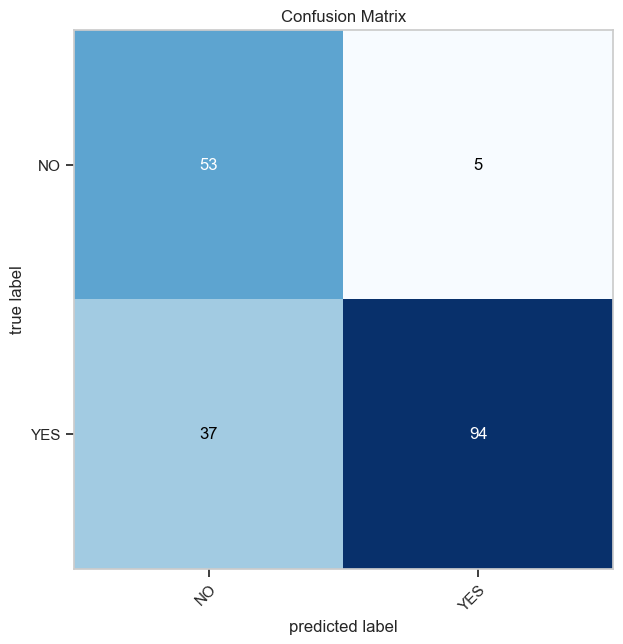

In [301]:
import torch
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix
import matplotlib.pyplot as plt

# 1. Ensure both y_pred_tensor and test_data.targets are PyTorch tensors
y_pred_tensor = torch.tensor(y_pred_tensor)  # If it's a list, convert to tensor
true_labels_tensor = torch.tensor(test_data.targets)  # Convert test_data.targets (list) to tensor

# 2. Create confusion matrix instance
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')

# 3. Compute the confusion matrix
confmat_tensor = confmat(preds=y_pred_tensor, target=true_labels_tensor)

# 4. Plot the confusion matrix
fig, ax = plot_confusion_matrix(
    conf_mat=confmat_tensor.numpy(),  # Convert to NumPy for plotting
    class_names=class_names,          # Replace with your class names
    figsize=(10, 7)                   # Adjust figure size as needed
)

# Display the plot
plt.title("Confusion Matrix")
plt.show()


In [302]:
from sklearn.metrics import classification_report
print(classification_report(true_labels_tensor, y_pred_tensor))


              precision    recall  f1-score   support

           0       0.59      0.91      0.72        58
           1       0.95      0.72      0.82       131

    accuracy                           0.78       189
   macro avg       0.77      0.82      0.77       189
weighted avg       0.84      0.78      0.79       189



In [303]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(true_labels_tensor, y_pred_tensor)
true_positives = np.diag(cm)  # Diagonal of confusion matrix
class_totals = cm.sum(axis=1)  # Total samples for each class (row sums)
per_class_accuracy = true_positives / class_totals
#target_labels = ["Class 0", "Class 1", "Class 2", "Class 3", "Class 4", "Class 5"]
image_label_accuracy=[]
for label, accuracy in zip(class_names, per_class_accuracy):
    print(f"{label} - Accuracy: {accuracy:.4f}")
    image_label_accuracy.append(accuracy)



NO - Accuracy: 0.9138
YES - Accuracy: 0.7176


In [304]:
image_label_accuracy

[0.9137931034482759, 0.7175572519083969]

# SAVING MODEL TRAINING PROCESS FOR LATER RESUMING TRAINING FROM LEFT

In [305]:
# Specify the path where the model will be saved
model_save_path = "CVD_resnet50.pth"

# Save the model's state dictionary and optimizer state
torch.save({
    'model_state_dict': model_resnet50.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'epoch': epoch  # Save the current epoch for resuming training later
}, model_save_path)

print(f"Model saved to {model_save_path}")


Model saved to CVD_resnet50.pth


In [306]:
# Load the model and optimizer state from the saved file
checkpoint = torch.load(model_save_path)

# Load the model's state dictionary
model_resnet50.load_state_dict(checkpoint['model_state_dict'])

# Load the optimizer's state (optional, only for resuming training)
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# Resume training from the saved epoch
start_epoch = checkpoint['epoch'] + 1  # Start from the next epoch

print(f"Model loaded from {model_save_path}, resuming from epoch {start_epoch}")


Model loaded from CVD_resnet50.pth, resuming from epoch 18


# SAVING AND LOADING MODEL

In [307]:
from pathlib import Path
#create model directory
Model_Path = Path("resnet50_cvd_model")
Model_Path.mkdir(exist_ok=True,parents=True)
#create model save path
Model_Name = "cvd_image_model_resnet50.pth"
Model_Save_Path = Model_Path / Model_Name
#Save the model State dict
print(f"Model are saving on {Model_Save_Path}")
torch.save(obj=model_resnet50.state_dict(),f=Model_Save_Path)


Model are saving on resnet50_cvd_model/cvd_image_model_resnet50.pth


In [571]:
Model_Save_Path

PosixPath('resnet50_cvd_model/cvd_image_model_resnet50.pth')

In [574]:
import torch
import torch.nn as nn
import torchvision.models as models

# Define the device
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the number of classes
num_classes = 2  # Adjust this based on your specific task

# Initialize the ResNet-50 model
loaded_model_resnet50 = models.resnet50(pretrained=False)

# Define the original architecture used when the state dictionary was saved
in_features = loaded_model_resnet50.fc.in_features
loaded_model_resnet50.fc = nn.Sequential(
    nn.Linear(in_features, 512),  # Intermediate layer
    nn.ReLU(),
    nn.Dropout(0.5),  # Regularization
    nn.Linear(512, 256),  # Intermediate layer
    nn.ReLU(),
    nn.Dropout(0.5),  # Regularization
    nn.Linear(256, num_classes)  # Output layer
)

# Load the saved state dictionary
#Model_Save_Path = 'path/to/saved/model.pth'  # Adjust this path
loaded_model_resnet50.load_state_dict(torch.load('resnet50_cvd_model/cvd_image_model_resnet50.pth'))

# Move the model to the correct device
loaded_model_resnet50 = loaded_model_resnet50.to(device)

# Set the model to evaluation mode
loaded_model_resnet50.eval()

print("Model loaded and ready for evaluation.")

Model loaded and ready for evaluation.


In [575]:
# Import tqdm for progress bar
from tqdm.auto import tqdm

# 1. Make predictions with trained model
y_preds = []
loaded_model_resnet50.eval()
with torch.inference_mode():
    for X, y in tqdm(test_dataloader, desc="Making predictions"):
        # Send data and targets to target device
        X, y = X.to(device), y.to(device)
        # Do the forward pass
        y_logit = loaded_model_resnet50(X)
        # Turn predictions from logits -> prediction probabilities -> predictions labels
        y_pred = torch.softmax(y_logit, dim=1).argmax(dim=1) # note: perform softmax on the "logits" dimension, not "batch" dimension (in this case we have a batch size of 32, so can perform on dim=1)
        # Put predictions on CPU for evaluation
        y_preds.append(y_pred.cpu())
# Concatenate list of predictions into a tensor
y_pred_tensor2 = torch.cat(y_preds)

Making predictions: 100%|█████████████████████| 19/19 [00:05<00:00,  3.35it/s]


In [650]:
y_pred_tensor2
#y_pred_tensor==y_pred_tensor2

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1,
        1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1,
        1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0])

# Late Fusion Code

In [577]:
print(f"image model mean : {image_model_mean} and image model std : {image_model_std}")

image model mean : 0.012478720296769299 and image model std : 0.007043252120098718


In [578]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming y_true contains the true labels and y_pred_tensor2 contains the predicted labels
# Convert y_pred_tensor2 to a NumPy array if it is a tensor
y_pred = y_pred_tensor2.numpy() if hasattr(y_pred_tensor2, 'numpy') else y_pred_tensor2
y_true = true_labels_tensor.numpy() if hasattr(true_labels_tensor, 'numpy') else true_labels_tensor
# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred)

# Calculate precision
precision = precision_score(y_true, y_pred, average='weighted')

# Calculate recall
recall = recall_score(y_true, y_pred, average='weighted')

# Calculate F1 score
f1 = f1_score(y_true, y_pred, average='weighted')

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Confusion Matrix:\n{conf_matrix}')

Accuracy: 0.7777777777777778
Precision: 0.8388327721661054
Recall: 0.7777777777777778
F1 Score: 0.7863428646037341
Confusion Matrix:
[[53  5]
 [37 94]]


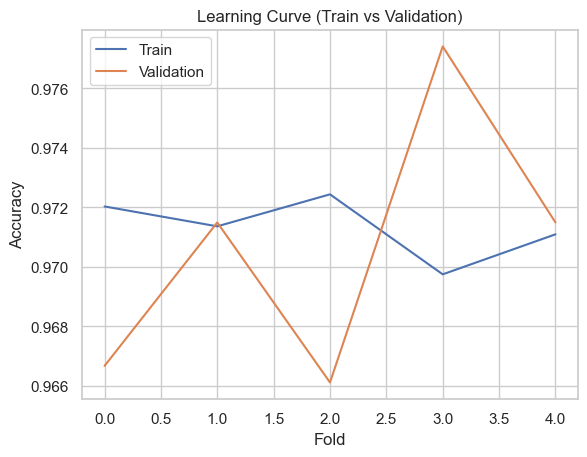


Gradient Boosting Evaluation:
Accuracy: 0.98
Confusion Matrix:
[[1740   25]
 [  33  527]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1765
           1       0.95      0.94      0.95       560

    accuracy                           0.98      2325
   macro avg       0.97      0.96      0.97      2325
weighted avg       0.97      0.98      0.97      2325

Log Loss: 0.07
RMSE: 0.86

Cross-Validation Accuracy: Mean = 0.97, Std = 0.00


In [567]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, classification_report, log_loss, mean_squared_error
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt

# Assuming X_train and y_train are already defined

# Initialize Stratified K-Fold cross-validation
stratified_kfold = StratifiedKFold(n_splits=5)

# Initialize list for training and validation scores
train_scores, val_scores = [], []

# Loop through each fold in Stratified K-Fold
for train_idx, val_idx in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]  # Use iloc[] to index rows
    y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]  # Use iloc[] to index rows
    
    # Initialize and train the Gradient Boosting model
    model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1)
    model.fit(X_train_fold, y_train_fold)
    
    # Get training and validation accuracy scores
    train_scores.append(model.score(X_train_fold, y_train_fold))
    val_scores.append(model.score(X_val_fold, y_val_fold))

# Plot learning curve (Train vs Validation accuracy)
plt.plot(train_scores, label='Train')
plt.plot(val_scores, label='Validation')
plt.legend()
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Learning Curve (Train vs Validation)')
plt.show()

# Now, let's evaluate the model on the whole training data
model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1)
model.fit(X_train, y_train)

# Predict on the test data (assuming X_test and y_test are defined)
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)

# Calculate accuracy, confusion matrix, classification report, and log loss
score = model.score(X_test, y_test)
cm = confusion_matrix(y_test, y_pred)
report = classification_report(y_test, y_pred)
ll = log_loss(y_test, y_pred_proba)

# Calculate RMSE based on predicted probabilities
y_pred_proba_max = np.max(y_pred_proba, axis=1)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_proba_max))

# Print results
print("\nGradient Boosting Evaluation:")
print(f"Accuracy: {score:.2f}")
print(f"Confusion Matrix:\n{cm}")
print(f"Classification Report:\n{report}")
print(f"Log Loss: {ll:.2f}")
print(f"RMSE: {rmse:.2f}")

# Perform cross-validation to get the mean and std of the accuracy
cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')
print(f"\nCross-Validation Accuracy: Mean = {cv_scores.mean():.2f}, Std = {cv_scores.std():.2f}")



In [601]:
import pickle

# Save the trained model
with open('gradient_boosting_model.pkl', 'wb') as f:
    pickle.dump(model, f)
print("Model saved as 'gradient_boosting_model.pkl' using pickle.")




Model saved as 'gradient_boosting_model.pkl' using pickle.

Loaded Model Accuracy: 0.98


loading the model

In [631]:
# Load the saved model
with open('gradient_boosting_model.pkl', 'rb') as f:
    loaded_model_numeric = pickle.load(f)

# Verify the loaded model by predicting and evaluating
loaded_score = loaded_model_numeric.score(X_test, y_test)
print(f"\nLoaded Model Accuracy: {loaded_score:.2f}")



Loaded Model Accuracy: 0.98


In [579]:
test_data

Dataset ImageFolder
    Number of datapoints: 189
    Root location: /Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Test
    StandardTransform
Transform: Compose(
               Resize(size=(212, 212), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )

# Making synthetic Test multimodal data 

Since i am using ImageFolder, we can load the test dataset with transformations as follows:




In [580]:
from torchvision import datasets, transforms
import torch
import pandas as pd

# Define transformation
transform = transforms.Compose([
    transforms.Resize((212, 212)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

# Load image dataset
image_dataset = datasets.ImageFolder('/Users/ziaulhoque/Desktop/pytorchPractise/CVD_IMAGE/Image/Test', transform=transform)


We can separate the tensor data and binary labels from the dataset.



In [581]:
image_data = []
image_labels = []

for img, label in image_dataset:
    image_data.append(img)
    image_labels.append(label)  # Assuming label 0 for 'no', 1 for 'yes'

# Convert to tensors
image_labels_tensor = torch.tensor(image_labels)


In [594]:
yes_image_indices = (image_labels_tensor == 1).nonzero(as_tuple=True)[0]
no_image_indices = (image_labels_tensor == 0).nonzero(as_tuple=True)[0]

# Prepare separate lists for 'yes' and 'no' image samples
yes_image_data = [image_data[idx] for idx in yes_image_indices]
no_image_data = [image_data[idx] for idx in no_image_indices]


In [642]:
no_image_indices

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
        54, 55, 56, 57])

prepare numeric data

In [607]:
len(yes_image_data), len(no_image_data)

(131, 58)

In [614]:
# Combine yes_image_data and no_image_data while maintaining the order
image_sampled = yes_image_data + no_image_data

In [593]:
X_test.head(),y_test.head()

(       MI_FCHD  ANYCHD  STROKE  HOSPMI  ANGINA  PREVMI  PREVCHD  SYSBP  AGE  \
 5071         1       1       0       1       1       1        1    170   50   
 10089        0       0       0       0       0       0        0    172   74   
 119          0       0       0       0       0       0        0    160   59   
 2145         1       1       0       0       0       0        0    117   57   
 856          0       0       0       0       0       0        0    132   49   
 
        PREVHYP  PREVAP  PREVSTRK  SEX  
 5071         1       1         0    1  
 10089        1       0         0    2  
 119          1       0         0    2  
 2145         0       0         0    1  
 856          0       0         0    2  ,
 5071     1
 10089    0
 119      0
 2145     1
 856      0
 Name: CVD, dtype: int64)

In [613]:


# Assuming X_test and y_test are your DataFrame and labels
yes_numeric = X_test[y_test == 1].reset_index(drop=True)

# Randomly select 131 rows from yes_numeric
yes_numeric_sampled = yes_numeric.sample(n=131, random_state=42).reset_index(drop=True)
yes_numeric_sampled['label'] = 1
#print(yes_numeric_sampled)
no_numeric = X_test[y_test == 0].reset_index(drop=True)
no_numeric_sampled = no_numeric.sample(n=58, random_state=42).reset_index(drop=True)
no_numeric_sampled['label'] = 0

numeric_sampled = pd.concat([yes_numeric_sampled, no_numeric_sampled], ignore_index=True)
numeric_sampled.head()

,MI_FCHD,ANYCHD,STROKE,HOSPMI,ANGINA,PREVMI,PREVCHD,SYSBP,AGE,PREVHYP,PREVAP,PREVSTRK,SEX,label
0,1,1,0,0,0,0,0,122,50,0,0,0,1,1
1,1,1,0,0,0,0,0,141,56,1,0,0,1,1
2,1,1,0,1,0,0,0,141,40,1,0,0,1,1
3,1,1,0,0,0,0,0,170,75,1,0,0,1,1
4,1,1,0,1,0,0,0,128,58,0,0,0,1,1


In [634]:
def combine_dempster_rule(image_prob_0, image_prob_1, numeric_prob_0, numeric_prob_1):
    """
    Combines the probabilities for Class 0 and Class 1 using Dempster's rule.

    Parameters:
    - image_prob_0 (float): Image evidence probability for Class 0.
    - image_prob_1 (float): Image evidence probability for Class 1.
    - numeric_prob_0 (float): Numeric evidence probability for Class 0.
    - numeric_prob_1 (float): Numeric evidence probability for Class 1.

    Returns:
    - combined_prob_0 (float): Combined probability for Class 0.
    - combined_prob_1 (float): Combined probability for Class 1.
    """
    # Calculate the conflict K
    conflict = (image_prob_0 * numeric_prob_1) + (image_prob_1 * numeric_prob_0)

    # Ensure conflict is not 1 to avoid division by zero
    if conflict == 1:
        raise ValueError("Total conflict encountered, combination not possible.")

    normalization_factor = 1 - conflict

    # Compute the combined probabilities
    combined_prob_0 = (image_prob_0 * numeric_prob_0) / normalization_factor
    combined_prob_1 = (image_prob_1 * numeric_prob_1) / normalization_factor

    return combined_prob_0, combined_prob_1

In [ ]:
# Import tqdm for progress bar
from tqdm.auto import tqdm

# 1. Make predictions with trained model
y_preds = []
loaded_model_resnet50.eval()
with torch.inference_mode():
    for X, y in tqdm(test_dataloader, desc="Making predictions"):
        # Send data and targets to target device
        X, y = X.to(device), y.to(device)
        # Do the forward pass
        y_logit = loaded_model_resnet50(X)
        # Turn predictions from logits -> prediction probabilities -> predictions labels
        y_pred = torch.softmax(y_logit, dim=1).argmax(dim=1) # note: perform softmax on the "logits" dimension, not "batch" dimension (in this case we have a batch size of 32, so can perform on dim=1)
        # Put predictions on CPU for evaluation
        y_preds.append(y_pred.cpu())
# Concatenate list of predictions into a tensor
y_pred_tensor2 = torch.cat(y_preds)

In [652]:
combined_predictions = []
actual_labels = []
for (i, row), (j, img) in zip(numeric_sampled.iterrows(), enumerate(image_sampled)):
    numeric_data = row.values[:-1]  # Exclude the label column
    label = row['label']
    actual_labels.append(label)
    # Ensure the model is in evaluation mode
    loaded_model_resnet50.eval()
    
    # Process the image
    img = img.to(device)
    img = img.unsqueeze(0)  # Add batch dimension
    
    # Get prediction probabilities
    with torch.no_grad():
        y_logit = loaded_model_resnet50(img)
        y_probabilities = torch.softmax(y_logit, dim=1)  # Get class probabilities

    # Extract probabilities for class 0 and class 1
    prob_0_img, prob_1_img = y_probabilities.squeeze().cpu().tolist()
    
    #for numeric modeL
    prob_0_numeric, prob_1_numeric = loaded_model_numeric.predict_proba(numeric_data.reshape(1, -1))[0]
    print(f"Sample {j}: Image Class 0 Probability = {prob_0_img:.4f}, Image Class 1 Probability = {prob_1_img:.4f}")
    print(f"Sample {j}: Numeric Class 0 Probability = {prob_0_numeric:.4f}, Numeric Class 1 Probability = {prob_1_numeric:.4f}")
    print(f"Sample {j}: Actual Label = {label}")
    combined_prob_0, combined_prob_1 = combine_dempster_rule(prob_0_img, prob_1_img, prob_0_numeric, prob_1_numeric)
    if combined_prob_0 > combined_prob_1:
        combined_predictions.append(0)
    else:
        combined_predictions.append(1)


Sample 0: Image Class 0 Probability = 0.5348, Image Class 1 Probability = 0.4652
Sample 0: Numeric Class 0 Probability = 0.0054, Numeric Class 1 Probability = 0.9946
Sample 0: Actual Label = 1.0
Sample 1: Image Class 0 Probability = 0.6365, Image Class 1 Probability = 0.3635
Sample 1: Numeric Class 0 Probability = 0.0049, Numeric Class 1 Probability = 0.9951
Sample 1: Actual Label = 1.0
Sample 2: Image Class 0 Probability = 0.5284, Image Class 1 Probability = 0.4716
Sample 2: Numeric Class 0 Probability = 0.0210, Numeric Class 1 Probability = 0.9790
Sample 2: Actual Label = 1.0
Sample 3: Image Class 0 Probability = 0.5939, Image Class 1 Probability = 0.4061
Sample 3: Numeric Class 0 Probability = 0.0036, Numeric Class 1 Probability = 0.9964
Sample 3: Actual Label = 1.0
Sample 4: Image Class 0 Probability = 0.5269, Image Class 1 Probability = 0.4731
Sample 4: Numeric Class 0 Probability = 0.0265, Numeric Class 1 Probability = 0.9735
Sample 4: Actual Label = 1.0
Sample 5: Image Class 0 P

In [635]:
# Example usage
image_prob_0 = 0.5348
image_prob_1 = 0.4652
numeric_prob_0 = 0.0054
numeric_prob_1 = 0.9946

combined_prob_0, combined_prob_1 = combine_dempster_rule(image_prob_0, image_prob_1, numeric_prob_0, numeric_prob_1)
print(f"Combined Probability for Class 0: {combined_prob_0:.4f}")
print(f"Combined Probability for Class 1: {combined_prob_1:.4f}")

Combined Probability for Class 0: 0.0062
Combined Probability for Class 1: 0.9938


# Calculate confusion matrix and accuracy
conf_matrix = confusion_matrix(actual_labels, combined_predictions)
accuracy = accuracy_score(actual_labels, combined_predictions)

print("Confusion Matrix:")
print(conf_matrix)
print(f"Accuracy: {accuracy:.4f}")

In [653]:
# Calculate confusion matrix and accuracy
conf_matrix = confusion_matrix(actual_labels, combined_predictions)
accuracy = accuracy_score(actual_labels, combined_predictions)

print("Confusion Matrix:")
print(conf_matrix)
print(f"Accuracy: {accuracy:.4f}")

Confusion Matrix:
[[ 58   0]
 [ 10 121]]
Accuracy: 0.9471


True Negatives: 58
False Positives: 0
False Negatives: 10
True Positives: 121
Confusion Matrix:
[[ 58   0]
 [ 10 121]]
Accuracy: 0.9471
Precision: 1.0000
Recall: 0.9237
F1 Score: 0.9603

Classification Report:
              precision    recall  f1-score   support

         0.0       0.85      1.00      0.92        58
         1.0       1.00      0.92      0.96       131

    accuracy                           0.95       189
   macro avg       0.93      0.96      0.94       189
weighted avg       0.95      0.95      0.95       189



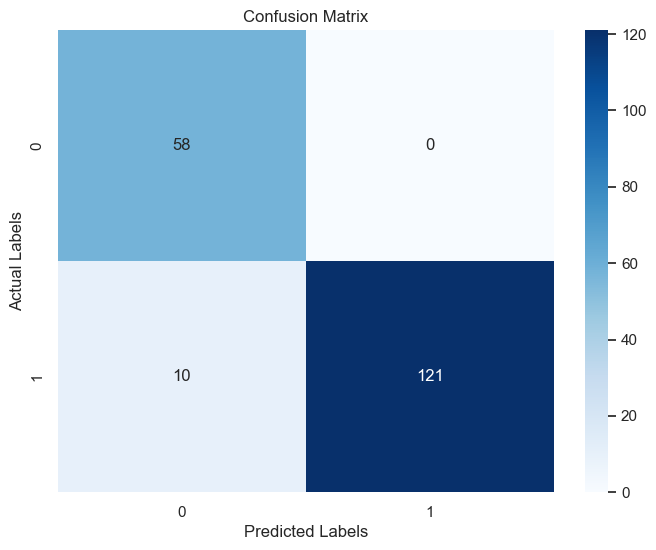

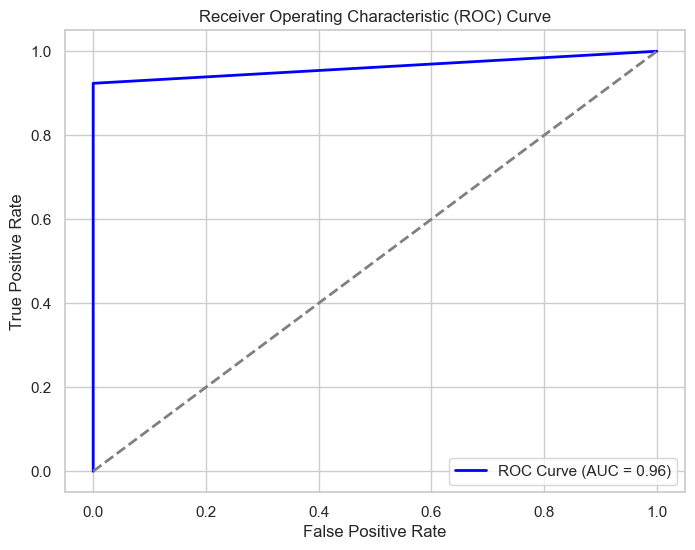

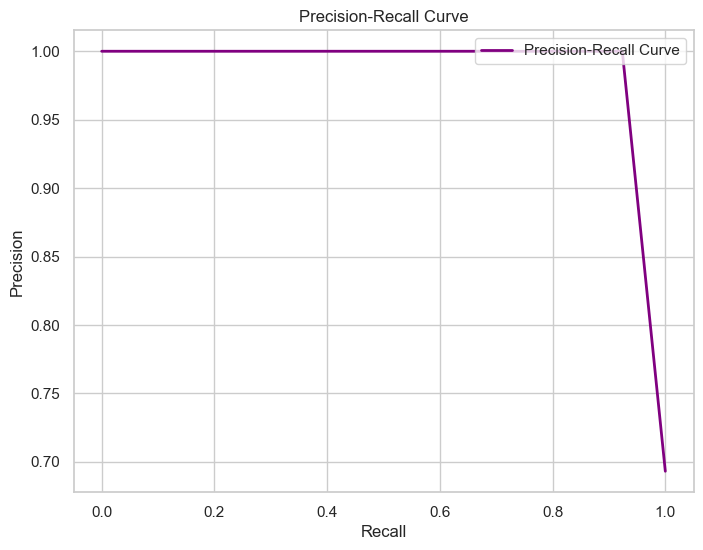

In [656]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    confusion_matrix, accuracy_score, precision_score, 
    recall_score, f1_score, roc_curve, auc, classification_report, precision_recall_curve
)

# Assuming `actual_labels` and `combined_predictions` are already defined
conf_matrix = confusion_matrix(actual_labels, combined_predictions)
accuracy = accuracy_score(actual_labels, combined_predictions)
precision = precision_score(actual_labels, combined_predictions)
recall = recall_score(actual_labels, combined_predictions)
f1 = f1_score(actual_labels, combined_predictions)

# Extract confusion matrix values
tn, fp, fn, tp = conf_matrix.ravel()
print(f"True Negatives: {tn}")
print(f"False Positives: {fp}")
print(f"False Negatives: {fn}")
print(f"True Positives: {tp}")

# Print evaluation metrics
print("Confusion Matrix:")
print(conf_matrix)
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("\nClassification Report:")
print(classification_report(actual_labels, combined_predictions))

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.show()

# ROC Curve and AUC (Assuming binary classification with probabilities available)
if len(set(actual_labels)) == 2:  # Ensure it's binary classification
    # Assuming probabilities are available for ROC plot
    if len(np.unique(combined_predictions)) < 2:
        combined_predictions = np.array([1 - x for x in combined_predictions])
        
    fpr, tpr, _ = roc_curve(actual_labels, combined_predictions)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.show()

    # Precision-Recall Curve
    precision_vals, recall_vals, _ = precision_recall_curve(actual_labels, combined_predictions)
    
    plt.figure(figsize=(8, 6))
    plt.plot(recall_vals, precision_vals, color='purple', lw=2, label='Precision-Recall Curve')
    plt.title('Precision-Recall Curve')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend(loc='upper right')
    plt.show()
